# KL-IG: 9-Method Evaluation (3σ variants + 5 baselines)
ResNet50, 100 images, 7 core metrics

#Setup

In [1]:
!git clone https://github.com/Shameen5375/KLIG_V1.git 2>/dev/null || echo "Repo already cloned"
!pip install -q captum datasets opencv-python-headless


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 455.2/455.2 kB 30.5 MB/s eta 0:00:00


In [2]:
import os, sys, math, json, pickle, warnings
from pathlib import Path
from collections import defaultdict
import copy

import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms as T
from PIL import Image
from torchvision.models import ResNet50_Weights, resnet50
from scipy import stats
from tqdm.auto import tqdm
import cv2

ROOT = Path.cwd()
for candidate in [ROOT, ROOT / "infocube-main",
                  Path("/content/KLIG_V1/infocube-main"),
                  Path("/content/KLIG_V1")]:
    if (candidate / "klig").exists():
        ROOT = candidate
        break
sys.path.append(str(ROOT))

from klig.image.attribution import ImageAttributor
from klig.image.stopping import find_sigma_stop
from klig.compare.captum_baselines import (
    run_ig, run_smoothgrad, run_expected_gradients, _absmax_collapse,
)
from captum.attr import IntegratedGradients, Saliency

warnings.filterwarnings("ignore", category=UserWarning)

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device: {DEVICE}")
print(f"Root:   {ROOT}")


Device: cuda
Root:   /content/KLIG_V1/infocube-main


In [3]:
#SAMPLE SIZE
N_IMGS    = 1000
N_subset  = 100
N_STEPS   = 50
N_SAMPLES = 10
TIER_A    = 1000
BLUR_SIGMA  = 16.0
BLUR_KERNEL = 51
IG_STEPS  = 50
EG_SAMPLES = 50
SG_SAMPLES = 50
BIG_STEPS  = 50
BIG_SIGMA  = 10.0

N_INSERTION_STEPS   = 50
N_SENS_SUBSETS      = 30
SENS_FRACTIONS      = [0.01, 0.02, 0.05, 0.1, 0.2, 0.3, 0.5, 0.7, 0.8]
PERTURBATION_SIGMAS = [0.01, 0.02, 0.05, 0.1, 0.2]
PERTURBATION_RUNS   = 3
OCCLUSION_PATCH  = 14
OCCLUSION_STRIDE = 7
OCCLUSION_RATIOS = [0.05, 0.10, 0.20, 0.30, 0.40, 0.50]

IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD  = [0.229, 0.224, 0.225]
TRANSFORM = T.Compose([
    T.Resize(256),
    T.CenterCrop(224),
    T.ToTensor(),
    T.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
])

HF_DATASET_NAME = "evanarlian/imagenet_1k_resized_256"
HF_SPLIT = "val"

# ── Persistent cache ─────────────────────────────────────

USE_DRIVE       = True
DRIVE_CACHE     = "/content/drive/MyDrive/klig_eval_cache"
LOCAL_CACHE     = "eval_cache"
FORCE_RECOMPUTE = False
if USE_DRIVE:
    try:
        from google.colab import drive
        if not Path("/content/drive").exists() or not any(Path("/content/drive").iterdir()):
            drive.mount("/content/drive")
        CACHE_DIR = Path(DRIVE_CACHE)
        print(f"[cache] Drive: {CACHE_DIR}")
    except Exception as e:
        CACHE_DIR = Path(LOCAL_CACHE)
        print(f"[cache] Drive unavailable ({e}) — falling back to {CACHE_DIR}")
else:
    CACHE_DIR = Path(LOCAL_CACHE)
    print(f"[cache] Local: {CACHE_DIR}")

CACHE_DIR.mkdir(parents=True, exist_ok=True)


methods_all = [
    "KL-IG (adaptive)",
    "KL-IG (σ=0.25)",
    "IDG",
    "ExpGrad",
    "IG-zero",
    "SmoothGrad",
    "Vanilla Grad",
    "Blur-IG",
]

COLORS_ALL = {
    "KL-IG (adaptive)":  "#1B5E3F",
    "KL-IG (σ=0.25)": "#3CB371",
    "IDG":            "#E07B39",
    "ExpGrad":        "#DC143C",
    "IG-zero":        "#7B68EE",
    "SmoothGrad":     "#1E90FF",
    "Vanilla Grad":   "#8B4513",
    "Blur-IG":        "#20B2AA",
}

print(f"N_IMGS={N_IMGS}, methods={len(methods_all)}")

Mounted at /content/drive
[cache] Drive: /content/drive/MyDrive/klig_eval_cache
N_IMGS=1000, methods=8


In [4]:
def load_model():
    weights = ResNet50_Weights.IMAGENET1K_V2
    model = resnet50(weights=weights).to(DEVICE).eval()
    return model, weights.meta["categories"]

def denormalize(x):
    mean = torch.tensor(IMAGENET_MEAN, device=x.device).view(-1, 1, 1)
    std = torch.tensor(IMAGENET_STD, device=x.device).view(-1, 1, 1)
    if x.dim() == 4:
        mean, std = mean.unsqueeze(0), std.unsqueeze(0)
    return (x * std + mean).clamp(0, 1)

def make_blur_baseline(x, kernel_size=BLUR_KERNEL, sigma=BLUR_SIGMA):
    coords = torch.arange(kernel_size, dtype=torch.float32, device=x.device) - kernel_size // 2
    k1d = torch.exp(-0.5 * (coords / sigma) ** 2)
    k1d = k1d / k1d.sum()
    kh = k1d.view(1, 1, -1, 1).expand(3, -1, -1, -1)
    kw = k1d.view(1, 1, 1, -1).expand(3, -1, -1, -1)
    pad = kernel_size // 2
    out = F.conv2d(x, kh, padding=(pad, 0), groups=3)
    return F.conv2d(out, kw, padding=(0, pad), groups=3)

def make_eg_background(x, n=50):
    return torch.randn(n, *x.squeeze(0).shape, device=x.device)
def get_sigma_final(sigma_name, model, x, target):
    if sigma_name == "adaptive":
        return min(max(find_sigma_stop(model, x, target=target, tau=0.95), 1.0/256.0), 1.0)
    elif sigma_name == "σ=0.25":
        return 0.25

model, imagenet_labels = load_model()
print(f"Model: ResNet50, {sum(p.numel() for p in model.parameters())/1e6:.1f}M params")


Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 160MB/s]


Model: ResNet50, 25.6M params


In [5]:
#from transformers import AutoImageProcessor, AutoModelForImageClassification
#import torch
#import torch.nn.functional as F
#
#DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
#
#class DeiTWrapper(torch.nn.Module):
#
#    def __init__(self, model):
#        super().__init__()
#        self.model = model
#    def forward(self, x):
#        return self.model(pixel_values=x).logits
#
#def load_model():
#    model_name = "facebook/deit-small-patch16-224"
#    processor  = AutoImageProcessor.from_pretrained(model_name)
#    base       = AutoModelForImageClassification.from_pretrained(model_name)
#    model      = DeiTWrapper(base).to(DEVICE).eval()
#    categories = [base.config.id2label[i] for i in range(base.config.num_labels)]
#    return model, processor, categories
#
#def denormalize(x):
#    mean = torch.tensor(IMAGENET_MEAN, device=x.device).view(-1, 1, 1)
#    std  = torch.tensor(IMAGENET_STD,  device=x.device).view(-1, 1, 1)
#    if x.dim() == 4:
#        mean, std = mean.unsqueeze(0), std.unsqueeze(0)
#    return (x * std + mean).clamp(0, 1)
#
#def make_blur_baseline(x, kernel_size=BLUR_KERNEL, sigma=BLUR_SIGMA):
#    coords = torch.arange(kernel_size, dtype=torch.float32, device=x.device) - kernel_size // 2
#    k1d = torch.exp(-0.5 * (coords / sigma) ** 2)
#    k1d = k1d / k1d.sum()
#    kh  = k1d.view(1, 1, -1, 1).expand(3, -1, -1, -1)
#    kw  = k1d.view(1, 1, 1, -1).expand(3, -1, -1, -1)
#    pad = kernel_size // 2
#    out = F.conv2d(x, kh, padding=(pad, 0), groups=3)
#    return F.conv2d(out, kw, padding=(0, pad), groups=3)
#
#def make_eg_background(x, n=50):
#    return torch.randn(n, *x.squeeze(0).shape, device=x.device)
#
#model, processor, imagenet_labels = load_model()
#print(f"DeiT: {sum(p.numel() for p in model.parameters())/1e6:.1f}M params")

In [6]:
def load_imagenet_subset(n_images):
    try:
        from datasets import load_dataset
        print(f"[dataset] HuggingFace {HF_DATASET_NAME} [{HF_SPLIT}]")
        ds = load_dataset(HF_DATASET_NAME, split=HF_SPLIT, streaming=True) \
         .shuffle(seed=42, buffer_size=50_000)
        seen, out = set(), []
        for ex in ds:
            y = int(ex["label"])
            if y in seen:
                continue
            seen.add(y)
            out.append((ex["image"].convert("RGB"), y))
            if len(out) >= n_images:
                break
        return out
    except Exception as e:
        print(f"[dataset] Failed: {e}")
        return []

raw_samples = load_imagenet_subset(TIER_A)
dataset = []
with torch.no_grad():
    for i, (pil, gt) in enumerate(tqdm(raw_samples, desc="prep")):
        x = TRANSFORM(pil).unsqueeze(0).to(DEVICE)
        probs = model(x).softmax(-1)[0]
        top1 = int(probs.argmax())
        target = gt if probs[gt].item() > 0.05 else top1
        dataset.append({
            "idx": i,
            "x": x,
            "target": target,
            "label_str": imagenet_labels[target],
        })

results = {}
for row in dataset:
    results[row["idx"]] = row

eval_idx = list(range(min(N_IMGS, len(dataset))))
print(f"Dataset: {len(dataset)} images, evaluating {len(eval_idx)}")


[dataset] HuggingFace evanarlian/imagenet_1k_resized_256 [val]


README.md: 0.00B [00:00, ?B/s]

Resolving data files:   0%|          | 0/52 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/52 [00:00<?, ?it/s]

prep:   0%|          | 0/1000 [00:00<?, ?it/s]

Dataset: 1000 images, evaluating 1000


In [7]:
##Catogery just to get wide range of samples while experimenting for smaller subset
CATEGORY_RANGES = {
    "fish":       [(0, 6), (389, 397)],
    "bird":       [(7, 24), (80, 100)],
    "reptile":    [(33, 68)],
    "dog":        [(151, 268)],
    "cat":        [(281, 285), (291, 293)],
    "bear":       [(294, 297)],
    "primate":    [(365, 382)],
    "instrument": [(401, 420), (486, 546), (683, 776)],
    "vehicle":    [(403, 408), (436, 436), (468, 468),
                   (555, 555), (627, 627), (654, 654),
                   (656, 656), (675, 675), (717, 717),
                   (734, 734), (779, 779), (817, 817),
                   (864, 864), (867, 867), (874, 874)],
    "structure":  [(425, 425), (483, 483), (497, 497),
                   (562, 562), (668, 668), (698, 698),
                   (727, 727), (832, 832), (975, 975)],
    "object":     [(409, 410), (440, 442), (487, 487),
                   (508, 508), (530, 530), (587, 587),
                   (664, 664), (754, 754), (782, 782)],
    "food":       [(924, 969)],
    "nature":     [(970, 999)],
}

def in_any_range(y, ranges):
    return any(lo <= y <= hi for lo, hi in ranges)

def load_imagenet_subset(n_images):
    from datasets import load_dataset
    print(f"[dataset] HuggingFace {HF_DATASET_NAME} [{HF_SPLIT}] (stratified)")
    ds = load_dataset(HF_DATASET_NAME, split=HF_SPLIT, streaming=True)

    per_cat = max(1, n_images // len(CATEGORY_RANGES))
    bucket  = {cat: 0 for cat in CATEGORY_RANGES}
    seen, out = set(), []

    for ex in ds:
        y = int(ex["label"])
        if y in seen:
            continue
        for cat, ranges in CATEGORY_RANGES.items():
            if bucket[cat] < per_cat and in_any_range(y, ranges):
                seen.add(y)
                bucket[cat] += 1
                out.append((ex["image"].convert("RGB"), y))
                break
        if len(out) >= n_images:
            break

    if len(out) < n_images:
        for ex in ds:
            y = int(ex["label"])
            if y in seen:
                continue
            seen.add(y)
            out.append((ex["image"].convert("RGB"), y))
            if len(out) >= n_images:
                break

    print(f"[dataset] per-category counts: {bucket}")
    return out

In [8]:
# ── Guided IG: Attribution function ─────────────────────────────────────────
import pandas as pd

GIG_COLOR = "#9B59B6"
METHOD    = "Guided IG"


def _attr_guided_ig(model, x, target, steps=50, fraction=0.25, max_dist_frac=0.1):
    """
    Guided IG (Kapishnikov et al., 2021).
    Iteratively walks from a zero baseline toward x along the path of greatest
    attribution magnitude, restricting each step to the top `fraction` of features
    by gain and limiting the step size to `max_dist_frac` of the remaining distance.
    """
    dev     = next(model.parameters()).device
    x0      = (x if x.dim() == 4 else x.unsqueeze(0)).to(dev).detach()[0]
    x_curr  = torch.zeros_like(x0)
    attr    = torch.zeros_like(x0)
    n_total = x0.numel()
    n_up    = max(1, int(fraction * n_total))
    model.eval()
    for _ in range(steps):
        dx = x0 - x_curr
        if dx.abs().max() < 1e-6:
            break
        x_t    = x_curr.unsqueeze(0).requires_grad_(True)
        grad   = torch.autograd.grad(model(x_t)[0, target], x_t)[0][0].detach()
        gain   = (grad * dx).abs().view(-1)
        thresh = gain.kthvalue(max(1, n_total - n_up + 1)).values
        mask   = (gain >= thresh).view_as(x0).float()
        step   = dx * max_dist_frac * mask
        attr  += grad * step
        x_curr += step
    return attr.detach()


def compute_guided_ig(model, x, target):
    """Wrapper matching the COMPUTE_FN signature for other methods."""
    return reduce_baseline_attr(_attr_guided_ig(model, x, target))


# ── Method dispatches ───────────────────────────────────────────────────────
#COMPUTE_FN = {
#    "IDG":          compute_idg,
#    "ExpGrad":      compute_expgrad,
#    "IG-zero":      compute_ig_zero,
#    "SmoothGrad":   compute_smoothgrad,
#    "Vanilla Grad": compute_vanilla_grad,
#    "Blur-IG":      compute_blurig,
#    "Guided IG":    compute_guided_ig,
#}
#
## Raw (unreduced) attribution dispatch — matches RAW_FN convention used elsewhere
RAW_FN_GIG = {
    "Guided IG": lambda model, x, target: _attr_guided_ig(model, x, target),
}

print("Attribution functions ready (Guided IG added)")

Attribution functions ready (Guided IG added)


In [9]:
# ── Collapse helpers ──
def absmax_collapse(a):
    if a.dim() == 4: a = a.squeeze(0)
    idx = a.abs().argmax(dim=0, keepdim=True)
    return a.gather(0, idx).squeeze(0)

def sum_collapse(a):
    if a.dim() == 4: a = a.squeeze(0)
    return a.sum(dim=0)

def _xb(model, x):
    xb = x.unsqueeze(0) if x.dim() == 3 else x
    return xb.to(next(model.parameters()).device)

# ── Raw (C,H,W) attribution helpers ──
from captum.attr import IntegratedGradients, Saliency

def raw_klig(model, x, target, sigma_final):
    return ImageAttributor(model, n_steps=N_STEPS, n_samples=N_SAMPLES,
                           sigma_final=sigma_final).attribute(x, target=target).attr

def raw_ig_zero(model, x, target):
    xb = _xb(model, x)
    return IntegratedGradients(model).attribute(
        xb, baselines=torch.zeros_like(xb), target=target,
        n_steps=IG_STEPS, method="gausslegendre",
        internal_batch_size=IG_STEPS).detach().squeeze(0)

def raw_blur_ig(model, x, target):
    xb = _xb(model, x)
    blur = make_blur_baseline(x)
    if blur.dim() == 3: blur = blur.unsqueeze(0)
    return IntegratedGradients(model).attribute(
        xb, baselines=blur.to(xb.device), target=target,
        n_steps=IG_STEPS, method="gausslegendre",
        internal_batch_size=IG_STEPS).detach().squeeze(0)

def raw_smoothgrad(model, x, target):
    xb  = _xb(model, x)
    std = 0.15 * float((xb.max() - xb.min()).item())
    noisy = (xb + torch.randn(SG_SAMPLES, *xb.shape[1:], device=xb.device) * std).requires_grad_(True)
    return torch.autograd.grad(model(noisy)[:, target].sum(), noisy)[0].detach().mean(dim=0)

def raw_vanilla(model, x, target):
    xb = _xb(model, x).requires_grad_(True)
    return Saliency(model).attribute(xb, target=target, abs=False).detach().squeeze(0)

def raw_expgrad(model, x, target):
    xb    = _xb(model, x)
    bg    = torch.randn(EG_SAMPLES, *xb.shape[1:], device=xb.device)
    alpha = torch.rand(EG_SAMPLES, 1, 1, 1, device=xb.device)
    interp = (bg + alpha * (xb - bg)).requires_grad_(True)
    grads  = torch.autograd.grad(model(interp)[:, target].sum(), interp)[0]
    return (grads.detach() * (xb - bg)).mean(dim=0)

def raw_idg(model, x, target):
    xb = _xb(model, x).requires_grad_(True)
    g  = torch.autograd.grad(model(xb)[:, target].sum(), xb)[0]
    return (xb * g).detach().squeeze(0)

RAW_FN = {
    "IDG":          raw_idg,
    "ExpGrad":      raw_expgrad,
    "IG-zero":      raw_ig_zero,
    "Blur-IG":      raw_blur_ig,
    "SmoothGrad":   raw_smoothgrad,
    "Vanilla Grad": raw_vanilla,
}

# ── Cache helpers ──
def cache_load(name):
    p = CACHE_DIR / f"{name}.pkl"
    if p.exists() and not FORCE_RECOMPUTE:
        with open(p, "rb") as f:
            return pickle.load(f)
    return None

def cache_save(name, obj):
    with open(CACHE_DIR / f"{name}.pkl", "wb") as f:
        pickle.dump(obj, f)

def sem(arr):
    arr = np.asarray(arr, dtype=np.float64)
    return float(arr.std() / np.sqrt(max(len(arr), 1)))

def ci95(arr):
    arr = np.asarray(arr, dtype=np.float64)
    return float(1.96 * arr.std() / np.sqrt(max(len(arr), 1)))


def sensitivity_n(model, x, attr_map, target,
                  fractions=SENS_FRACTIONS, n_subsets=N_SENS_SUBSETS):
    H, W = attr_map.shape; n_pix = H * W; C = x.shape[1]
    attr_flat = attr_map.detach().cpu().numpy().ravel()
    with torch.no_grad():
        f_orig = model(x).softmax(-1)[0, target].item()
    x0 = x.view(C, n_pix)
    pccs = []
    for frac in fractions:
        n = max(1, int(frac * n_pix))
        subsets   = np.stack([np.random.choice(n_pix, n, replace=False)
                              for _ in range(n_subsets)])         # (S, n)
        attr_sums = attr_flat[subsets].sum(axis=1)               # (S,) vectorized
        # Vectorized zero-mask via scatter
        mask = torch.zeros(n_subsets, n_pix, dtype=torch.bool, device=x.device)
        rows = torch.arange(n_subsets, device=x.device).repeat_interleave(n)
        cols = torch.from_numpy(subsets.ravel()).to(x.device)
        mask[rows, cols] = True
        x_batch = x0.unsqueeze(0).expand(n_subsets, -1, -1).clone()
        x_batch[mask.unsqueeze(1).expand(-1, C, -1)] = 0.0
        with torch.no_grad():
            f_masked = model(x_batch.view(n_subsets, C, H, W)).softmax(-1)[:, target].cpu().numpy()
        r, _ = stats.pearsonr(attr_sums, f_orig - f_masked)
        pccs.append(r if not np.isnan(r) else 0.0)
    return np.array(pccs)

# ── Batched insertion / deletion ──
def insertion_deletion(model, x, attr_map, target, substrate,
                       n_steps=N_INSERTION_STEPS, batch_size=64):
    C, H, W = x.shape[1], x.shape[2], x.shape[3]; n_pix = H * W
    order = attr_map.detach().view(-1).argsort(descending=True)
    pps = max(1, n_pix // n_steps); n_frames = n_steps + 1
    rank_step  = (torch.arange(n_pix) // pps + 1).clamp(max=n_steps)
    pixel_step = torch.zeros(n_pix, dtype=torch.long)
    pixel_step[order] = rank_step


    mask  = (pixel_step.view(1, -1) <= torch.arange(n_frames).view(-1, 1)
             ).float().unsqueeze(1).to(x.device)                 # (n_frames,1,n_pix)
    sub_f = substrate.view(1, C, n_pix)
    x_f   = x.view(1, C, n_pix)
    diff  = x_f - sub_f
    ins_batch = (sub_f + mask * diff).view(n_frames, C, H, W)
    del_batch = (x_f  - mask * diff).view(n_frames, C, H, W)

    with torch.no_grad():
        ins_sc, del_sc = [], []
        for i in range(0, n_frames, batch_size):
            ins_sc.append(model(ins_batch[i:i+batch_size]).softmax(-1)[:, target].cpu().numpy())
            del_sc.append(model(del_batch[i:i+batch_size]).softmax(-1)[:, target].cpu().numpy())
    ins = np.concatenate(ins_sc); dl = np.concatenate(del_sc)
    return float(np.trapz(ins, dx=1/n_steps)), float(np.trapz(dl, dx=1/n_steps)), ins, dl

def estimate_object_mask(x, attr_map):
    H, W = attr_map.shape
    a = np.abs(attr_map.detach().cpu().numpy())
    seed = (a >= np.percentile(a, 80)).astype(np.uint8)
    img_rgb = denormalize(x[0]).detach().cpu().permute(1, 2, 0).numpy()
    img_bgr = (img_rgb * 255).clip(0, 255).astype(np.uint8)[:, :, ::-1].copy()
    gc_mask = np.where(seed, cv2.GC_PR_FGD, cv2.GC_PR_BGD).astype(np.uint8)
    gc_mask[(a >= np.percentile(a, 95))] = cv2.GC_FGD
    edge_mask = np.zeros((H, W), dtype=np.uint8)
    border = max(H, W) // 10
    edge_mask[:border, :] = 1; edge_mask[-border:, :] = 1
    edge_mask[:, :border] = 1; edge_mask[:, -border:] = 1
    gc_mask[(edge_mask == 1) & (a < np.percentile(a, 10))] = cv2.GC_BGD
    try:
        bgd_model = np.zeros((1, 65), np.float64)
        fgd_model = np.zeros((1, 65), np.float64)
        cv2.grabCut(img_bgr, gc_mask, None, bgd_model, fgd_model, 5, cv2.GC_INIT_WITH_MASK)
        return np.where((gc_mask == cv2.GC_FGD) | (gc_mask == cv2.GC_PR_FGD), 1, 0).astype(np.uint8)
    except:
        return seed

def load_imagenet_s_mask(mask_path: Path) -> np.ndarray:
    m  = np.array(Image.open(mask_path))        # (H, W, 3), values in {0, 1}
    fg = Image.fromarray((m[:, :, 0] > 0).astype(np.uint8) * 255, mode="L")
    fg = MASK_TRANSFORM(fg)                     # nearest-neighbour 256→224
    return (np.array(fg) > 0).astype(np.uint8) # (224, 224) binary

def object_focus_ratio(attr_map, obj_mask):
    a = np.abs(attr_map.detach().cpu().numpy())
    total = a.sum()
    return float(a[obj_mask == 1].sum() / total) if total > 1e-12 else 0.0

def discriminative_concentration(attr_map, obj_mask):
    a = np.abs(attr_map.detach().cpu().numpy())
    total = a.sum()
    if total < 1e-12: return 0.0
    in_obj   = a[obj_mask == 1].sum() / total
    obj_area = obj_mask.sum() / obj_mask.size
    return float(in_obj / max(obj_area, 1e-12))

def gini_coefficient(attr_map):
    a = np.abs(attr_map.detach().cpu().numpy().ravel())
    a = a[a > 0]
    if len(a) == 0: return 0.0
    a = np.sort(a); n = len(a)
    return float((2 * np.sum(np.arange(1, n + 1) * a)) / (n * np.sum(a)) - (n + 1) / n)

def sanity_similarity(map_a, map_b):
    a = map_a.detach().cpu().numpy().ravel()
    b = map_b.detach().cpu().numpy().ravel()
    if a.std() < 1e-9 or b.std() < 1e-9: return 0.0
    rho, _ = stats.spearmanr(a, b)
    return 0.0 if np.isnan(rho) else float(rho)
# ── Occlusion helpers ──
import math as _math

def ratio_to_patch(ratio, img_size=224):
    return max(2, int(round(_math.sqrt(ratio * img_size * img_size))))

def occlusion_map(model, x, target, ps, stride=OCCLUSION_STRIDE, batch_size=64):
    """Batched: ~batch_size patch positions per forward pass."""
    _, C, H, W = x.shape
    positions = [(h, w)
                 for h in range(0, H - ps + 1, stride)
                 for w in range(0, W - ps + 1, stride)]
    n_h = len(range(0, H - ps + 1, stride))
    n_w = len(range(0, W - ps + 1, stride))
    with torch.no_grad():
        f0 = model(x)[0, target].item()
        scores = []
        for i in range(0, len(positions), batch_size):
            bpos = positions[i : i + batch_size]
            batch = x.expand(len(bpos), -1, -1, -1).clone()
            for k, (h, w) in enumerate(bpos):
                batch[k, :, h : h + ps, w : w + ps] = 0.0
            scores.append(model(batch)[:, target].cpu().numpy())
    return (f0 - np.concatenate(scores)).reshape(n_h, n_w)

def attr_to_grid(attr_map, ps, stride, H, W):
    """Vectorized patch-mean via avg_pool2d."""
    a = attr_map.detach().abs().float().unsqueeze(0).unsqueeze(0)
    pooled = F.avg_pool2d(a, kernel_size=ps, stride=stride, padding=0)
    n_h = len(range(0, H - ps + 1, stride))
    n_w = len(range(0, W - ps + 1, stride))
    return pooled[0, 0, :n_h, :n_w].cpu().numpy()

# ── Infidelity ──
def infidelity(model, x, attr_map, target, n_perturbations=30, noise_sigma=0.1):
    """Batched: all perturbations in one forward pass."""
    with torch.no_grad():
        f_x  = model(x)[0, target].item()
        I    = torch.randn(n_perturbations, *x.shape[1:], device=x.device) * noise_sigma
        f_xp = model(x - I)[:, target].cpu().numpy()                        # (N,)
        dot  = (I * attr_map.unsqueeze(0).unsqueeze(0)).view(n_perturbations, -1).sum(dim=1).cpu().numpy()
    return float(np.mean((dot - (f_x - f_xp)) ** 2))

print("Metric functions ready (fully batched)")


Metric functions ready (fully batched)


#METRICS

#1. Sensitivity_n

[cache] Loaded from /content/drive/MyDrive/klig_eval_cache/sens_n_deit.pkl


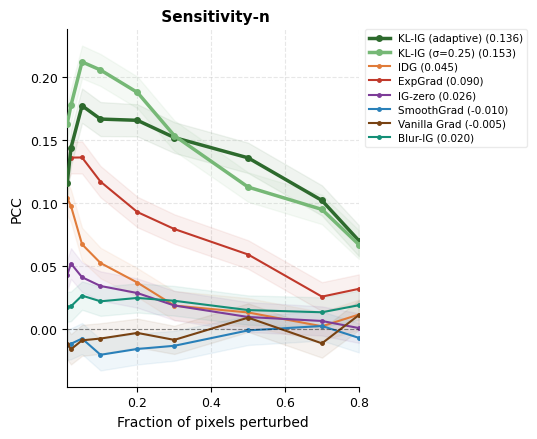

In [ ]:
# ── Metric 1: Sensitivity-n ──
import pandas as pd

_cache = CACHE_DIR / "sens_n_deit.pkl"
_csv   = CACHE_DIR / "sens_n_deit.csv"

if not FORCE_RECOMPUTE and _cache.exists():
    with open(_cache, "rb") as f:
        all_sens, all_sens_mean = pickle.load(f)
    print(f"[cache] Loaded from {_cache}")

elif not FORCE_RECOMPUTE and _csv.exists():
    df_sens = pd.read_csv(_csv)
    all_sens      = {m: [] for m in methods_all}
    all_sens_mean = {m: [] for m in methods_all}
    for m in methods_all:
        sub = df_sens[df_sens.method == m]
        for _, grp in sub.groupby("img_i"):
            curve = grp.sort_values("frac")["pcc"].to_numpy()
            all_sens[m].append(curve)
            all_sens_mean[m].append(float(curve.mean()))
    print(f"[csv] Reconstructed from {_csv}")

else:
    all_sens      = {m: [] for m in methods_all}
    all_sens_mean = {m: [] for m in methods_all}

    for idx in tqdm(eval_idx, desc="sensitivity-n"):
        r = results[idx]; x, tgt = r["x"], r["target"]

        for sigma_name in ["adaptive", "σ=0.25"]:
            sf = get_sigma_final(sigma_name, model, x, tgt)
            _, amap = compute_klig(model, x, tgt, sf)
            curve = sensitivity_n(model, x, amap, tgt)
            m = f"KL-IG ({sigma_name})"
            all_sens[m].append(curve)
            all_sens_mean[m].append(float(curve.mean()))

        for m in ["IDG", "ExpGrad", "IG-zero", "SmoothGrad", "Vanilla Grad", "Blur-IG"]:
            amap  = COMPUTE_FN[m](model, x, tgt)
            curve = sensitivity_n(model, x, amap, tgt)
            all_sens[m].append(curve)
            all_sens_mean[m].append(float(curve.mean()))

    # save pickle
    with open(_cache, "wb") as f:
        pickle.dump((all_sens, all_sens_mean), f)

    # save CSV (long format — survives runtime reset)
    rows = []
    for m in methods_all:
        for img_i, curve in enumerate(all_sens[m]):
            for frac, pcc in zip(SENS_FRACTIONS, curve):
                rows.append({"method": m, "img_i": img_i, "frac": frac, "pcc": float(pcc)})
    pd.DataFrame(rows).to_csv(_csv, index=False)

    # save summary CSV
    pd.DataFrame([{
        "method":   m,
        "mean_pcc": round(np.mean(all_sens_mean[m]), 4),
        "ci95":     round(ci95(all_sens_mean[m]), 4),
        "std":      round(np.std(all_sens_mean[m]), 4),
        "n_images": len(all_sens_mean[m]),
    } for m in methods_all]).to_csv(CACHE_DIR / "sens_n_summary_deit.csv", index=False)

    print(f"[cache] Saved pkl + csv to {CACHE_DIR}")

# ── Plot: line with 95% CI band ──
n = len(next(iter(all_sens.values())))
fracs = np.array(SENS_FRACTIONS)
fig, ax = plt.subplots(figsize=(5.5, 4.5), facecolor="white")
for m in methods_all:
    stacked = np.stack(all_sens[m])
    mu = stacked.mean(axis=0)
    ci = 1.96 * stacked.std(axis=0) / np.sqrt(n)
    lw = 2.5 if "KL-IG" in m else 1.5
    zo = 3   if "KL-IG" in m else 2
    ax.plot(fracs, mu, "o-", color=COLORS_ALL[m], lw=lw, ms=4 if "KL-IG" in m else 2.5,
            zorder=zo, label=f"{m} ({mu.mean():.3f})")
    ax.fill_between(fracs, mu - ci, mu + ci, color=COLORS_ALL[m], alpha=0.07, zorder=zo-1)
ax.axhline(0, color="black", ls="--", lw=0.8, alpha=0.4)
ax.set_xlabel("Fraction of pixels perturbed", fontsize=10)
ax.set_ylabel("PCC", fontsize=10)
ax.set_xlim(fracs[0], fracs[-1])
ax.set_title(" Sensitivity-n", fontweight="bold", fontsize=11)
ax.tick_params(labelsize=9)
ax.yaxis.grid(True, linestyle="--", alpha=0.3); ax.xaxis.grid(True, linestyle="--", alpha=0.3)
ax.set_axisbelow(True)
ax.spines["top"].set_visible(False); ax.spines["right"].set_visible(False)
ax.legend(fontsize=7.5, bbox_to_anchor=(1.02, 1), loc="upper left",
          borderaxespad=0, framealpha=0.4, handlelength=2.0, labelspacing=0.4)
plt.tight_layout()
plt.savefig("sens_n.pdf", bbox_inches="tight", dpi=300)
plt.show()

#2.Insertion Deletion


In [ ]:
def insertion_deletion(model, x, attr_map, target,
                       n_steps=N_INSERTION_STEPS, batch_size=64):
    C, H, W = x.shape[1], x.shape[2], x.shape[3]; n_pix = H * W
    order = attr_map.detach().view(-1).argsort(descending=True)
    pps = max(1, n_pix // n_steps); n_frames = n_steps + 1

    rank_step  = (torch.arange(n_pix) // pps + 1).clamp(max=n_steps)
    pixel_step = torch.zeros(n_pix, dtype=torch.long)
    pixel_step[order] = rank_step

    mask = (pixel_step.view(1, -1) <= torch.arange(n_frames).view(-1, 1)
            ).float().unsqueeze(1).to(x.device)   # (n_frames,1,n_pix)

    x_f      = x.view(1, C, n_pix)
    blur_sub = make_blur_baseline(x).view(1, C, n_pix)   # insertion: blur → image
    zero_sub = torch.zeros_like(x_f)                      # deletion:  image → zeros

    ins_batch = (blur_sub + mask * (x_f - blur_sub)).view(n_frames, C, H, W)
    del_batch = (x_f      - mask * (x_f - zero_sub)).view(n_frames, C, H, W)

    with torch.no_grad():
        ins_sc, del_sc = [], []
        for i in range(0, n_frames, batch_size):
            ins_sc.append(model(ins_batch[i:i+batch_size]).softmax(-1)[:, target].cpu().numpy())
            del_sc.append(model(del_batch[i:i+batch_size]).softmax(-1)[:, target].cpu().numpy())
    ins = np.concatenate(ins_sc); dl = np.concatenate(del_sc)
    return float(np.trapz(ins, dx=1/n_steps)), float(np.trapz(dl, dx=1/n_steps)), ins, dl

In [ ]:
# ── Metric 2: Insertion / Deletion (blur substrate for insertion, zeros for deletion) ──
import pandas as pd

_cache = CACHE_DIR / "ins_del_deit.pkl"
_csv   = CACHE_DIR / "ins_del_deit.csv"

if not FORCE_RECOMPUTE and _cache.exists():
    with open(_cache, "rb") as f:
        ins_auc, del_auc, ins_curves, del_curves = pickle.load(f)
    print(f"[cache] Loaded from {_cache}")

elif not FORCE_RECOMPUTE and _csv.exists():
    df_id = pd.read_csv(_csv)
    ins_auc    = {m: [] for m in methods_all}
    del_auc    = {m: [] for m in methods_all}
    ins_curves = {m: [] for m in methods_all}
    del_curves = {m: [] for m in methods_all}
    for m in methods_all:
        sub = df_id[df_id.method == m]
        for _, grp in sub.groupby("img_i"):
            grp_s = grp.sort_values("step")
            ins_curves[m].append(grp_s["ins"].to_numpy())
            del_curves[m].append(grp_s["del"].to_numpy())
            ins_auc[m].append(float(np.trapz(grp_s["ins"].to_numpy(), dx=1/N_INSERTION_STEPS)))
            del_auc[m].append(float(np.trapz(grp_s["del"].to_numpy(), dx=1/N_INSERTION_STEPS)))
    print(f"[csv] Reconstructed from {_csv}")

else:
    ins_auc    = {m: [] for m in methods_all}
    del_auc    = {m: [] for m in methods_all}
    ins_curves = {m: [] for m in methods_all}
    del_curves = {m: [] for m in methods_all}

    for idx in tqdm(eval_idx, desc="insertion/deletion"):
        r = results[idx]; x, tgt = r["x"], r["target"]

        for sigma_name in ["adaptive", "σ=0.25"]:
            sf  = get_sigma_final(sigma_name, model, x, tgt)
            raw = raw_klig(model, x, tgt, sf)
            m   = f"KL-IG ({sigma_name})"
            ia, da, ic, dc = insertion_deletion(model, x, sum_collapse(raw), tgt)
            ins_auc[m].append(ia); del_auc[m].append(da)
            ins_curves[m].append(ic); del_curves[m].append(dc)

        for m, fn in RAW_FN.items():
            raw = fn(model, x, tgt)
            ia, da, ic, dc = insertion_deletion(model, x, sum_collapse(raw), tgt)
            ins_auc[m].append(ia); del_auc[m].append(da)
            ins_curves[m].append(ic); del_curves[m].append(dc)

    with open(_cache, "wb") as f:
        pickle.dump((ins_auc, del_auc, ins_curves, del_curves), f)

    rows = []
    for m in methods_all:
        for img_i, (ic, dc) in enumerate(zip(ins_curves[m], del_curves[m])):
            for step, (i_s, d_s) in enumerate(zip(ic, dc)):
                rows.append({"method": m, "img_i": img_i, "step": step,
                             "ins": float(i_s), "del": float(d_s)})
    pd.DataFrame(rows).to_csv(_csv, index=False)

    pd.DataFrame([{
        "method":   m,
        "ins_mean": round(np.mean(ins_auc[m]), 4),
        "ins_ci95": round(ci95(ins_auc[m]), 4),
        "del_mean": round(np.mean(del_auc[m]), 4),
        "del_ci95": round(ci95(del_auc[m]), 4),
        "n_images": len(ins_auc[m]),
    } for m in methods_all]).to_csv(CACHE_DIR / "ins_del_summary_deit.csv", index=False)

    print(f"[cache] Saved pkl + csv to {CACHE_DIR}")

[cache] Loaded from /content/drive/MyDrive/klig_eval_cache/ins_del_blur.pkl


/tmp/ipykernel_1103/3175640785.py:13: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  ins_aucs.append(np.trapz(grp_s["ins"].to_numpy(), dx=1/N_INSERTION_STEPS))
/tmp/ipykernel_1103/3175640785.py:14: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  del_aucs.append(np.trapz(grp_s["del"].to_numpy(), dx=1/N_INSERTION_STEPS))


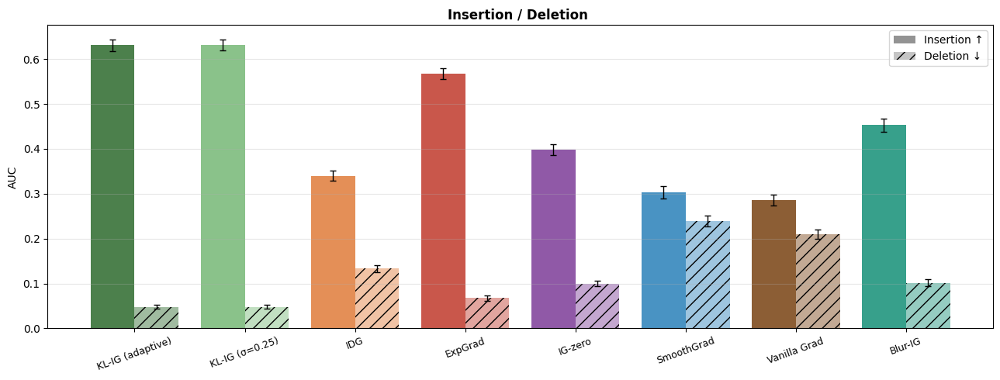

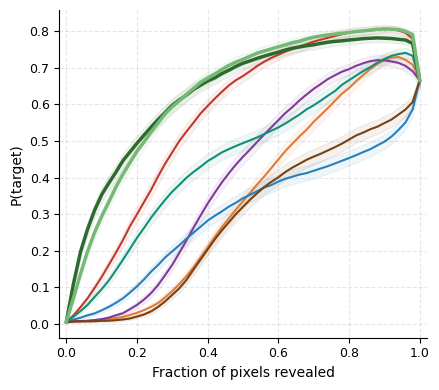

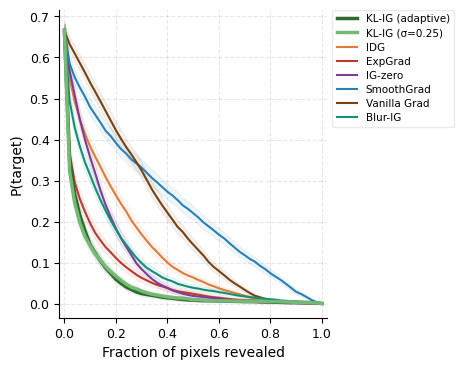

In [ ]:
# ── I/D AUC bars + curves (reads from CSV) ──
import pandas as pd

df_id = pd.read_csv(CACHE_DIR / "ins_del_deit.csv")

# ── Compute AUC per image from curves ──
records = []
for m in methods_all:
    sub = df_id[df_id.method == m]
    ins_aucs, del_aucs = [], []
    for _, grp in sub.groupby("img_i"):
        grp_s = grp.sort_values("step")
        ins_aucs.append(np.trapz(grp_s["ins"].to_numpy(), dx=1/N_INSERTION_STEPS))
        del_aucs.append(np.trapz(grp_s["del"].to_numpy(), dx=1/N_INSERTION_STEPS))
    records.append({
        "method":   m,
        "ins_mean": np.mean(ins_aucs),
        "ins_ci95": 1.96 * np.std(ins_aucs) / np.sqrt(len(ins_aucs)),
        "del_mean": np.mean(del_aucs),
        "del_ci95": 1.96 * np.std(del_aucs) / np.sqrt(len(del_aucs)),
        "n_images": len(ins_aucs),
    })

df_sum = pd.DataFrame(records).set_index("method").reindex(methods_all)
n = int(df_sum["n_images"].iloc[0])

ins_means = df_sum["ins_mean"].to_numpy()
del_means = df_sum["del_mean"].to_numpy()
ins_cis   = df_sum["ins_ci95"].to_numpy()
del_cis   = df_sum["del_ci95"].to_numpy()
x_pos     = np.arange(len(methods_all))

# ── Bar chart ──
fig, ax = plt.subplots(figsize=(13, 5), facecolor="white")
for xi, m in enumerate(methods_all):
    c = COLORS_ALL[m]
    ax.bar(xi - 0.2, ins_means[xi], 0.4, color=c, alpha=0.85,
           yerr=ins_cis[xi], capsize=3, error_kw=dict(lw=1))
    ax.bar(xi + 0.2, del_means[xi], 0.4, color=c, alpha=0.45, hatch="//",
           yerr=del_cis[xi], capsize=3, error_kw=dict(lw=1))
from matplotlib.patches import Patch
ax.legend(handles=[Patch(facecolor="gray", alpha=0.85,             label="Insertion ↑"),
                   Patch(facecolor="gray", alpha=0.45, hatch="//", label="Deletion ↓")])
ax.set_xticks(x_pos); ax.set_xticklabels(methods_all, rotation=20, fontsize=9)
ax.set_ylabel("AUC")
ax.set_title(f"Insertion / Deletion ", fontweight="bold")
ax.grid(axis="y", alpha=0.3)
plt.tight_layout(); plt.show()

# ── Mean curves ──
# ── Mean curves ──
ins_curves_p = {m: [] for m in methods_all}
del_curves_p = {m: [] for m in methods_all}
for m in methods_all:
    sub = df_id[df_id.method == m]
    for _, grp in sub.groupby("img_i"):
        grp_s = grp.sort_values("step")
        ins_curves_p[m].append(grp_s["ins"].to_numpy())
        del_curves_p[m].append(grp_s["del"].to_numpy())

steps = np.linspace(0, 1, N_INSERTION_STEPS + 1)

# Save insertion separately
fig_i, ax_i = plt.subplots(figsize=(4.5, 4), facecolor="white")
for m in methods_all:
    ic   = np.stack(ins_curves_p[m])
    mu_i = ic.mean(0)
    ci_i = 1.96 * ic.std(0) / np.sqrt(n)
    lw   = 2.5 if "KL-IG" in m else 1.5
    zo   = 3   if "KL-IG" in m else 2
    ax_i.plot(steps, mu_i, color=COLORS_ALL[m], lw=lw, zorder=zo, label=m)
    ax_i.fill_between(steps, mu_i - ci_i, mu_i + ci_i,
                      color=COLORS_ALL[m], alpha=0.07, zorder=zo-1)
ax_i.set_xlabel("Fraction of pixels revealed", fontsize=10)
ax_i.set_ylabel("P(target)", fontsize=10)
ax.set_title(f"Insertion", fontweight="bold")
ax_i.set_xlim(-0.02, 1.02)
ax_i.tick_params(labelsize=9)
ax_i.yaxis.grid(True, linestyle="--", alpha=0.3, zorder=0)
ax_i.xaxis.grid(True, linestyle="--", alpha=0.3, zorder=0)
ax_i.set_axisbelow(True)
ax_i.spines["top"].set_visible(False)
ax_i.spines["right"].set_visible(False)
ax_i.get_legend() and None
fig_i.tight_layout()
fig_i.savefig("ins_curves.pdf", bbox_inches="tight", dpi=300)
plt.show()

# Save deletion separately
fig_d, ax_d = plt.subplots(figsize=(4.5, 4), facecolor="white")
for m in methods_all:
    dc   = np.stack(del_curves_p[m])
    mu_d = dc.mean(0)
    ci_d = 1.96 * dc.std(0) / np.sqrt(n)
    lw   = 2.5 if "KL-IG" in m else 1.5
    zo   = 3   if "KL-IG" in m else 2
    ax_d.plot(steps, mu_d, color=COLORS_ALL[m], lw=lw, zorder=zo, label=m)
    ax_d.fill_between(steps, mu_d - ci_d, mu_d + ci_d,
                      color=COLORS_ALL[m], alpha=0.07, zorder=zo-1)
ax_d.set_xlabel("Fraction of pixels revealed", fontsize=10)
ax_d.set_ylabel("P(target)", fontsize=10)
ax_d.set_xlim(-0.02, 1.02)
ax_d.tick_params(labelsize=9)
ax.set_title(f"Deletion", fontweight="bold")
ax_d.yaxis.grid(True, linestyle="--", alpha=0.3, zorder=0)
ax_d.xaxis.grid(True, linestyle="--", alpha=0.3, zorder=0)
ax_d.set_axisbelow(True)
ax_d.spines["top"].set_visible(False)
ax_d.spines["right"].set_visible(False)
ax_d.legend(
    fontsize=7.5,
    bbox_to_anchor=(1.02, 1),
    loc="upper left",
    borderaxespad=0,
    framealpha=0.4,
    handlelength=2.0,
    labelspacing=0.4
)
fig_d.subplots_adjust(right=0.72)
fig_d.savefig("del_curves.pdf", bbox_inches="tight", dpi=300)
plt.show()

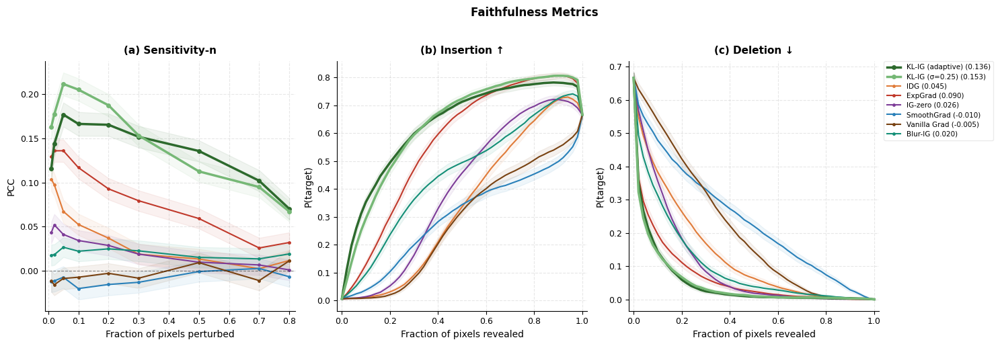

In [ ]:
# ── Combined: Sensitivity-n | Insertion | Deletion ──
n     = len(next(iter(all_sens.values())))
fracs = np.array(SENS_FRACTIONS)
steps = np.linspace(0, 1, N_INSERTION_STEPS + 1)

fig, axes = plt.subplots(1, 3, figsize=(16, 5), facecolor="white")

for m in methods_all:
    lw = 2.5 if "KL-IG" in m else 1.5
    zo = 3   if "KL-IG" in m else 2
    ms = 4   if "KL-IG" in m else 2.5

    # ── (a) Sensitivity-n ──
    stacked = np.stack(all_sens[m])
    mu      = stacked.mean(axis=0)
    ci      = 1.96 * stacked.std(axis=0) / np.sqrt(n)
    axes[0].plot(fracs, mu, "o-", color=COLORS_ALL[m], lw=lw,
                 ms=ms, zorder=zo, label=f"{m} ({mu.mean():.3f})")
    axes[0].fill_between(fracs, mu - ci, mu + ci,
                         color=COLORS_ALL[m], alpha=0.07, zorder=zo-1)

    # ── (b) Insertion ──
    ic   = np.stack(ins_curves_p[m])
    mu_i = ic.mean(0)
    ci_i = 1.96 * ic.std(0) / np.sqrt(n)
    axes[1].plot(steps, mu_i, color=COLORS_ALL[m], lw=lw, zorder=zo, label=m)
    axes[1].fill_between(steps, mu_i - ci_i, mu_i + ci_i,
                         color=COLORS_ALL[m], alpha=0.07, zorder=zo-1)

    # ── (c) Deletion ──
    dc   = np.stack(del_curves_p[m])
    mu_d = dc.mean(0)
    ci_d = 1.96 * dc.std(0) / np.sqrt(n)
    axes[2].plot(steps, mu_d, color=COLORS_ALL[m], lw=lw, zorder=zo, label=m)
    axes[2].fill_between(steps, mu_d - ci_d, mu_d + ci_d,
                         color=COLORS_ALL[m], alpha=0.07, zorder=zo-1)

# ── Reference line sens-n only ──
axes[0].axhline(0, color="black", ls="--", lw=0.8, alpha=0.4)

# ── Axis labels ──
axes[0].set_xlabel("Fraction of pixels perturbed", fontsize=10)
axes[0].set_ylabel("PCC", fontsize=10)
axes[0].set_xlim(fracs[0] - 0.02, fracs[-1] + 0.02)

axes[1].set_xlabel("Fraction of pixels revealed", fontsize=10)
axes[1].set_ylabel("P(target)", fontsize=10)
axes[1].set_xlim(-0.02, 1.02)

axes[2].set_xlabel("Fraction of pixels revealed", fontsize=10)
axes[2].set_ylabel("P(target)", fontsize=10)
axes[2].set_xlim(-0.02, 1.02)

# ── Titles ──
axes[0].set_title("(a) Sensitivity-n",  fontweight="bold", fontsize=11, pad=8)
axes[1].set_title("(b) Insertion ↑",       fontweight="bold", fontsize=11, pad=8)
axes[2].set_title("(c) Deletion ↓",        fontweight="bold", fontsize=11, pad=8)

# ── Shared formatting ──
for ax in axes:
    ax.yaxis.grid(True, linestyle="--", alpha=0.3, zorder=0)
    ax.xaxis.grid(True, linestyle="--", alpha=0.3, zorder=0)
    ax.set_axisbelow(True)
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.tick_params(labelsize=9)

# ── Single legend on rightmost panel ──
handles, labels = axes[0].get_legend_handles_labels()
axes[2].legend(
    handles, labels,
    fontsize=7.5,
    bbox_to_anchor=(1.02, 1),
    loc="upper left",
    borderaxespad=0,
    framealpha=0.4,
    handlelength=2.0,
    labelspacing=0.4
)

plt.suptitle(
    f"Faithfulness Metrics",
    fontweight="bold",
    fontsize=12,
    y=1.02
)

plt.tight_layout()
fig.subplots_adjust(right=0.82)
plt.savefig("faithfulness_combined.pdf", bbox_inches="tight", dpi=300)
plt.show()

# 3. OFR

In [ ]:
# ── OFR Qualitative: pos/neg heatmap helper (cividis) ──
def plot_attr_pn(ax_pos, ax_neg, x, raw_attr, obj_mask=None):
    img  = np.clip(denormalize(x[0]).detach().cpu().permute(1,2,0).numpy(), 0, 1)
    gray = np.mean(img, axis=2)
    for ax, a_hw, cmap in [
        (ax_pos, raw_attr.clamp(min=0).sum(dim=0),       "cividis"),
        (ax_neg, raw_attr.clamp(max=0).abs().sum(dim=0), "cividis_r"),
    ]:
        a = a_hw.detach().cpu().numpy()
        a = gaussian_filter(a, sigma=2)
        vmax = np.percentile(a, 99); vmax = vmax if vmax > 1e-12 else 1.0
        ax.imshow(gray, cmap="gray", vmin=0, vmax=1)
        ax.imshow(np.clip(a / vmax, 0, 1), cmap=cmap, vmin=0, vmax=1, alpha=0.65)
        if obj_mask is not None:
            cnts, _ = cv2.findContours(obj_mask.astype(np.uint8),
                                       cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
            for cnt in cnts:
                pts = cnt[:, 0, :]
                ax.plot(np.append(pts[:,0], pts[0,0]),
                        np.append(pts[:,1], pts[0,1]),
                        color="white", lw=1.2)
        ax.set_xticks([]); ax.set_yticks([])

In [ ]:
# ── OFR Qualitative: GT seg masks — score + plot ──────────────────────────
from scipy.ndimage import gaussian_filter
from datasets import load_dataset
from PIL import Image as PILImage

SCORE_POOL_SIZE = 100
N_SHOW          = 8

MASK_TRANSFORM = T.Compose([
    T.Resize(256, interpolation=T.InterpolationMode.NEAREST),
    T.CenterCrop(224),
])

def load_imagenet_s_mask(mask_pil):
    m  = np.array(mask_pil)
    fg = PILImage.fromarray((m[:, :, 0] > 0).astype(np.uint8) * 255, mode="L")
    return (np.array(MASK_TRANSFORM(fg)) > 0).astype(np.uint8)

def plot_attr_pn(ax_pos, ax_neg, x, raw_attr, obj_mask=None):
    img  = np.clip(denormalize(x[0]).detach().cpu().permute(1,2,0).numpy(), 0, 1)
    gray = np.mean(img, axis=2)
    for ax, a_hw, cmap in [
        (ax_pos, raw_attr.clamp(min=0).sum(dim=0),        "cividis"),
        (ax_neg, raw_attr.clamp(max=0).abs().sum(dim=0),  "cividis_r"),
    ]:
        a    = gaussian_filter(a_hw.detach().cpu().numpy(), sigma=2)
        vmax = np.percentile(a, 99); vmax = vmax if vmax > 1e-12 else 1.0
        ax.imshow(gray, cmap="gray", vmin=0, vmax=1)
        ax.imshow(np.clip(a / vmax, 0, 1), cmap=cmap, alpha=0.65)
        if obj_mask is not None:
            cnts, _ = cv2.findContours(obj_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
            for cnt in cnts:
                pts = cnt[:, 0, :]
                ax.plot(np.append(pts[:,0], pts[0,0]),
                        np.append(pts[:,1], pts[0,1]), color="white", lw=1.2)
        ax.set_xticks([]); ax.set_yticks([])

# ── Score ──
scored = []
ds_seg = load_dataset("braceletboy/imagenet-s", split="validation", streaming=True)

for ex in tqdm(ds_seg, desc="scoring", total=SCORE_POOL_SIZE):
    tgt = int(ex["label"])
    if tgt < 0 or tgt >= 1000: continue

    x        = TRANSFORM(ex["image"].convert("RGB")).unsqueeze(0).to(DEVICE)
    obj_mask = load_imagenet_s_mask(ex["mask"])
    frac     = obj_mask.mean()
    if frac < 0.02 or frac > 0.85: continue

    with torch.no_grad():
        if model(x).argmax(1).item() != tgt: continue

    sf        = get_sigma_final("adaptive", model, x, tgt)
    raw_k     = raw_klig(model, x, tgt, sf)
    klig_amap = sum_collapse(raw_k)
    ofr_klig  = object_focus_ratio(klig_amap, obj_mask)
    ofr_base  = [object_focus_ratio(sum_collapse(RAW_FN[m](model, x, tgt)), obj_mask)
                 for m in ["IDG","ExpGrad","IG-zero","SmoothGrad","Vanilla Grad","Blur-IG"]]
    margin = ofr_klig - float(np.mean(ofr_base))
    scored.append((ofr_klig + 0.5*margin, ofr_klig, margin, x, tgt, raw_k, obj_mask))
    if len(scored) >= SCORE_POOL_SIZE: break

scored.sort(key=lambda t: -t[0])
top = scored[:N_SHOW]
print(f"Top {N_SHOW}:")
for s, ok, mg, x, tgt, _, _ in top:
    print(f"  OFR={ok:.3f}  margin={mg:+.3f}  {imagenet_labels[tgt]}")



scoring:   0%|          | 0/100 [00:00<?, ?it/s]

/tmp/ipykernel_1148/1425260552.py:16: DeprecationWarning: 'mode' parameter is deprecated and will be removed in Pillow 13 (2026-10-15)
  fg = PILImage.fromarray((m[:, :, 0] > 0).astype(np.uint8) * 255, mode="L")


KeyboardInterrupt: 

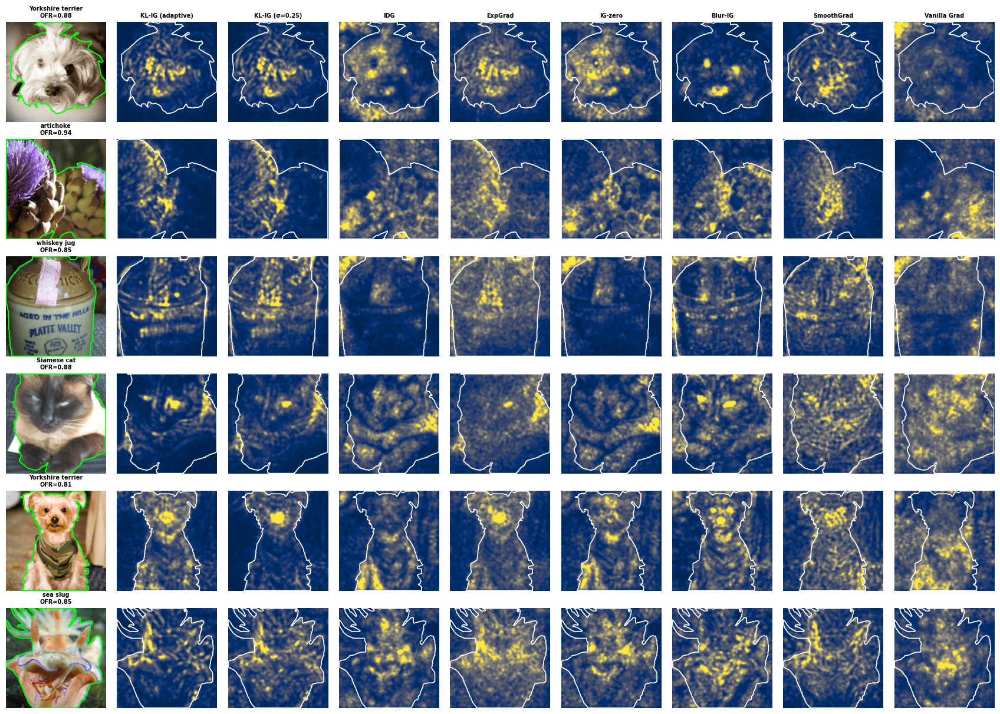

In [ ]:
# ── Plot qualitative attribution comparison for 6–8 images ────────────────
import numpy as np
import matplotlib.pyplot as plt
import cv2
from scipy.ndimage import gaussian_filter

# Choose how many images to show
N_SHOW = 8   # change to 6, 7, or 8

VIS_METHODS = [
    "KL-IG (adaptive)",
    "KL-IG (σ=0.25)",
    "IDG",
    "ExpGrad",
    "IG-zero",
    "Blur-IG",
    "SmoothGrad",
    "Vanilla Grad",
]

N_SHOW = min(N_SHOW, len(top))
N_COLS = 1 + len(VIS_METHODS)


def plot_attr(ax, raw_attr, obj_mask=None):
    """
    Plot positive attribution heatmap with optional object-mask contour.
    raw_attr: tensor shaped (C,H,W) or (1,C,H,W)
    obj_mask: binary mask shaped (H,W)
    """
    if raw_attr.dim() == 4:
        raw_attr = raw_attr.squeeze(0)

    a = raw_attr.clamp(min=0).sum(dim=0).detach().cpu().numpy()
    a = gaussian_filter(a, sigma=2)

    vmax = np.percentile(a, 99)
    if vmax <= 1e-12:
        vmax = 1.0

    ax.imshow(np.clip(a / vmax, 0, 1), cmap="cividis")

    if obj_mask is not None:
        mask_uint8 = obj_mask.astype(np.uint8)
        cnts, _ = cv2.findContours(mask_uint8, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        for cnt in cnts:
            if len(cnt) < 3:
                continue
            pts = cnt[:, 0, :]
            ax.plot(
                np.append(pts[:, 0], pts[0, 0]),
                np.append(pts[:, 1], pts[0, 1]),
                color="white",
                lw=1.2,
            )

    ax.set_xticks([])
    ax.set_yticks([])
    ax.axis("off")


fig, axes = plt.subplots(
    N_SHOW,
    N_COLS,
    figsize=(N_COLS * 1.9, N_SHOW * 2.1),
    facecolor="white",
    squeeze=False,
)

for row, item in enumerate(top[:N_SHOW]):

    # Expected item format:
    # (_, ofr_k, _, x, tgt, raw_k, obj_mask)
    _, ofr_k, _, x, tgt, raw_k, obj_mask = item

    # Original image
    img = denormalize(x[0]).detach().cpu().permute(1, 2, 0).numpy()
    img = np.clip(img, 0, 1)

    ax_img = axes[row, 0]
    ax_img.imshow(img)

    # Draw object contour on original image
    if obj_mask is not None:
        mask_uint8 = obj_mask.astype(np.uint8)
        cnts, _ = cv2.findContours(mask_uint8, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        for cnt in cnts:
            if len(cnt) < 3:
                continue
            pts = cnt[:, 0, :]
            ax_img.plot(
                np.append(pts[:, 0], pts[0, 0]),
                np.append(pts[:, 1], pts[0, 1]),
                color="lime",
                lw=1.4,
            )

    ax_img.axis("off")

    label = imagenet_labels[tgt]
    ax_img.set_title(
        f"{label[:18]}\nOFR={ofr_k:.2f}",
        fontsize=7,
        fontweight="bold",
    )

    # Compute adaptive sigma once per image
    sf = get_sigma_final("adaptive", model, x, tgt)

    # Attribution maps
    for ci, mname in enumerate(VIS_METHODS):
        ax = axes[row, 1 + ci]

        if mname == "KL-IG (adaptive)":
            raw = raw_klig(model, x, tgt, sf)
        elif mname == "KL-IG (σ=0.25)":
            raw = raw_klig(model, x, tgt, 0.25)
        else:
            raw = RAW_FN[mname](model, x, tgt)

        plot_attr(ax, raw, obj_mask=obj_mask)

        if row == 0:
            ax.set_title(mname, fontsize=7, fontweight="bold")



plt.tight_layout(rect=[0, 0, 1, 0.965])
plt.savefig("ofr_qualitative_gt_6to8.png", dpi=200, bbox_inches="tight")
plt.show()

In [ ]:
# ── Metric 5: Object Focus Ratio ──
import pandas as pd

_cache = CACHE_DIR / "ofr_deit.pkl"
_csv   = CACHE_DIR / "ofr_deit.csv"

if not FORCE_RECOMPUTE and _cache.exists():
    with open(_cache, "rb") as f:
        all_ofr = pickle.load(f)
    print(f"[cache] Loaded from {_cache}")

elif not FORCE_RECOMPUTE and _csv.exists():
    df_ofr = pd.read_csv(_csv)
    all_ofr = {m: df_ofr[df_ofr.method == m].sort_values("img_i")["ofr"].to_list()
               for m in methods_all}
    print(f"[csv] Reconstructed from {_csv}")

else:
    all_ofr = {m: [] for m in methods_all}
    for img_i, idx in enumerate(tqdm(eval_idx, desc="OFR")):
        r = results[idx]; x, tgt = r["x"], r["target"]
        sf0 = get_sigma_final("adaptive", model, x, tgt)
        ref_raw = raw_klig(model, x, tgt, sf0)
        obj_mask = estimate_object_mask(x, sum_collapse(ref_raw))

        for sigma_name in ["adaptive", "σ=0.25"]:
            sf  = get_sigma_final(sigma_name, model, x, tgt)
            raw = raw_klig(model, x, tgt, sf)
            all_ofr[f"KL-IG ({sigma_name})"].append(object_focus_ratio(sum_collapse(raw), obj_mask))
        for m, fn in RAW_FN.items():
            raw = fn(model, x, tgt)
            all_ofr[m].append(object_focus_ratio(sum_collapse(raw), obj_mask))

    with open(_cache, "wb") as f:
        pickle.dump(all_ofr, f)

    rows = [{"method": m, "img_i": i, "ofr": float(v)}
            for m in methods_all for i, v in enumerate(all_ofr[m])]
    pd.DataFrame(rows).to_csv(_csv, index=False)

    pd.DataFrame([{
        "method":   m,
        "mean_ofr": round(np.mean(all_ofr[m]), 4),
        "ci95":     round(ci95(all_ofr[m]), 4),
        "n_images": len(all_ofr[m]),
    } for m in methods_all]).to_csv(CACHE_DIR / "ofr_summary.csv", index=False)

    print(f"[cache] Saved pkl + csv to {CACHE_DIR}")


[cache] Loaded from /content/drive/MyDrive/klig_eval_cache/ofr_deit.pkl


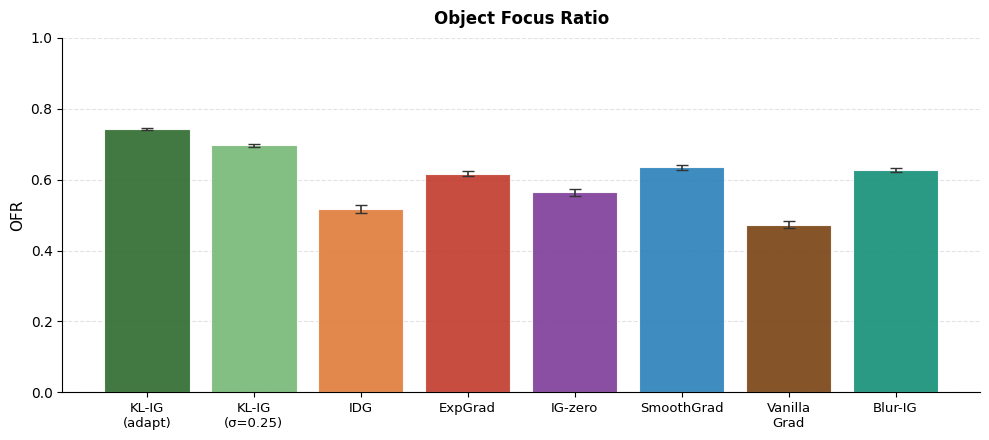

,Mean OFR,± 95% CI
Method,,
KL-IG (adaptive),0.7431,0.0035
KL-IG (σ=0.25),0.6970,0.0046
IDG,0.5175,0.0107
ExpGrad,0.6168,0.0064
IG-zero,0.5640,0.0093
SmoothGrad,0.6348,0.0068
Vanilla Grad,0.4734,0.0103
Blur-IG,0.6272,0.0061


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import numpy as np

# ── OFR: plot from CSV ──
df_sum = pd.read_csv(CACHE_DIR / "ofr_summary.csv").set_index("method").reindex(methods_all)
n      = int(df_sum["n_images"].iloc[0])
means  = df_sum["mean_ofr"].to_numpy()
cis    = df_sum["ci95"].to_numpy()

# ── Consistent color scheme ──
COLORS_ALL = {
    "KL-IG (adaptive)": "#2d6a2d",   # dark green
    "KL-IG (σ=0.25)":   "#76b876",   # light green
    "IDG":               "#e07b39",   # orange
    "ExpGrad":           "#c0392b",   # red
    "IG-zero":           "#7d3c98",   # purple
    "SmoothGrad":        "#2980b9",   # blue
    "Vanilla Grad":      "#784212",   # brown
    "Blur-IG":           "#148f77",   # teal
}

# ── Shorter x-axis labels ──
SHORT_LABELS = {
    "KL-IG (adaptive)": "KL-IG\n(adapt)",
    "KL-IG (σ=0.25)":   "KL-IG\n(σ=0.25)",
    "IDG":               "IDG",
    "ExpGrad":           "ExpGrad",
    "IG-zero":           "IG-zero",
    "SmoothGrad":        "SmoothGrad",
    "Vanilla Grad":      "Vanilla\nGrad",
    "Blur-IG":           "Blur-IG",
}

fig, ax = plt.subplots(figsize=(10, 4.5), facecolor="white")

# ── Bars ──
for xi, m in enumerate(methods_all):
    ax.bar(
        xi, means[xi],
        color=COLORS_ALL[m],
        edgecolor="white",
        linewidth=0.8,
        alpha=0.9,
        yerr=cis[xi],
        capsize=4,
        error_kw={"elinewidth": 1.2, "ecolor": "#333333"}
    )

# ── Subtle grid behind bars ──
ax.yaxis.grid(True, linestyle="--", alpha=0.35, zorder=0)
ax.set_axisbelow(True)

# ── Axis formatting ──
ax.set_xticks(range(len(methods_all)))
ax.set_xticklabels(
    [SHORT_LABELS[m] for m in methods_all],
    fontsize=9.5
)
ax.set_ylabel("OFR", fontsize=11)
ax.set_ylim(0, 1.0)
ax.set_yticks([0, 0.2, 0.4, 0.6, 0.8, 1.0])

# ── KL-IG bracket to highlight your methods ──
ax.annotate(
    "",
    xy=(1.05, means[1] + 0.05),
    xytext=(1.05, means[0] + 0.05),
    xycoords=("data", "data"),
)



# ── Spine cleanup ──
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

# ── Title ──
ax.set_title(
    f"Object Focus Ratio",
    fontweight="bold",
    fontsize=12,
    pad=10
)

plt.tight_layout()
plt.savefig("ofr_plot.pdf", bbox_inches="tight", dpi=300)
plt.show()

# ── Table ──
rows_t = [{"Method": m,
           "Mean OFR": round(float(df_sum.loc[m, "mean_ofr"]), 4),
           "± 95% CI": round(float(df_sum.loc[m, "ci95"]), 4)}
          for m in methods_all]
df_t = pd.DataFrame(rows_t).set_index("Method")
display(
    df_t.style
    .format("{:.4f}")
    .background_gradient(cmap="YlGn")
    .set_caption(f"Object Focus Ratio  —  n={n}")
)

In [ ]:
# ── Metric 6: Discriminative Concentration (sum-collapse) ──
import pandas as pd

_cache = CACHE_DIR / "dc_deit.pkl"
_csv   = CACHE_DIR / "dc_deit.csv"

if not FORCE_RECOMPUTE and _cache.exists():
    with open(_cache, "rb") as f:
        all_dc = pickle.load(f)
    print(f"[cache] Loaded from {_cache}")

elif not FORCE_RECOMPUTE and _csv.exists():
    df_dc = pd.read_csv(_csv)
    all_dc = {m: df_dc[df_dc.method == m].sort_values("img_i")["dc"].to_list()
              for m in methods_all}
    print(f"[csv] Reconstructed from {_csv}")

else:
    all_dc = {m: [] for m in methods_all}
    for img_i, idx in enumerate(tqdm(eval_idx, desc="disc-conc")):
        r = results[idx]; x, tgt = r["x"], r["target"]
        sf0 = get_sigma_final("adaptive", model, x, tgt)
        ref_raw = raw_klig(model, x, tgt, sf0)
        obj_mask = estimate_object_mask(x, sum_collapse(ref_raw))

        for sigma_name in ["adaptive", "σ=0.25"]:
            sf  = get_sigma_final(sigma_name, model, x, tgt)
            raw = raw_klig(model, x, tgt, sf)
            all_dc[f"KL-IG ({sigma_name})"].append(
                discriminative_concentration(sum_collapse(raw), obj_mask))
        for m, fn in RAW_FN.items():
            raw = fn(model, x, tgt)
            all_dc[m].append(discriminative_concentration(sum_collapse(raw), obj_mask))

    with open(_cache, "wb") as f:
        pickle.dump(all_dc, f)

    rows = [{"method": m, "img_i": i, "dc": float(v)}
            for m in methods_all for i, v in enumerate(all_dc[m])]
    pd.DataFrame(rows).to_csv(_csv, index=False)

    pd.DataFrame([{
        "method":   m,
        "mean_dc":  round(np.mean(all_dc[m]), 4),
        "ci95":     round(ci95(all_dc[m]), 4),
        "n_images": len(all_dc[m]),
    } for m in methods_all]).to_csv(CACHE_DIR / "dc_summary_deit.csv", index=False)

    print(f"[cache] Saved pkl + csv to {CACHE_DIR}")


[cache] Loaded from /content/drive/MyDrive/klig_eval_cache/dc_deit.pkl


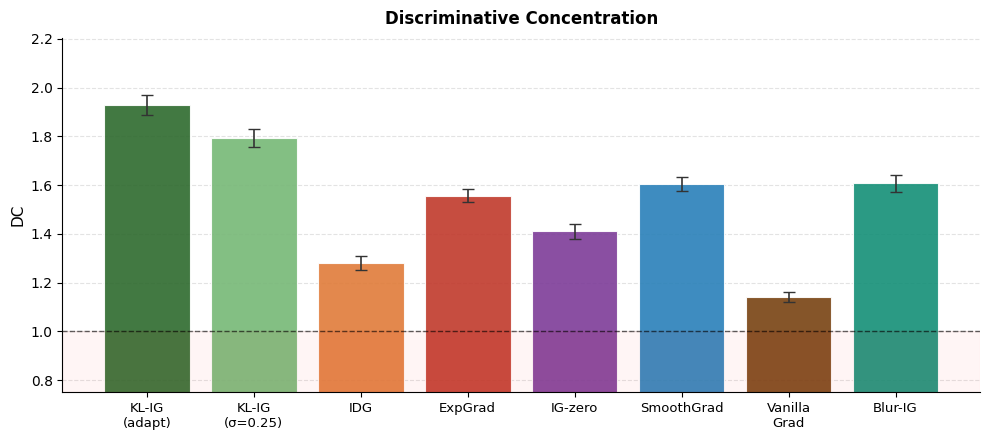

,Mean DC,± 95% CI
Method,,
KL-IG (adaptive),1.9268,0.0411
KL-IG (σ=0.25),1.7923,0.0362
IDG,1.2804,0.0301
ExpGrad,1.5567,0.0269
IG-zero,1.4099,0.0294
SmoothGrad,1.6030,0.0291
Vanilla Grad,1.1414,0.0219
Blur-IG,1.6074,0.0339


In [ ]:
# ── DC: plot from CSV ──
import pandas as pd
import matplotlib.patches as mpatches

df_sum = pd.read_csv(CACHE_DIR / "dc_summary.csv").set_index("method").reindex(methods_all)
n      = int(df_sum["n_images"].iloc[0])
means  = df_sum["mean_dc"].to_numpy()
cis    = df_sum["ci95"].to_numpy()

fig, ax = plt.subplots(figsize=(10, 4.5), facecolor="white")

# ── Bars ──
for xi, m in enumerate(methods_all):
    ax.bar(
        xi, means[xi],
        color=COLORS_ALL[m],
        edgecolor="white",
        linewidth=0.8,
        alpha=0.9,
        yerr=cis[xi],
        capsize=4,
        error_kw={"elinewidth": 1.2, "ecolor": "#333333"}
    )

# ── DC=1 reference line ──
ax.axhline(
    1.0,
    color="black",
    linestyle="--",
    linewidth=1.0,
    alpha=0.6,
    label="Uniform attribution (DC = 1)",
    zorder=3
)

# ── Subtle grid behind bars ──
ax.yaxis.grid(True, linestyle="--", alpha=0.35, zorder=0)
ax.set_axisbelow(True)

# ── Axis formatting ──
ax.set_xticks(range(len(methods_all)))
ax.set_xticklabels(
    [SHORT_LABELS[m] for m in methods_all],
    fontsize=9.5
)
ax.set_ylabel("DC", fontsize=11)

# ── Y-axis: start just below 1.0 to make reference line visible ──
y_max = max(means + cis) * 1.12
ax.set_ylim(0.75, y_max)
ax.axhspan(0.75, 1.0, alpha=0.04, color="red")   # subtle red below DC=1



# ── Spine cleanup ──
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

# ── Title ──
ax.set_title(
    f"Discriminative Concentration",
    fontweight="bold",
    fontsize=12,
    pad=10
)

plt.tight_layout()
plt.savefig("dc_plot.pdf", bbox_inches="tight", dpi=300)
plt.show()

# ── Table ──
rows_t = [{"Method": m,
           "Mean DC": round(float(df_sum.loc[m, "mean_dc"]), 4),
           "± 95% CI": round(float(df_sum.loc[m, "ci95"]), 4)}
          for m in methods_all]
df_t = pd.DataFrame(rows_t).set_index("Method")
display(
    df_t.style
    .format("{:.4f}")
    .background_gradient(cmap="YlGn")
    .set_caption(f"Discriminative Concentration  —  n={n}")
)

#4.Occlusion Corr

[cache] Loaded from /content/drive/MyDrive/klig_eval_cache/occlusion.pkl


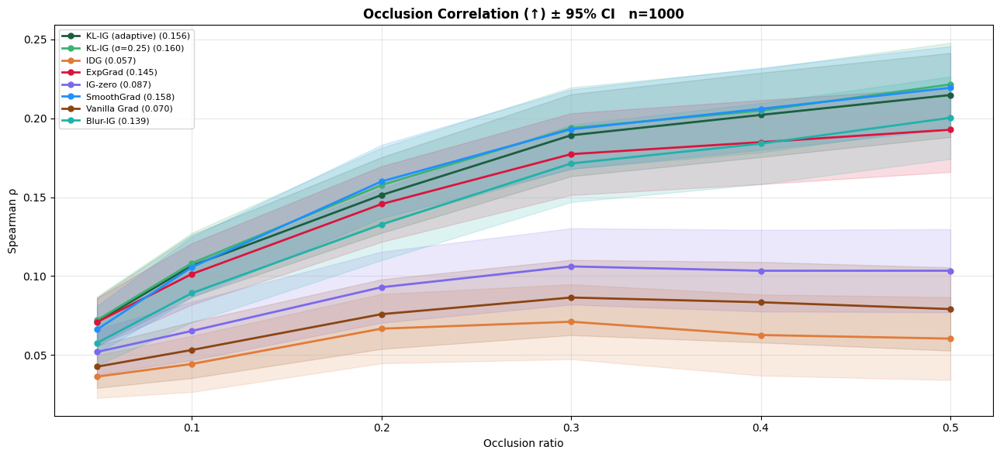

In [ ]:
# ── Metric 3: Occlusion Correlation vs Ratio ──
import math, pandas as pd

_cache = CACHE_DIR / "occlusion.pkl"
_csv   = CACHE_DIR / "occlusion.csv"

if not FORCE_RECOMPUTE and _cache.exists():
    with open(_cache, "rb") as f:
        occ_by_ratio = pickle.load(f)
    print(f"[cache] Loaded from {_cache}")

elif not FORCE_RECOMPUTE and _csv.exists():
    df_occ = pd.read_csv(_csv)
    occ_by_ratio = {m: [] for m in methods_all}
    for m in methods_all:
        sub = df_occ[df_occ.method == m]
        for ratio in OCCLUSION_RATIOS:
            r_grp = sub[sub.ratio == ratio].sort_values("img_i")
            occ_by_ratio[m].append(r_grp["rho"].to_list())
    print(f"[csv] Reconstructed from {_csv}")

else:
    attr_cache = {}
    for idx in tqdm(eval_idx, desc="attrs (once)"):
        r = results[idx]; x, tgt = r["x"], r["target"]
        cache = {}
        for sigma_name in ["adaptive", "\u03c3=0.25"]:
            sf = get_sigma_final(sigma_name, model, x, tgt)
            _, amap = compute_klig(model, x, tgt, sf)
            cache[f"KL-IG ({sigma_name})"] = amap
        for m in ["IDG", "ExpGrad", "IG-zero", "SmoothGrad", "Vanilla Grad", "Blur-IG"]:
            cache[m] = COMPUTE_FN[m](model, x, tgt)
        attr_cache[idx] = cache

    occ_by_ratio = {m: [[] for _ in OCCLUSION_RATIOS] for m in methods_all}
    for ri, ratio in enumerate(tqdm(OCCLUSION_RATIOS, desc="occlusion sweep")):
        ps = ratio_to_patch(ratio)
        for idx in eval_idx:
            r = results[idx]; x, tgt = r["x"], r["target"]
            _, _, H, W = x.shape
            om = occlusion_map(model, x, tgt, ps=ps).ravel()
            for m in methods_all:
                ag = attr_to_grid(attr_cache[idx][m], ps, OCCLUSION_STRIDE, H, W).ravel()
                rho, _ = stats.spearmanr(om, ag)
                occ_by_ratio[m][ri].append(0.0 if np.isnan(rho) else rho)

    with open(_cache, "wb") as f:
        pickle.dump(occ_by_ratio, f)

    rows = []
    for m in methods_all:
        for ri, ratio in enumerate(OCCLUSION_RATIOS):
            for img_i, rho in enumerate(occ_by_ratio[m][ri]):
                rows.append({"method": m, "img_i": img_i, "ratio": ratio, "rho": float(rho)})
    pd.DataFrame(rows).to_csv(_csv, index=False)

    pd.DataFrame([{
        "method":   m,
        "mean_rho": round(np.mean([np.mean(occ_by_ratio[m][ri]) for ri in range(len(OCCLUSION_RATIOS))]), 4),
        "ci95":     round(ci95(np.array(occ_by_ratio[m]).mean(axis=0)), 4),
        "n_images": len(occ_by_ratio[m][0]),
    } for m in methods_all]).to_csv(CACHE_DIR / "occlusion_summary.csv", index=False)

    print(f"[cache] Saved pkl + csv to {CACHE_DIR}")

# ── Plot per-ratio with 95% CI bands ──
n = len(occ_by_ratio[methods_all[0]][0])
fig, ax = plt.subplots(figsize=(13, 6), facecolor="white")
for m in methods_all:
    arr = np.array(occ_by_ratio[m])  # (n_ratios, n_imgs)
    mu  = arr.mean(axis=1)
    ci  = 1.96 * arr.std(axis=1) / np.sqrt(n)
    ax.plot(OCCLUSION_RATIOS, mu, "o-", color=COLORS_ALL[m], lw=2, ms=5,
            label=f"{m} ({mu.mean():.3f})")
    ax.fill_between(OCCLUSION_RATIOS, mu - ci, mu + ci, color=COLORS_ALL[m], alpha=0.15)
ax.set_xlabel("Occlusion ratio"); ax.set_ylabel("Spearman \u03c1")
ax.set_title(f"Occlusion Correlation (\u2191) \u00b1 95% CI   n={n}", fontweight="bold")
ax.legend(fontsize=8); ax.grid(alpha=0.3)
plt.tight_layout(); plt.show()


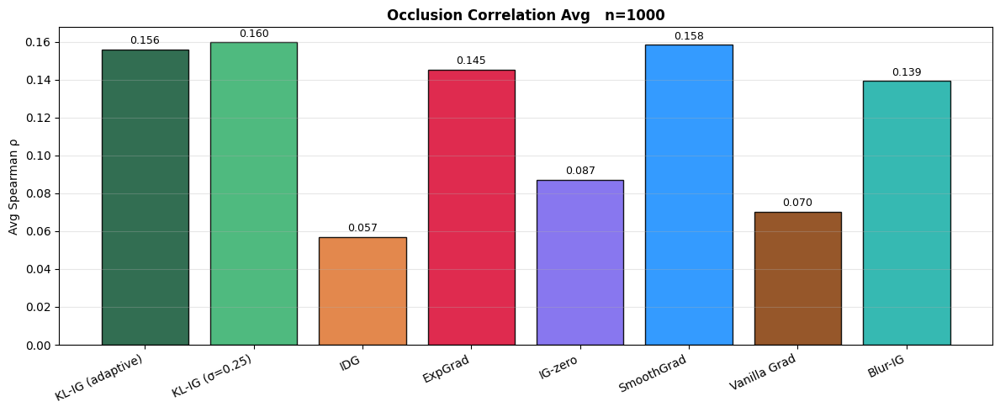

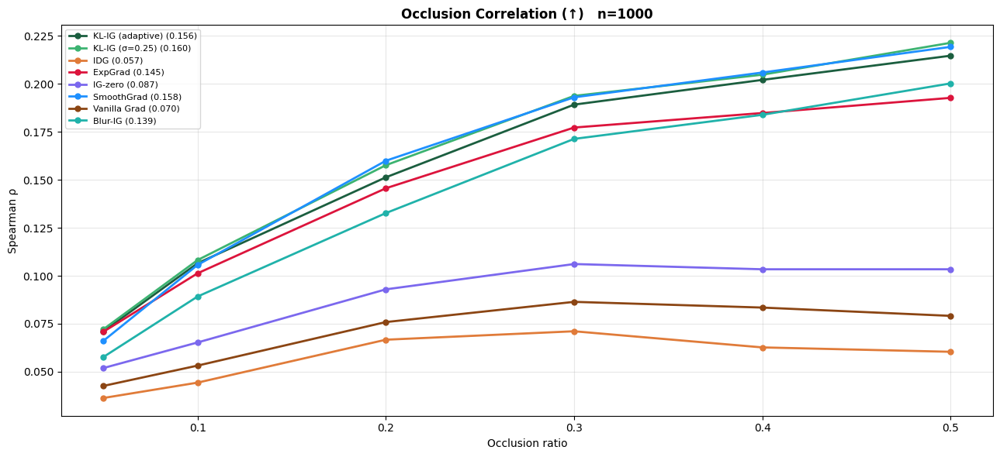

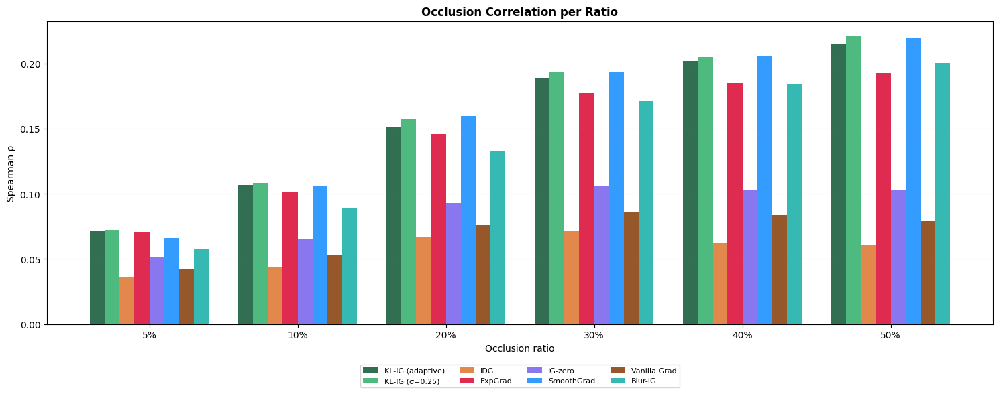

,Avg ρ,± 95% CI
Method,,
KL-IG (adaptive),0.1558,0.0185
KL-IG (σ=0.25),0.1597,0.0183
IDG,0.0569,0.0170
ExpGrad,0.1454,0.0184
IG-zero,0.0872,0.0174
SmoothGrad,0.1583,0.0181
Vanilla Grad,0.0701,0.0170
Blur-IG,0.1392,0.0174


In [ ]:
# ── Occlusion Correlation: all plots + table (loads from CSV) ──
import pandas as pd

df_sum = pd.read_csv(CACHE_DIR / "occlusion_summary.csv").set_index("method").reindex(methods_all)
df_occ = pd.read_csv(CACHE_DIR / "occlusion.csv")
n      = int(df_sum["n_images"].iloc[0])

# Reconstruct per-ratio arrays
occ_by_ratio_p = {m: [] for m in methods_all}
for m in methods_all:
    sub = df_occ[df_occ.method == m]
    for ratio in OCCLUSION_RATIOS:
        occ_by_ratio_p[m].append(sub[sub.ratio == ratio].sort_values("img_i")["rho"].to_numpy())

# ── (1) Avg bar chart ──
means = df_sum["mean_rho"].to_numpy()
cis   = df_sum["ci95"].to_numpy()
fig, ax = plt.subplots(figsize=(12, 5), facecolor="white")
for xi, m in enumerate(methods_all):
    ax.bar(xi, means[xi],
           color=COLORS_ALL[m], edgecolor="black", alpha=0.9)
    ax.text(xi, means[xi] + 0.003,
            f"{means[xi]:.3f}", ha="center", fontsize=9)
ax.set_xticks(range(len(methods_all))); ax.set_xticklabels(methods_all, rotation=25, ha="right")
ax.set_ylabel("Avg Spearman \u03c1")
ax.set_title(f"Occlusion Correlation Avg   n={n}", fontweight="bold")
ax.grid(axis="y", alpha=0.3); plt.tight_layout(); plt.show()

# ── (2) Per-ratio line with 95% CI band ──
fig, ax = plt.subplots(figsize=(13, 6), facecolor="white")
for m in methods_all:
    arr = np.array(occ_by_ratio_p[m])
    mu  = arr.mean(axis=1); ci = 1.96 * arr.std(axis=1) / np.sqrt(n)
    ax.plot(OCCLUSION_RATIOS, mu, "o-", color=COLORS_ALL[m], lw=2, ms=5,
            label=f"{m} ({mu.mean():.3f})")
ax.set_xlabel("Occlusion ratio"); ax.set_ylabel("Spearman \u03c1")
ax.set_title(f"Occlusion Correlation (\u2191)   n={n}", fontweight="bold")
ax.legend(fontsize=8); ax.grid(alpha=0.3); plt.tight_layout(); plt.show()

# ── (3) Per-ratio grouped bar chart ──
n_methods = len(methods_all); n_ratios = len(OCCLUSION_RATIOS)
bar_w = 0.8 / n_methods; x_centers = np.arange(n_ratios)
fig, ax = plt.subplots(figsize=(15, 6), facecolor="white")
for k, m in enumerate(methods_all):
    arr = np.array(occ_by_ratio_p[m])
    mu  = arr.mean(axis=1); ci = 1.96 * arr.std(axis=1) / np.sqrt(n)
    offsets = x_centers + (k - n_methods / 2) * bar_w + bar_w / 2
    for xi, (off, mu_i, ci_i) in enumerate(zip(offsets, mu, ci)):
        ax.bar(off, mu_i, bar_w,
               color=COLORS_ALL[m], alpha=0.9,
               label=m if xi == 0 else None)
ax.set_xticks(x_centers); ax.set_xticklabels([f"{int(r*100)}%" for r in OCCLUSION_RATIOS])
ax.set_xlabel("Occlusion ratio"); ax.set_ylabel("Spearman \u03c1")
ax.set_title(f"Occlusion Correlation per Ratio", fontweight="bold")
ax.legend(fontsize=8, ncol=4, loc="upper center", bbox_to_anchor=(0.5, -0.12))
ax.grid(axis="y", alpha=0.3); plt.tight_layout(); plt.show()

# ── Summary table ──
rows_t = [{"Method": m,
           "Avg \u03c1":    round(float(df_sum.loc[m, "mean_rho"]), 4),
           "\u00b1 95% CI": round(float(df_sum.loc[m, "ci95"]), 4),
          } for m in methods_all]
df_t = pd.DataFrame(rows_t).set_index("Method")
display(df_t.style
    .format("{:.4f}")
    .background_gradient(cmap="YlGn")
    .set_caption(f"Occlusion Correlation (\u2191)   n={n}"))


#5. Sparsity

In [ ]:
# ── Metric 7: Gini Coefficient (absmax-collapse — sparsity metric) ──
import pandas as pd

_cache = CACHE_DIR / "gini.pkl"
_csv   = CACHE_DIR / "gini.csv"

if not FORCE_RECOMPUTE and _cache.exists():
    with open(_cache, "rb") as f:
        all_gini = pickle.load(f)
    print(f"[cache] Loaded from {_cache}")

elif not FORCE_RECOMPUTE and _csv.exists():
    df_g = pd.read_csv(_csv)
    all_gini = {m: df_g[df_g.method == m].sort_values("img_i")["gini"].to_list()
                for m in methods_all}
    print(f"[csv] Reconstructed from {_csv}")

else:
    all_gini = {m: [] for m in methods_all}
    for img_i, idx in enumerate(tqdm(eval_idx, desc="gini")):
        r = results[idx]; x, tgt = r["x"], r["target"]
        for sigma_name in ["adaptive", "σ=0.25"]:
            sf  = get_sigma_final(sigma_name, model, x, tgt)
            raw = raw_klig(model, x, tgt, sf)
            all_gini[f"KL-IG ({sigma_name})"].append(gini_coefficient(absmax_collapse(raw)))
        for m, fn in RAW_FN.items():
            raw = fn(model, x, tgt)
            all_gini[m].append(gini_coefficient(absmax_collapse(raw)))

    with open(_cache, "wb") as f:
        pickle.dump(all_gini, f)

    rows = [{"method": m, "img_i": i, "gini": float(v)}
            for m in methods_all for i, v in enumerate(all_gini[m])]
    pd.DataFrame(rows).to_csv(_csv, index=False)

    pd.DataFrame([{
        "method":    m,
        "mean_gini": round(np.mean(all_gini[m]), 4),
        "ci95":      round(ci95(all_gini[m]), 4),
        "n_images":  len(all_gini[m]),
    } for m in methods_all]).to_csv(CACHE_DIR / "gini_summary.csv", index=False)

    print(f"[cache] Saved pkl + csv to {CACHE_DIR}")


[cache] Loaded from /content/drive/MyDrive/klig_eval_cache/gini.pkl


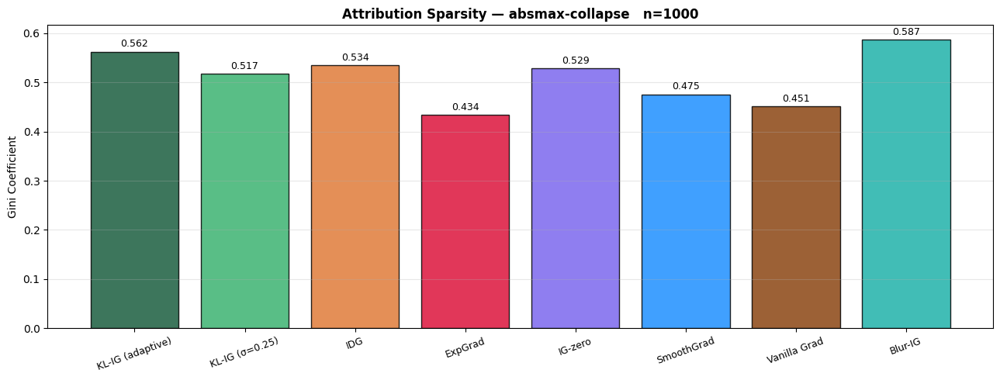

,Gini,± 95% CI
Method,,
KL-IG (adaptive),0.5619,0.0047
KL-IG (σ=0.25),0.5173,0.0042
IDG,0.5344,0.0033
ExpGrad,0.4341,0.0037
IG-zero,0.5286,0.0034
SmoothGrad,0.4754,0.0044
Vanilla Grad,0.4510,0.0031
Blur-IG,0.5869,0.0038


In [ ]:
# ── Gini: plot from CSV ──
import pandas as pd

df_sum = pd.read_csv(CACHE_DIR / "gini_summary.csv").set_index("method").reindex(methods_all)
n = int(df_sum["n_images"].iloc[0])
means = df_sum["mean_gini"].to_numpy()

fig, ax = plt.subplots(figsize=(13, 5), facecolor="white")
for xi, m in enumerate(methods_all):
    ax.bar(xi, means[xi], color=COLORS_ALL[m], edgecolor="black", alpha=0.85)
    ax.text(xi, means[xi] + 0.01, f"{means[xi]:.3f}", ha="center", fontsize=9)
ax.set_xticks(range(len(methods_all))); ax.set_xticklabels(methods_all, rotation=20, fontsize=9)
ax.set_ylabel("Gini Coefficient")
ax.set_title(f"Attribution Sparsity — absmax-collapse   n={n}", fontweight="bold")
ax.grid(axis="y", alpha=0.3); plt.tight_layout(); plt.show()

rows_t = [{"Method": m,
           "Gini": round(float(df_sum.loc[m, "mean_gini"]), 4),
           "\u00b1 95% CI": round(float(df_sum.loc[m, "ci95"]), 4)} for m in methods_all]
df_t = pd.DataFrame(rows_t).set_index("Method")
display(df_t.style.format("{:.4f}").background_gradient(cmap="Purples")
        .set_caption(f"Attribution Sparsity"))

#6. Infidelity

In [ ]:
# ── Metric 8: Infidelity (sum-collapse) ──
import pandas as pd

_cache = CACHE_DIR / "infid.pkl"
_csv   = CACHE_DIR / "infid.csv"

if not FORCE_RECOMPUTE and _cache.exists():
    with open(_cache, "rb") as f:
        all_infid = pickle.load(f)
    print(f"[cache] Loaded from {_cache}")

elif not FORCE_RECOMPUTE and _csv.exists():
    df_inf = pd.read_csv(_csv)
    all_infid = {m: df_inf[df_inf.method == m].sort_values("img_i")["infid"].to_list()
                 for m in methods_all}
    print(f"[csv] Reconstructed from {_csv}")

else:
    all_infid = {m: [] for m in methods_all}
    for img_i, idx in enumerate(tqdm(eval_idx, desc="infidelity")):
        r = results[idx]; x, tgt = r["x"], r["target"]
        for sigma_name in ["adaptive", "σ=0.25"]:
            sf  = get_sigma_final(sigma_name, model, x, tgt)
            raw = raw_klig(model, x, tgt, sf)
            all_infid[f"KL-IG ({sigma_name})"].append(
                infidelity(model, x, sum_collapse(raw), tgt))
        for m, fn in RAW_FN.items():
            raw = fn(model, x, tgt)
            all_infid[m].append(infidelity(model, x, sum_collapse(raw), tgt))

    with open(_cache, "wb") as f:
        pickle.dump(all_infid, f)

    rows = [{"method": m, "img_i": i, "infid": float(v)}
            for m in methods_all for i, v in enumerate(all_infid[m])]
    pd.DataFrame(rows).to_csv(_csv, index=False)

    pd.DataFrame([{
        "method":     m,
        "mean_infid": round(np.mean(all_infid[m]), 5),
        "ci95":       round(ci95(all_infid[m]), 5),
        "n_images":   len(all_infid[m]),
    } for m in methods_all]).to_csv(CACHE_DIR / "infid_summary.csv", index=False)

    print(f"[cache] Saved pkl + csv to {CACHE_DIR}")


[cache] Loaded from /content/drive/MyDrive/klig_eval_cache/infid.pkl


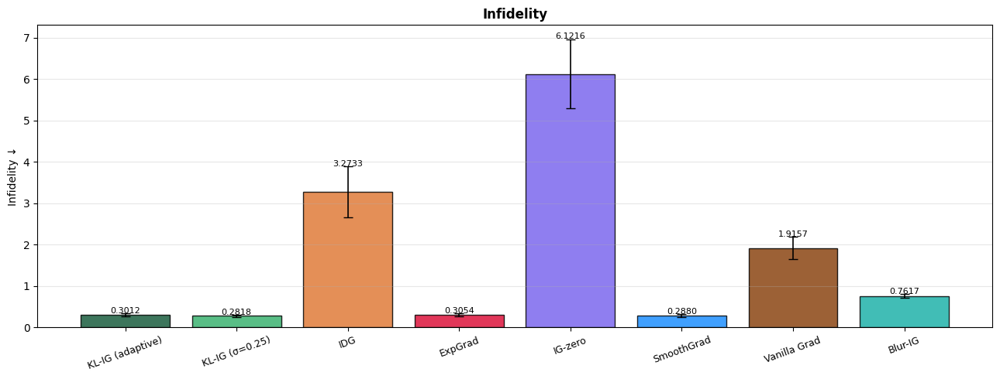

,Infidelity,± 95% CI
Method,,
KL-IG (adaptive),0.30124,0.04178
KL-IG (σ=0.25),0.28182,0.03262
IDG,3.27333,0.61345
ExpGrad,0.30539,0.03392
IG-zero,6.12163,0.83326
SmoothGrad,0.28804,0.03261
Vanilla Grad,1.91571,0.26867
Blur-IG,0.76167,0.05192


In [ ]:
# ── Infidelity: plot from CSV ──
import pandas as pd

df_sum = pd.read_csv(CACHE_DIR / "infid_summary.csv").set_index("method").reindex(methods_all)
n      = int(df_sum["n_images"].iloc[0])
means  = df_sum["mean_infid"].to_numpy()
cis    = df_sum["ci95"].to_numpy()

fig, ax = plt.subplots(figsize=(13, 5), facecolor="white")
for xi, m in enumerate(methods_all):
    ax.bar(xi, means[xi], color=COLORS_ALL[m], edgecolor="black", alpha=0.85,
           yerr=cis[xi], capsize=4, error_kw={"elinewidth": 1.2, "ecolor": "black"})
    ax.text(xi, means[xi] + cis[xi] * 1.02, f"{means[xi]:.4f}", ha="center", fontsize=8)
ax.set_xticks(range(len(methods_all))); ax.set_xticklabels(methods_all, rotation=20, fontsize=9)
ax.set_ylabel("Infidelity ↓")
ax.set_title(f"Infidelity", fontweight="bold")
ax.grid(axis="y", alpha=0.3); plt.tight_layout(); plt.show()

rows_t = [{"Method": m,
           "Infidelity": round(float(df_sum.loc[m, "mean_infid"]), 5),
           "± 95% CI":   round(float(df_sum.loc[m, "ci95"]), 5)} for m in methods_all]
df_t = pd.DataFrame(rows_t).set_index("Method")
display(df_t.style.format("{:.5f}").background_gradient(cmap="Reds")
        .set_caption("Infidelity"))

#7. Sanity Check

In [21]:
# ── Cascading Sanity Check (Adebayo et al. 2018, Sec. 4.1) ──
import os, random, copy, pickle
import pandas as pd
from scipy.stats import spearmanr

# Clear old cache
for f in ["sanity.pkl", "sanity.csv", "sanity_summary.csv"]:
    p = CACHE_DIR / f
    if p.exists():
        os.remove(p); print(f"deleted {f}")

def sanity_similarity(a, b):
    a = a.detach().cpu().numpy() if hasattr(a, "numpy") else a
    b = b.detach().cpu().numpy() if hasattr(b, "numpy") else b
    return float(spearmanr(np.abs(a).ravel(), np.abs(b).ravel())[0])

def ci95(x):
    x = np.array(x)
    return 1.96 * x.std(ddof=1) / np.sqrt(len(x)) if len(x) > 1 else 0.0

def reset_layer(m, layer_name):
    for module in getattr(m, layer_name).modules():
        if isinstance(module, (nn.Linear, nn.Conv2d)):
            nn.init.kaiming_normal_(module.weight)
            if module.bias is not None: nn.init.zeros_(module.bias)
        elif isinstance(module, nn.BatchNorm2d):
            nn.init.ones_(module.weight); nn.init.zeros_(module.bias)

# ── Build CASCADING models (top-down: each model has all previous layers + new one randomized) ──
CASCADE_LAYERS = ["fc", "layer4", "layer3", "layer2", "layer1"]
torch.manual_seed(0)
cascade_models = {}
m_cumulative = copy.deepcopy(model).to(DEVICE)
for layer_name in CASCADE_LAYERS:
    reset_layer(m_cumulative, layer_name)        # cumulative randomization
    m_snapshot = copy.deepcopy(m_cumulative)
    m_snapshot.eval()
    cascade_models[layer_name] = m_snapshot
print(f"Built {len(cascade_models)} cascading models (top-down cumulative randomization).")
print(f"  fc      → fc randomized")
print(f"  layer4  → fc + layer4 randomized")
print(f"  layer3  → fc + layer4 + layer3 randomized")
print(f"  layer2  → fc + layer4 + layer3 + layer2 randomized")
print(f"  layer1  → all layers randomized (fully random model)")

# ── Image sampling ──
IMAGE_TYPE_KEYWORDS = {
    "animal":    ["dog","cat","bird","fish","snake","lizard","frog","elephant",
                  "tiger","lion","bear","fox","wolf","deer","horse","cow","sheep",
                  "monkey","ape","panda","leopard","zebra","penguin","owl","eagle",
                  "whale","shark","spider","beetle","rabbit","squirrel","goat",
                  "pig","camel","kangaroo","ostrich"],
    "vehicle":   ["car","truck","bus","train","boat","ship","airplane","bicycle",
                  "motorcycle","cab","wagon","trailer","scooter","ambulance"],
    "object":    ["chair","table","lamp","bottle","cup","book","keyboard","phone",
                  "computer","clock","watch","monitor","camera","scissors",
                  "umbrella","mask","helmet","backpack","tie"],
    "food":      ["bread","pizza","cake","apple","banana","orange","broccoli",
                  "sandwich","hotdog","donut","cheese","mushroom","strawberry",
                  "lemon","ice cream"],
    "nature":    ["tree","flower","mountain","beach","lake","forest","valley",
                  "cliff","seashore","volcano","coral","alp","hill","river"],
    "structure": ["building","castle","church","tower","bridge","dome","barn",
                  "lighthouse","palace","fountain","stadium"],
}

def classify_label(label_str):
    s = label_str.lower()
    for cat, kws in IMAGE_TYPE_KEYWORDS.items():
        if any(kw in s for kw in kws): return cat
    return "other"

buckets = {cat: [] for cat in IMAGE_TYPE_KEYWORDS}; buckets["other"] = []
for idx in eval_idx:
    buckets[classify_label(results[idx]["label_str"])].append(idx)

random.seed(42)
sanity_idx = []
for cat in IMAGE_TYPE_KEYWORDS.keys():
    ids = buckets[cat][:]; random.shuffle(ids)
    sanity_idx.extend(ids[:10])
other_ids = buckets["other"][:]; random.shuffle(other_ids)
sanity_idx.extend(other_ids[:40])
print(f"Running sanity on {len(sanity_idx)} images (10×6 + 40 other = 100)")

# ── Sanity cascade loop with incremental save ──
# ── Sanity cascade loop with incremental save ──
_sanity_cache    = CACHE_DIR / "sanity.pkl"
_sanity_progress = CACHE_DIR / "sanity_progress.pkl"

if _sanity_cache.exists() and _sanity_progress.exists():
    sanity_cascade = pickle.load(open(_sanity_cache, "rb"))
    done_imgs      = pickle.load(open(_sanity_progress, "rb"))
    print(f"[resume] {done_imgs}/{len(sanity_idx)} images done")
else:
    sanity_cascade = {m: {l: [] for l in CASCADE_LAYERS} for m in methods_all}
    done_imgs = 0

# Make sure Guided IG is in RAW_FN. If it's defined separately, add it:
# RAW_FN["Guided IG"] = raw_guided_ig   # ← uncomment if needed

for img_i, idx in enumerate(tqdm(sanity_idx[done_imgs:], desc="sanity"), start=done_imgs):
    r = results[idx]; x, tgt = r["x"].to(DEVICE), r["target"]

    # ── Trained model maps ──
    trained_maps = {}
    for sigma_name in ["adaptive", "σ=0.25"]:
        sf = get_sigma_final(sigma_name, model, x, tgt)
        trained_maps[f"KL-IG ({sigma_name})"] = sum_collapse(raw_klig(model, x, tgt, sf))
    for m, fn in RAW_FN.items():
        trained_maps[m] = sum_collapse(fn(model, x, tgt))

    # ── Cascading randomized model maps ──
    for layer_name, rand_model in cascade_models.items():
        # KL-IG: recompute σ_final against the RANDOMIZED model
        for sigma_name in ["adaptive", "σ=0.25"]:
            m = f"KL-IG ({sigma_name})"
            sf_rand = get_sigma_final(sigma_name, rand_model, x, tgt)   # ← FIXED
            rand_map = sum_collapse(raw_klig(rand_model, x, tgt, sf_rand))
            sanity_cascade[m][layer_name].append(
                sanity_similarity(trained_maps[m], rand_map))

        # Other methods (incl. Guided IG if in RAW_FN)
        for m, fn in RAW_FN.items():
            rand_map = sum_collapse(fn(rand_model, x, tgt))
            sanity_cascade[m][layer_name].append(
                sanity_similarity(trained_maps[m], rand_map))

    done_imgs += 1
    if done_imgs % 5 == 0 or done_imgs == len(sanity_idx):
        pickle.dump(sanity_cascade, open(_sanity_cache, "wb"))
        pickle.dump(done_imgs,      open(_sanity_progress, "wb"))

deleted sanity.pkl
Built 5 cascading models (top-down cumulative randomization).
  fc      → fc randomized
  layer4  → fc + layer4 randomized
  layer3  → fc + layer4 + layer3 randomized
  layer2  → fc + layer4 + layer3 + layer2 randomized
  layer1  → all layers randomized (fully random model)
Running sanity on 100 images (10×6 + 40 other = 100)


sanity:   0%|          | 0/100 [00:00<?, ?it/s]

In [32]:
# ── Cascading Sanity Check — Final Table (with Guided IG) ──
import pickle
import pandas as pd
import numpy as np

# Load merged sanity cache
sanity_cascade = pickle.load(open(CACHE_DIR / "sanity.pkl", "rb"))
print(f"Methods in sanity cache: {list(sanity_cascade.keys())}")

ci95 = lambda v: 1.96 * np.std(v, ddof=1) / np.sqrt(len(v)) if len(v) > 1 else 0.0

# Build methods list — make sure Guided IG is included
methods_with_gig = list(sanity_cascade.keys())

# ── Save final CSVs ──
rows = [{"method": m, "layer": l, "img_i": i, "rho": float(v)}
        for m in methods_with_gig for l in CASCADE_LAYERS
        for i, v in enumerate(sanity_cascade[m][l])]
pd.DataFrame(rows).to_csv(CACHE_DIR / "sanity.csv", index=False)

summary_df = pd.DataFrame([
    {"method": m, "layer": l,
     "mean_rho": round(np.mean(sanity_cascade[m][l]), 4),
     "ci95":     round(ci95(sanity_cascade[m][l]), 4),
     "n_images": len(sanity_cascade[m][l])}
    for m in methods_with_gig for l in CASCADE_LAYERS
])
summary_df.to_csv(CACHE_DIR / "sanity_summary.csv", index=False)
print(f"[saved] csv to {CACHE_DIR}")

# ── Pivot table: methods × layers ──
df_s = pd.read_csv(CACHE_DIR / "sanity_summary.csv")
mean_pivot = df_s.pivot(index="method", columns="layer", values="mean_rho").reindex(
    index=methods_with_gig, columns=CASCADE_LAYERS)
ci_pivot = df_s.pivot(index="method", columns="layer", values="ci95").reindex(
    index=methods_with_gig, columns=CASCADE_LAYERS)

mean_pivot["mean"] = mean_pivot.mean(axis=1)
mean_pivot = mean_pivot.sort_values("mean")  # best (lowest) at top

# Display with heat-coloring
display(
    mean_pivot.style.format("{:.3f}")
        .background_gradient(cmap="RdYlGn_r", axis=None, subset=CASCADE_LAYERS)
        .background_gradient(cmap="RdYlGn_r", axis=None, subset=["mean"])
        .set_caption("Cascading Sanity Check — Spearman ρ |attr| "
                     "(↓ = more sensitive = better) n=100")
)

# ── LaTeX table ──
def fmt_cell(method, layer):
    m_val = mean_pivot.loc[method, layer]
    c_val = ci_pivot.loc[method, layer]
    return f"${m_val:.3f} \\pm {c_val:.3f}$"

methods_sorted = mean_pivot.index.tolist()
latex_rows = []
for m in methods_sorted:
    cells = [fmt_cell(m, l) for l in CASCADE_LAYERS]
    cells.append(f"${mean_pivot.loc[m, 'mean']:.3f}$")
    latex_rows.append(f"{m} & " + " & ".join(cells) + " \\\\")

latex_table = (
    "\\begin{table}[t]\n"
    "\\centering\n"
    "\\caption{Cascading Sanity Check (Adebayo et al., 2018). "
    "Spearman $\\rho$ of $|\\text{attr}|$ between trained and progressively "
    "randomized ResNet50 ($n=100$ images, 95\\% CIs). Lower values indicate "
    "greater sensitivity to model parameters.}\n"
    "\\label{tab:sanity_cascade}\n"
    "\\begin{tabular}{lcccccc}\n"
    "\\toprule\n"
    "\\textbf{Method} & \\textbf{fc} & \\textbf{layer4} & \\textbf{layer3} "
    "& \\textbf{layer2} & \\textbf{layer1} & \\textbf{Mean} $\\downarrow$ \\\\\n"
    "\\midrule\n"
    + "\n".join(latex_rows) + "\n"
    "\\bottomrule\n"
    "\\end{tabular}\n"
    "\\end{table}"
)

print("\n" + latex_table)

with open(CACHE_DIR / "sanity_table.tex", "w") as f:
    f.write(latex_table)
print(f"\n[saved] LaTeX table → {CACHE_DIR}/sanity_table.tex")

Methods in sanity cache: ['KL-IG (adaptive)', 'KL-IG (σ=0.25)', 'IDG', 'ExpGrad', 'IG-zero', 'SmoothGrad', 'Vanilla Grad', 'Blur-IG', 'Guided IG']
[saved] csv to /content/drive/MyDrive/klig_eval_cache


layer,fc,layer4,layer3,layer2,layer1,mean
method,,,,,,
SmoothGrad,0.249,0.150,0.065,0.068,0.113,0.129
ExpGrad,0.211,0.157,0.126,0.140,0.167,0.160
Vanilla Grad,0.331,0.290,0.235,0.166,-0.037,0.197
KL-IG (σ=0.25),0.333,0.262,0.180,0.177,0.192,0.229
KL-IG (adaptive),0.335,0.267,0.213,0.226,0.231,0.254
Guided IG,0.319,0.273,0.245,0.206,0.242,0.257
IDG,0.466,0.438,0.380,0.293,0.108,0.337
IG-zero,0.446,0.408,0.360,0.290,0.196,0.340
Blur-IG,0.523,0.479,0.404,0.321,0.369,0.419



\begin{table}[t]
\centering
\caption{Cascading Sanity Check (Adebayo et al., 2018). Spearman $\rho$ of $|\text{attr}|$ between trained and progressively randomized ResNet50 ($n=100$ images, 95\% CIs). Lower values indicate greater sensitivity to model parameters.}
\label{tab:sanity_cascade}
\begin{tabular}{lcccccc}
\toprule
\textbf{Method} & \textbf{fc} & \textbf{layer4} & \textbf{layer3} & \textbf{layer2} & \textbf{layer1} & \textbf{Mean} $\downarrow$ \\
\midrule
SmoothGrad & $0.249 \pm 0.016$ & $0.150 \pm 0.008$ & $0.065 \pm 0.012$ & $0.068 \pm 0.010$ & $0.113 \pm 0.013$ & $0.129$ \\
ExpGrad & $0.211 \pm 0.013$ & $0.157 \pm 0.014$ & $0.126 \pm 0.014$ & $0.140 \pm 0.013$ & $0.167 \pm 0.012$ & $0.160$ \\
Vanilla Grad & $0.331 \pm 0.016$ & $0.290 \pm 0.015$ & $0.235 \pm 0.016$ & $0.166 \pm 0.015$ & $-0.037 \pm 0.023$ & $0.197$ \\
KL-IG (σ=0.25) & $0.333 \pm 0.015$ & $0.262 \pm 0.014$ & $0.180 \pm 0.016$ & $0.177 \pm 0.015$ & $0.192 \pm 0.016$ & $0.229$ \\
KL-IG (adaptive) & $0.335 \pm 

In [30]:
# ── Cascading Sanity Check — Guided IG only ──
import os, copy, pickle
import pandas as pd
import numpy as np
from scipy.stats import spearmanr
from tqdm import tqdm

def sanity_similarity(a, b):
    a = a.detach().cpu().numpy() if hasattr(a, "numpy") else a
    b = b.detach().cpu().numpy() if hasattr(b, "numpy") else b
    return float(spearmanr(np.abs(a).ravel(), np.abs(b).ravel())[0])

def ci95(x):
    x = np.array(x)
    return 1.96 * x.std(ddof=1) / np.sqrt(len(x)) if len(x) > 1 else 0.0

# ── Cache paths (separate from main sanity cache) ──
_gig_cache    = CACHE_DIR / "sanity_gig.pkl"
_gig_progress = CACHE_DIR / "sanity_gig_progress.pkl"

# Uncomment to clear and restart:
# for p in [_gig_cache, _gig_progress]:
#     if p.exists(): os.remove(p)

# Use the Guided IG raw fn from your dispatch
gig_fn = RAW_FN_GIG["Guided IG"]

# ── Resume or init ──
if _gig_cache.exists() and _gig_progress.exists():
    sanity_gig = pickle.load(open(_gig_cache, "rb"))
    done_imgs  = pickle.load(open(_gig_progress, "rb"))
    print(f"[resume] {done_imgs}/{len(sanity_idx)} images done")
else:
    sanity_gig = {l: [] for l in CASCADE_LAYERS}
    done_imgs  = 0

# ── Loop ──
for img_i, idx in enumerate(tqdm(sanity_idx[done_imgs:], desc="GIG sanity"),
                            start=done_imgs):
    r = results[idx]; x, tgt = r["x"].to(DEVICE), r["target"]

    # Trained map
    trained_map = sum_collapse(gig_fn(model, x, tgt))

    # Cascading randomized maps
    for layer_name, rand_model in cascade_models.items():
        rand_map = sum_collapse(gig_fn(rand_model, x, tgt))
        sanity_gig[layer_name].append(sanity_similarity(trained_map, rand_map))

    done_imgs += 1
    if done_imgs % 5 == 0 or done_imgs == len(sanity_idx):
        pickle.dump(sanity_gig, open(_gig_cache, "wb"))
        pickle.dump(done_imgs,  open(_gig_progress, "wb"))

# ── Summary ──
gig_summary = pd.DataFrame([
    {"layer": l,
     "mean_rho": round(np.mean(sanity_gig[l]), 4),
     "ci95":     round(ci95(sanity_gig[l]), 4),
     "n_images": len(sanity_gig[l])}
    for l in CASCADE_LAYERS
])
gig_summary.to_csv(CACHE_DIR / "sanity_gig_summary.csv", index=False)

print("\nGuided IG — Cascading Sanity Check (n=100):")
print(gig_summary.to_string(index=False))
print(f"\nMean across layers: "
      f"{np.mean([np.mean(sanity_gig[l]) for l in CASCADE_LAYERS]):.4f}")

# ── Optionally merge into main sanity_cascade for unified table ──
MERGE_INTO_MAIN = True
if MERGE_INTO_MAIN:
    main_cache = CACHE_DIR / "sanity.pkl"
    if main_cache.exists():
        sanity_cascade = pickle.load(open(main_cache, "rb"))
        sanity_cascade["Guided IG"] = sanity_gig
        pickle.dump(sanity_cascade, open(main_cache, "wb"))
        print(f"\n[merged] Guided IG into {main_cache}")
    else:
        print(f"\n[skip merge] {main_cache} not found — run main sanity first")

GIG sanity: 100%|██████████| 100/100 [08:40<00:00,  5.20s/it]


Guided IG — Cascading Sanity Check (n=100):
 layer  mean_rho   ci95  n_images
    fc    0.3189 0.0198       100
layer4    0.2729 0.0207       100
layer3    0.2446 0.0188       100
layer2    0.2059 0.0179       100
layer1    0.2419 0.0213       100

Mean across layers: 0.2568

[merged] Guided IG into /content/drive/MyDrive/klig_eval_cache/sanity.pkl


In [ ]:
# ── Auto-select top 3 images (most distinctive KL-IG attribution) ──
import torch.nn.functional as F
from scipy.ndimage import laplace

def sharpness_score(amap):
    a = amap.detach().cpu().numpy()
    a = gaussian_filter(np.abs(a), sigma=1)
    return np.var(laplace(a))

scores = []
for idx in tqdm(sanity_idx, desc="picking best VIS_IDX"):
    r = results[idx]; x, tgt = r["x"], r["target"]
    sf = get_sigma_final("adaptive", model, x, tgt)
    amap = sum_collapse(raw_klig(model, x, tgt, sf))
    scores.append(sharpness_score(amap))

top3_pos = np.argsort(scores)[-3:][::-1]
TOP3_IDX = [sanity_idx[i] for i in top3_pos]

for rank, idx in enumerate(TOP3_IDX, 1):
    print(f"Top {rank}: idx={idx} | {results[idx]['label_str']} | score={scores[sanity_idx.index(idx)]:.4f}")

  # default to best for downstream cells

picking best VIS_IDX:   0%|          | 0/100 [00:00<?, ?it/s]

Top 1: idx=845 | missile | score=0.0000
Top 2: idx=322 | steel arch bridge | score=0.0000
Top 3: idx=864 | lakeside | score=0.0000


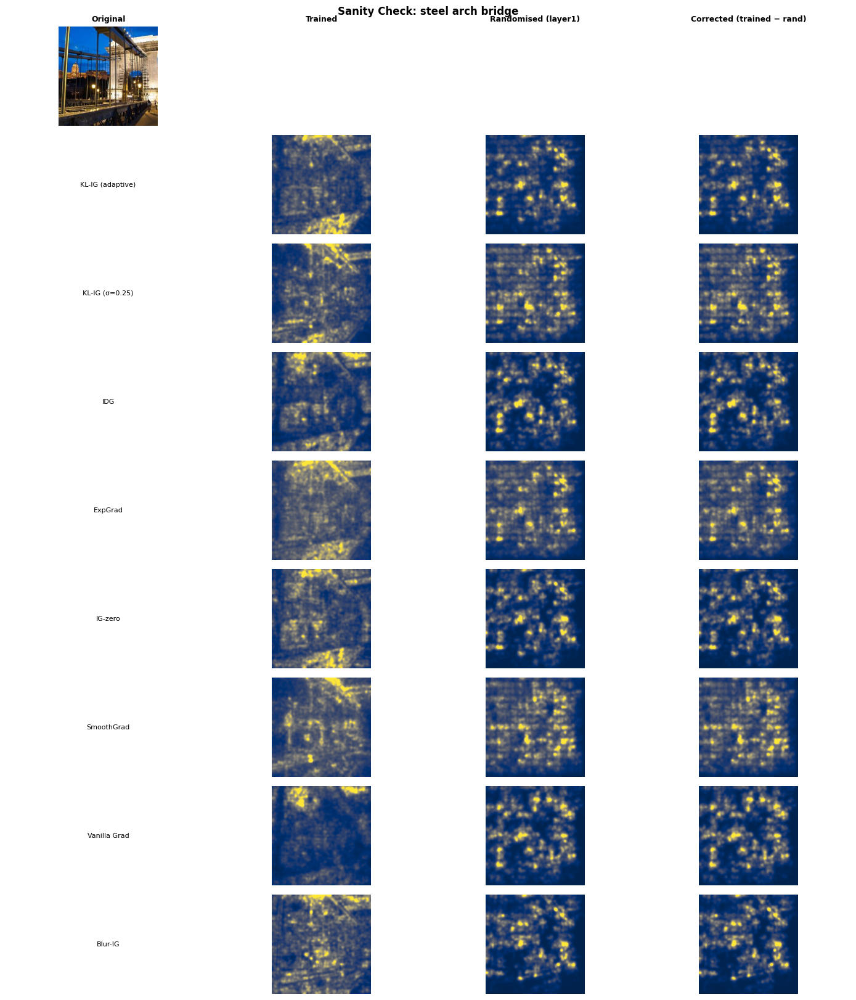

In [ ]:
# ── Sanity Check Visual: Original | Trained | Randomised | Corrected (cividis pos) ──
VIS_IDX = TOP3_IDX[1]
RAND_MODEL = cascade_models["layer1"]
r = results[VIS_IDX]; x, tgt = r["x"], r["target"]
img_np = np.clip(denormalize(x[0]).detach().cpu().permute(1,2,0).numpy(), 0, 1)

trained_amaps = {}; random_amaps = {}
for sigma_name in ["adaptive", "σ=0.25"]:
    sf = get_sigma_final(sigma_name, model, x, tgt)
    m  = f"KL-IG ({sigma_name})"
    trained_amaps[m] = sum_collapse(raw_klig(model,      x, tgt, sf))
    random_amaps[m]  = sum_collapse(raw_klig(RAND_MODEL, x, tgt, sf))
for m, fn in RAW_FN.items():
    trained_amaps[m] = sum_collapse(fn(model,      x, tgt))
    random_amaps[m]  = sum_collapse(fn(RAND_MODEL, x, tgt))

# Corrected = trained − randomised (model-sensitive component only)
corrected_amaps = {m: trained_amaps[m] - random_amaps[m] for m in methods_all}

def _heatmap_cividis(ax, amap, title=""):
    a = gaussian_filter(np.abs(amap.detach().cpu().numpy()), sigma=2)
    vmax = np.percentile(a, 99) + 1e-12
    ax.imshow(np.clip(a / vmax, 0, 1), cmap="cividis", vmin=0, vmax=1)
    ax.set_title(title, fontsize=7); ax.axis("off")

n = len(methods_all)
fig = plt.figure(figsize=(14, n * 2.0 + 0.5), facecolor="white")
header = [plt.subplot2grid((n+1, 4), (0, c)) for c in range(4)]
header[0].imshow(img_np); header[0].set_title("Original", fontsize=9, fontweight="bold"); header[0].axis("off")
header[1].axis("off"); header[1].set_title("Trained", fontsize=9, fontweight="bold")
header[2].axis("off"); header[2].set_title("Randomised (layer1)", fontsize=9, fontweight="bold")
header[3].axis("off"); header[3].set_title("Corrected (trained − rand)", fontsize=9, fontweight="bold")

for row, m in enumerate(methods_all, start=1):
    ax_l = plt.subplot2grid((n+1, 4), (row, 0))
    ax_l.text(0.5, 0.5, m, ha="center", va="center", transform=ax_l.transAxes, fontsize=8)
    ax_l.axis("off")
    _heatmap_cividis(plt.subplot2grid((n+1, 4), (row, 1)), trained_amaps[m])
    _heatmap_cividis(plt.subplot2grid((n+1, 4), (row, 2)), random_amaps[m])
    _heatmap_cividis(plt.subplot2grid((n+1, 4), (row, 3)), corrected_amaps[m])

plt.suptitle(f"Sanity Check: {r['label_str']}", fontweight="bold", fontsize=12)
plt.tight_layout()
plt.savefig("sanity_visual.png", dpi=150, bbox_inches="tight")
plt.show()

#Images


In [ ]:
from scipy.ndimage import gaussian_filter
import random; random.seed(42)

buckets2 = {cat: [] for cat in IMAGE_TYPE_KEYWORDS}
for idx in eval_idx:
    cat = classify_label(results[idx]["label_str"])
    if cat in buckets2: buckets2[cat].append(idx)

## top 5 highest sigma_final across all categories
all_ids = [idx for ids in buckets2.values() for idx in ids]
VIS = sorted(all_ids,
             key=lambda i: get_sigma_final("adaptive", model,
                                           results[i]["x"], results[i]["target"]),
             reverse=True)[:5]
print([(results[i]["label_str"][:20],
        f"σ_f={get_sigma_final('adaptive', model, results[i]['x'], results[i]['target']):.3f}")
       for i in VIS])

N_STEPS  = 100
N_EPS    = 64
CHECKPTS = [0.25, 0.50, 0.75, 1.00]
N_COLS   = 1 + len(CHECKPTS)

fig, axes = plt.subplots(len(VIS), N_COLS,
                         figsize=(N_COLS * 2.5, len(VIS) * 2.5),
                         facecolor="white")
if len(VIS) == 1: axes = axes[np.newaxis, :]

col_titles = ["original", "0%→25%", "25%→50%", "50%→75%", "75%→100%"]
for c, t in enumerate(col_titles):
    axes[0, c].set_title(t, fontsize=9, fontweight="bold")

torch.manual_seed(0)
for row, idx in enumerate(tqdm(VIS, desc="path attribution")):
    r  = results[idx]; x, tgt = r["x"], r["target"]
    sf = get_sigma_final("adaptive", model, x, tgt)

    img_np = np.clip(denormalize(x[0]).detach().cpu().permute(1,2,0).numpy(), 0, 1)
    axes[row, 0].imshow(img_np)
    axes[row, 0].set_ylabel(f"{r['label_str'][:16]}\nσ_f={sf:.2f}", fontsize=7, labelpad=4)

    snap_steps = {int(c * N_STEPS): c for c in CHECKPTS}
    snap_maps  = {}
    prev       = torch.zeros(x.shape[1], *x.shape[-2:], device=x.device)
    cumulative = torch.zeros(x.shape[1], *x.shape[-2:], device=x.device)

    for step in range(1, N_STEPS + 1):
        t     = step / N_STEPS
        eps_b = torch.randn(N_EPS, *x.shape[1:], device=x.device)
        x_t   = (x + eps_b * t * sf).detach().requires_grad_(True)
        model(x_t)[:, tgt].sum().backward()
        cumulative += (x_t.grad * (-eps_b * sf)).mean(0).detach() / N_STEPS
        if step in snap_steps:
            snap_maps[snap_steps[step]] = (cumulative - prev).clone()
            prev = cumulative.clone()

    for ci, c in enumerate(CHECKPTS, start=1):
        a    = snap_maps[c].clamp(min=0).sum(0).detach().cpu().numpy()
        vmax = np.percentile(a, 99) + 1e-8   # per-bin normalization
        img  = plt.get_cmap("cividis")(np.clip(a / vmax, 0, 1))[:, :, :3]
        axes[row, ci].imshow(img)
        axes[row, ci].axis("off")

    axes[row, 0].axis("off")

plt.suptitle("KL-IG — attribution \n",
             fontweight="bold", fontsize=12)
plt.tight_layout(pad=0.3)
plt.savefig("klig_path_grid.png", dpi=150, bbox_inches="tight")
plt.show()

In [ ]:

N_PREVIEW  = 30
CONF_GAP   = 0.20
MIN_TOP1   = 0.25     # model must be at least 25% confident

candidates = []
for idx in eval_idx:
    r = results[idx]; x, tgt = r["x"], r["target"]
    with torch.no_grad():
        probs    = model(x).softmax(-1)[0]
        top_p, top_c = probs.topk(3)
        top_p    = top_p.cpu().numpy(); top_c = top_c.cpu().tolist()
    if top_p[0] < MIN_TOP1: continue
    gap = float(top_p[0] - top_p[1])
    if gap < CONF_GAP:
        candidates.append({"idx": idx, "label": r["label_str"],
                           "target": tgt, "top_p": top_p,
                           "top_c": top_c, "gap": gap})

candidates.sort(key=lambda d: d["gap"])
candidates = candidates[:N_PREVIEW]

# preview grid
NCOLS = 5
NROWS = math.ceil(len(candidates) / NCOLS)
fig, axes = plt.subplots(NROWS, NCOLS, figsize=(NCOLS * 2.5, NROWS * 3.0))
axes = axes.ravel()

for i, d in enumerate(candidates):
    img_np = np.clip(denormalize(results[d["idx"]]["x"][0])
                     .detach().cpu().permute(1,2,0).numpy(), 0, 1)
    axes[i].imshow(img_np); axes[i].axis("off")
    axes[i].set_title(
        f"[{i}] {d['label'][:14]}\n"
        f"{imagenet_labels[d['top_c'][0]][:14]} {d['top_p'][0]:.0%}\n"
        f"{imagenet_labels[d['top_c'][1]][:14]} {d['top_p'][1]:.0%}",
        fontsize=6, color="black")

for ax in axes[len(candidates):]: ax.axis("off")
plt.suptitle("Confused candidates — note the index [i] and set VIS_CONFUSED below",
             fontsize=10, fontweight="bold")
plt.tight_layout(pad=0.3); plt.show()

# ── then pick by index ──
# VIS_CONFUSED = [candidates[i] for i in [0, 3, 7, 11, 15]]

In [ ]:
from scipy.ndimage import gaussian_filter

VIS_CONFUSED = [candidates[i] for i in [7, 9, 13, 14, 23]]
TOP_K = 3

def _saliency(model, x, cls, sf):
    raw  = raw_klig(model, x, cls, sf)
    a    = raw.clamp(min=0).sum(dim=0).detach().cpu().numpy()
    vmax = np.percentile(a, 99); vmax = vmax if vmax > 1e-12 else 1.0
    return plt.get_cmap("cividis")(np.clip(a / vmax, 0, 1))[:, :, :3]

N_COLS = 1 + TOP_K
fig, axes = plt.subplots(len(VIS_CONFUSED), N_COLS,
                         figsize=(N_COLS * 3.0, len(VIS_CONFUSED) * 3.0),
                         facecolor="white")

for row, d in enumerate(VIS_CONFUSED):
    r  = results[d["idx"]]; x = r["x"]
    sf = get_sigma_final("adaptive", model, x, r["target"])

    img_np = np.clip(denormalize(x[0]).detach().cpu().permute(1,2,0).numpy(), 0, 1)
    axes[row, 0].imshow(img_np); axes[row, 0].axis("off")
    axes[row, 0].set_ylabel(d["label"][:18], fontsize=8)
    if row == 0:
        axes[row, 0].set_title("Original", fontsize=10, fontweight="bold")

    for ci, (cls, prob) in enumerate(zip(d["top_c"], d["top_p"]), start=1):
        sal   = _saliency(model, x, cls, sf)
        match = "✓" if cls == d["target"] else "✗"
        axes[row, ci].imshow(sal); axes[row, ci].axis("off")
        axes[row, ci].set_title(
            f"{match} {imagenet_labels[cls][:18]}\nP={prob:.3f}",
            fontsize=9, fontweight="bold",
            color="green" if match == "✓" else "red")

plt.suptitle("Saliency maps for competing predictions", fontsize=12, fontweight="bold")
plt.tight_layout(pad=0.4)
plt.savefig("class_sensitivity.png", dpi=150, bbox_inches="tight")
plt.show()

In [ ]:

import random
random.seed(42)

IMAGE_TYPE_KEYWORDS = {
    "animal":    ["dog","cat","bird","fish","snake","lizard","frog","elephant",
                  "tiger","lion","bear","fox","wolf","deer","horse","cow","sheep",
                  "monkey","ape","panda","leopard","zebra","penguin","owl","eagle",
                  "whale","shark","spider","beetle","rabbit","squirrel","goat",
                  "pig","camel","kangaroo","ostrich"],
    "vehicle":   ["car","truck","bus","train","boat","ship","airplane","bicycle",
                  "motorcycle","cab","wagon","trailer","scooter","ambulance"],
  #  "object":    ["chair","table","lamp","bottle","cup","book","keyboard","phone",
  #                "computer","clock","watch","monitor","camera","scissors",
  #                "umbrella","mask","helmet","backpack","tie"],
    "food":      ["bread","pizza","cake","apple","banana","orange","broccoli",
                  "sandwich","hotdog","donut","cheese","mushroom","strawberry",
                  "lemon","ice cream"]
   # "nature":    ["tree","flower","mountain","beach","lake","forest","valley",
    #              "cliff","seashore","volcano","coral","alp","hill","river"],
  #  "structure": ["building","castle","church","tower","bridge","dome","barn",
   #               "lighthouse","palace","fountain","stadium"],
}

def classify_label(label_str):
    s = label_str.lower()
    for cat, kws in IMAGE_TYPE_KEYWORDS.items():
        if any(kw in s for kw in kws): return cat
    return "other"

buckets = {cat: [] for cat in IMAGE_TYPE_KEYWORDS}; buckets["other"] = []
for idx in eval_idx:
    buckets[classify_label(results[idx]["label_str"])].append(idx)

N_PER_CATEGORY = 1
vis_idx, vis_cats = [], []
for cat in IMAGE_TYPE_KEYWORDS.keys():
    ids = buckets[cat][:]; random.shuffle(ids)
    for i in ids[:N_PER_CATEGORY]:
        vis_idx.append(i); vis_cats.append(cat)

print(f"Selected {len(vis_idx)} images across {len(set(vis_cats))} categories: {sorted(set(vis_cats))}")

KLIG_SIGMAS_VIS = ["adaptive", "σ=0.25"]
BASELINE_MS_VIS = ["IDG", "ExpGrad", "IG-zero", "Blur-IG", "SmoothGrad", "Vanilla Grad"]
N_VIS  = len(vis_idx)
N_COLS = 1 + len(KLIG_SIGMAS_VIS) + len(BASELINE_MS_VIS)

fig, axes = plt.subplots(N_VIS * 2, N_COLS,
                         figsize=(N_COLS * 2.0, N_VIS * 4.0),
                         facecolor="white")
if N_VIS == 1: axes = axes[np.newaxis, :]

def _pos_neg_pair(ax_pos, ax_neg, x, raw_attr):
    for ax, a_hw, cmap in [
        (ax_pos, raw_attr.clamp(min=0).sum(dim=0),       "cividis"),
        (ax_neg, raw_attr.clamp(max=0).abs().sum(dim=0), "cividis_r"),
    ]:
        a = a_hw.detach().cpu().numpy()
        vmax = np.percentile(a, 99); vmax = vmax if vmax > 1e-12 else 1.0
        ax.imshow(np.clip(a / vmax, 0, 1), cmap=cmap, vmin=0, vmax=1)
        ax.set_xticks([]); ax.set_yticks([])

for row, (idx, cat) in enumerate(tqdm(list(zip(vis_idx, vis_cats)),
                                       desc="qual all methods")):
    r = results[idx]; x, tgt = r["x"], r["target"]
    img_np = np.clip(denormalize(x[0]).detach().cpu().permute(1,2,0).numpy(), 0, 1)
    r_pos, r_neg = row * 2, row * 2 + 1
    for ri in [r_pos, r_neg]:
        axes[ri, 0].imshow(img_np); axes[ri, 0].set_xticks([]); axes[ri, 0].set_yticks([])
    axes[r_pos, 0].set_ylabel(f"[{cat}]\n{r['label_str'][:18]}\n(+)",
                               fontsize=7, rotation=0, labelpad=65, va="center", fontweight="bold")
    axes[r_neg, 0].set_ylabel("(−)", fontsize=9, rotation=0, labelpad=65, va="center")

    for col_offset, sigma_name in enumerate(KLIG_SIGMAS_VIS):
        sf = get_sigma_final(sigma_name, model, x, tgt)
        raw = raw_klig(model, x, tgt, sf)
        _pos_neg_pair(axes[r_pos, 1 + col_offset], axes[r_neg, 1 + col_offset], x, raw)

    for col_offset, m in enumerate(BASELINE_MS_VIS):
        raw = RAW_FN[m](model, x, tgt)
        _pos_neg_pair(axes[r_pos, 1 + len(KLIG_SIGMAS_VIS) + col_offset],
                      axes[r_neg, 1 + len(KLIG_SIGMAS_VIS) + col_offset], x, raw)

axes[0, 0].set_title("Original", fontsize=9, fontweight="bold")
col_titles = [f"KL-IG ({sn})" for sn in KLIG_SIGMAS_VIS] + BASELINE_MS_VIS
for col, ttl in enumerate(col_titles, start=1):
    axes[0, col].set_title(ttl, fontsize=8, fontweight="bold")

plt.tight_layout()
plt.savefig("qualitative_all_methods_by_type.png", dpi=180, bbox_inches="tight")
plt.show()

[cache] loaded 164 multi-class images
Step 1 — 164 images with ≥2 classes > 0.1  (186 pairs total)


all methods:   0%|          | 0/164 [00:00<?, ?it/s]

Step 2 — 186 pairs per method


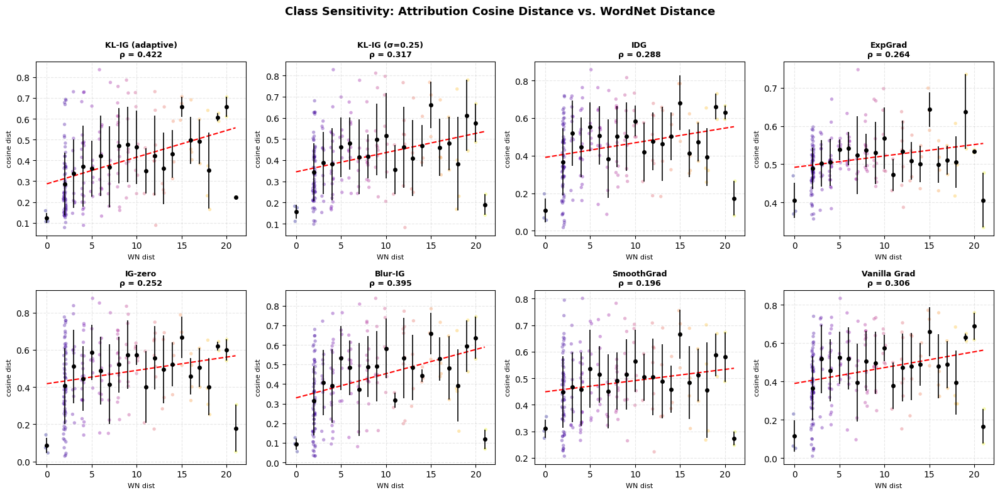


Method                  ρ(WN,cos)          p      n
----------------------------------------------------
  KL-IG (adaptive)          0.422     0.0000    186
  KL-IG (σ=0.25)            0.317     0.0000    186
  IDG                       0.288     0.0001    186
  ExpGrad                   0.264     0.0003    186
  IG-zero                   0.252     0.0005    186
  Blur-IG                   0.395     0.0000    186
  SmoothGrad                0.196     0.0073    186
  Vanilla Grad              0.306     0.0000    186


In [ ]:
# ── Class Sensitivity: End-to-End — All Methods ────────────────────────────
import pickle, itertools, nltk
nltk.download("wordnet", quiet=True)
from nltk.corpus import wordnet as wn
from scipy.stats import spearmanr
from torchvision.models import ResNet50_Weights

PROB_THRESH = 0.1
N_IMGS      = 1000

ATTR_FNS = {
    "KL-IG (adaptive)": lambda x, cls, sf: raw_klig(model, x, cls, sf),
    "KL-IG (σ=0.25)":   lambda x, cls, sf: raw_klig(model, x, cls, 0.25),
    "IDG":              lambda x, cls, sf: raw_idg(model, x, cls),
    "ExpGrad":          lambda x, cls, sf: raw_expgrad(model, x, cls),
    "IG-zero":          lambda x, cls, sf: raw_ig_zero(model, x, cls),
    "Blur-IG":          lambda x, cls, sf: raw_blur_ig(model, x, cls),
    "SmoothGrad":       lambda x, cls, sf: raw_smoothgrad(model, x, cls),
    "Vanilla Grad":     lambda x, cls, sf: raw_vanilla(model, x, cls),
}

imagenet_labels = ResNet50_Weights.IMAGENET1K_V2.meta["categories"]

def label_to_synset(label):
    phrase = label.lower().split(",")[0].strip()
    candidates = []
    for candidate in [phrase.replace(" ", "_"), phrase]:
        candidates.extend(wn.synsets(candidate, pos=wn.NOUN))
    if not candidates:
        for w in sorted(phrase.split(), key=len, reverse=True):
            if len(w) > 3:
                candidates.extend(wn.synsets(w, pos=wn.NOUN))
                if candidates: break
    if not candidates:
        return None
    return max(candidates, key=lambda s: s.min_depth())

cls_synsets = {i: label_to_synset(imagenet_labels[i]) for i in range(1000)}

def cosine_dist(a_i, a_j):
    ai = a_i.astype(np.float64)
    aj = a_j.astype(np.float64)
    norm = np.linalg.norm(ai) * np.linalg.norm(aj)
    if norm < 1e-12:
        return 1.0
    return float(1.0 - (ai @ aj) / norm)

# ── Step 1: filter images with ≥2 classes above PROB_THRESH (cached) ──
_cache_imgs = CACHE_DIR / "multiprob_imgs.pkl"

if _cache_imgs.exists():
    multi_imgs = pickle.load(open(_cache_imgs, "rb"))
    print(f"[cache] loaded {len(multi_imgs)} multi-class images")
else:
    multi_imgs = []
    for idx in eval_idx[:N_IMGS]:
        r = results[idx]; x = r["x"]
        with torch.no_grad():
            probs = model(x).softmax(-1)[0].cpu()
        high = (probs > PROB_THRESH).nonzero(as_tuple=True)[0].tolist()
        if len(high) < 2: continue
        high = sorted(high, key=lambda c: probs[c].item(), reverse=True)
        multi_imgs.append({"idx": idx, "x": x,
                           "high_cls":   high,
                           "high_probs": [probs[c].item() for c in high]})
    pickle.dump(multi_imgs, open(_cache_imgs, "wb"))
    print(f"[computed] {len(multi_imgs)} multi-class images — saved to cache")

n_pairs_total = sum(len(list(itertools.combinations(d["high_cls"], 2))) for d in multi_imgs)
print(f"Step 1 — {len(multi_imgs)} images with ≥2 classes > {PROB_THRESH}  "
      f"({n_pairs_total} pairs total)")

# ── Step 2: cosine attribution distance + incremental save ──
_cache   = CACHE_DIR / "multiprob_e2e_cos.pkl"
_cache_n = CACHE_DIR / "multiprob_e2e_cos_n.pkl"

if _cache.exists():
    scatter_all = pickle.load(open(_cache, "rb"))
    done_imgs   = pickle.load(open(_cache_n, "rb"))
    print(f"[resume] {sum(len(v) for v in scatter_all.values())} points, img {done_imgs}/{len(multi_imgs)}")
else:
    scatter_all = {m: [] for m in ATTR_FNS}
    done_imgs   = 0

for d in tqdm(multi_imgs[done_imgs:], desc="all methods"):
    x        = d["x"]
    high_cls = d["high_cls"]
    top_cls  = high_cls[0]
    sf       = get_sigma_final("adaptive", model, x, top_cls)

    for ci, cj in itertools.combinations(high_cls, 2):
        s_i = cls_synsets.get(ci)
        s_j = cls_synsets.get(cj)
        if s_i is None or s_j is None: continue
        dist = s_i.shortest_path_distance(s_j)
        if dist is None: continue

        for mname, fn in ATTR_FNS.items():
            a_i = fn(x, ci, sf).clamp(min=0).sum(0).detach().cpu().numpy().ravel()
            a_j = fn(x, cj, sf).clamp(min=0).sum(0).detach().cpu().numpy().ravel()
            scatter_all[mname].append((dist, cosine_dist(a_i, a_j)))

    done_imgs += 1
    pickle.dump(scatter_all, open(_cache,   "wb"))
    pickle.dump(done_imgs,   open(_cache_n, "wb"))

print(f"Step 2 — {len(scatter_all['KL-IG (adaptive)'])} pairs per method")

# ── Step 3: 2×4 subplot — one per method ──
fig, axes = plt.subplots(2, 4, figsize=(16, 8), facecolor="white")
axes = axes.ravel()

for ax, mname in zip(axes, ATTR_FNS):
    pts   = scatter_all[mname]
    dists = np.array([p[0] for p in pts])
    divs  = np.array([p[1] for p in pts])
    jitter = np.random.default_rng(0).uniform(-0.15, 0.15, size=len(dists))
    ax.scatter(dists + jitter, divs, alpha=0.35, s=15,
               c=dists, cmap="plasma", edgecolors="none")
    for d in sorted(set(dists)):
        vals = divs[dists == d]
        if len(vals) >= 2:
            ax.errorbar(d, vals.mean(), yerr=vals.std(), fmt="o",
                        color="black", ms=4, lw=1.2, zorder=5)
        else:
            ax.scatter([d], [vals.mean()], color="black", s=30, zorder=5)
    z  = np.polyfit(dists, divs, 1)
    xs = np.linspace(dists.min(), dists.max(), 100)
    ax.plot(xs, np.poly1d(z)(xs), "r--", lw=1.5)
    rho_m, pval = spearmanr(dists, divs)
    ax.set_title(f"{mname}\nρ = {rho_m:.3f}", fontsize=9, fontweight="bold")
    ax.set_xlabel("WN dist", fontsize=8)
    ax.set_ylabel("cosine dist", fontsize=8)
    ax.grid(True, alpha=0.3, linestyle="--")

plt.suptitle("Class Sensitivity: Attribution Cosine Distance vs. WordNet Distance",
             fontsize=13, fontweight="bold")
plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.savefig("multiprob_scatter_cos.png", dpi=150, bbox_inches="tight")
plt.show()

print(f"\n{'Method':<22} {'ρ(WN,cos)':>10} {'p':>10} {'n':>6}")
print("-" * 52)
for mname, pts in scatter_all.items():
    dists = np.array([p[0] for p in pts])
    divs  = np.array([p[1] for p in pts])
    rho_m, pval = spearmanr(dists, divs)
    print(f"  {mname:<20} {rho_m:>10.3f} {pval:>10.4f} {len(pts):>6}")

#Path Attr

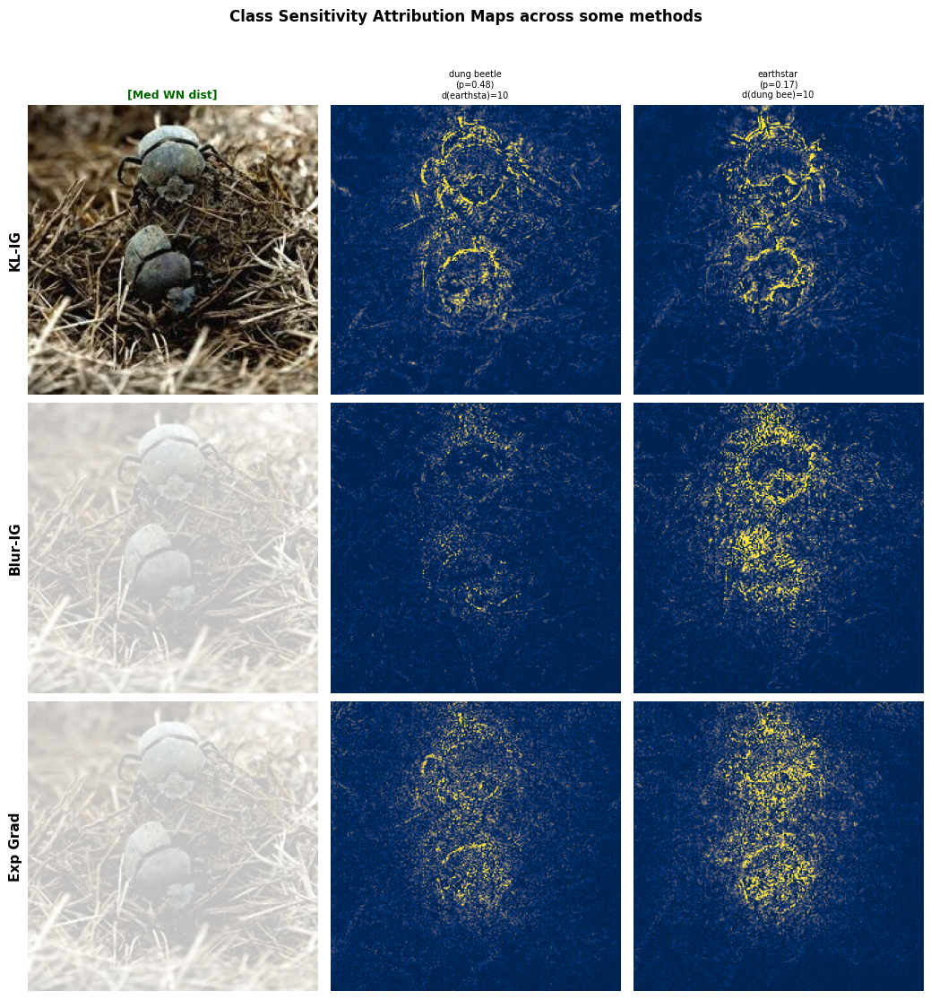

In [ ]:
# ── Single Med-WN-distance example: KL-IG vs Blur-IG vs Vanilla Grad ──
random.shuffle(all_candidates)
seen = set()

def pick(dist_min, dist_max, n):
    out = []
    for dist, d, ci, cj in all_candidates:
        if not (dist_min <= dist <= dist_max): continue
        if d["idx"] in seen: continue
        seen.add(d["idx"])
        out.append((d, dist))
        if len(out) == n: break
    return out

med_rows = pick(9, 16, 1)
assert len(med_rows) == 1, "no medium-distance image found"
d, dist = med_rows[0]

_MEAN = torch.tensor([0.485, 0.456, 0.406])[:, None, None]
_STD  = torch.tensor([0.229, 0.224, 0.225])[:, None, None]

METHODS = [
    ("KL-IG",        lambda x, cls, sf: raw_klig(model, x, cls, sf).clamp(min=0).sum(0).detach().cpu().numpy()),
    ("Blur-IG",      lambda x, cls, sf: raw_blur_ig(model, x, cls).clamp(min=0).sum(0).detach().cpu().numpy()),
    ("Exp Grad", lambda x, cls, sf: raw_expgrad(model, x, cls).clamp(min=0).sum(0).detach().cpu().numpy()),
]


x        = d["x"]
high_cls = d["high_cls"]
sf       = get_sigma_final("adaptive", model, x, high_cls[0])

# pairwise WN distances among classes in this image
wn_dists = {}
for i, ci in enumerate(high_cls):
    for j, cj in enumerate(high_cls):
        if i == j: continue
        s_i, s_j = cls_synsets.get(ci), cls_synsets.get(cj)
        if s_i and s_j:
            wn_dists[(i, j)] = s_i.shortest_path_distance(s_j)

img_show = (x[0].cpu() * _STD + _MEAN).clamp(0, 1).permute(1, 2, 0).detach().numpy()

n_methods = len(METHODS)
n_cols    = 1 + len(high_cls)
fig, axes = plt.subplots(n_methods, n_cols,
                         figsize=(3.5 * n_cols, 3.8 * n_methods),
                         facecolor="white")
if n_methods == 1:
    axes = axes[np.newaxis, :]

for m_i, (mname, attr_fn) in enumerate(METHODS):
    attrs = [attr_fn(x, cls, sf) for cls in high_cls]
    vmax  = np.percentile(np.concatenate([a.ravel() for a in attrs]), 99)

    # Col 0: original image (faded on non-first rows so it visually anchors but doesn't repeat noisily)
    if m_i == 0:
        axes[m_i, 0].imshow(img_show)
        axes[m_i, 0].set_title("[Med WN dist]", fontsize=9, fontweight="bold",
                               color="darkgreen")
    else:
        axes[m_i, 0].imshow(img_show, alpha=0.25)
    axes[m_i, 0].set_ylabel(mname, fontsize=11, fontweight="bold")
    axes[m_i, 0].set_xticks([]); axes[m_i, 0].set_yticks([])
    for spine in axes[m_i, 0].spines.values():
        spine.set_visible(False)

    for col_i, (cls, a) in enumerate(zip(high_cls, attrs), start=1):
        p = d["high_probs"][d["high_cls"].index(cls)]
        short_name = imagenet_labels[cls].split(",")[0]
        dist_strs = ", ".join(
            f"d({imagenet_labels[high_cls[j]].split(',')[0][:8]})={wn_dists.get((col_i-1, j), '?')}"
            for j in range(len(high_cls)) if j != col_i - 1
        )
        axes[m_i, col_i].imshow(a, cmap="cividis", vmin=0, vmax=vmax)
        if m_i == 0:
            axes[m_i, col_i].set_title(f"{short_name}\n(p={p:.2f})\n{dist_strs}",
                                       fontsize=7)
        axes[m_i, col_i].axis("off")

plt.suptitle("Class Sensitivity Attribution Maps across some methods",
             fontsize=12, fontweight="bold")
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.savefig("wn_distance_examples_med.png", dpi=150, bbox_inches="tight")
plt.show()

In [ ]:
# ── Find 10 images with foreground > 50% ───────────────────────────────────
import random
import pickle, random

_cand_cache = CACHE_DIR / "path_viz_candidates.pkl"
candidates  = pickle.load(open(_cand_cache, "rb"))
n           = len(candidates) - 1
indices     = [0, n // 3, (2 * n) // 3, n]
selected    = [candidates[i] for i in indices]
print(f"Loaded {len(candidates)} candidates")

fg_pool = []
for cand, sf_c in tqdm(candidates, desc="scanning foreground"):
    x_c   = cand["x"]
    tgt_c = cand["high_cls"][0]
    # use vanilla grad for fast mask estimate
    a_quick = raw_vanilla(model, x_c, tgt_c).clamp(min=0).sum(0).detach()
    mask    = estimate_object_mask(x_c, a_quick)
    frac    = float(mask.mean())
    if frac > 0.50:
        fg_pool.append((cand, sf_c, frac))
    if len(fg_pool) >= 10:
        break

print(f"Found {len(fg_pool)} foreground-dominant images:")
for i, (c, sf_c, frac) in enumerate(fg_pool):
    print(f"  [{i}] {imagenet_labels[c['high_cls'][0]]:<30} fg={frac:.2f}  σ={sf_c:.3f}")



Loaded 901 candidates


scanning foreground:   1%|          | 9/901 [00:03<05:56,  2.50it/s]

Found 10 foreground-dominant images:
  [0] lakeside                       fg=1.00  σ=0.006
  [1] whiskey jug                    fg=0.99  σ=0.008
  [2] plate                          fg=0.95  σ=0.011
  [3] bookcase                       fg=0.90  σ=0.013
  [4] steel arch bridge              fg=0.97  σ=0.013
  [5] kelpie                         fg=0.58  σ=0.013
  [6] barbell                        fg=1.00  σ=0.014
  [7] cocktail shaker                fg=0.90  σ=0.015
  [8] barn spider                    fg=1.00  σ=0.016
  [9] green mamba                    fg=0.95  σ=0.016


Selected: barn spider  fg=1.00  σ_adapt=0.016
Computing cumulative attribution maps...


methods: 100%|██████████| 3/3 [00:05<00:00,  1.97s/it]


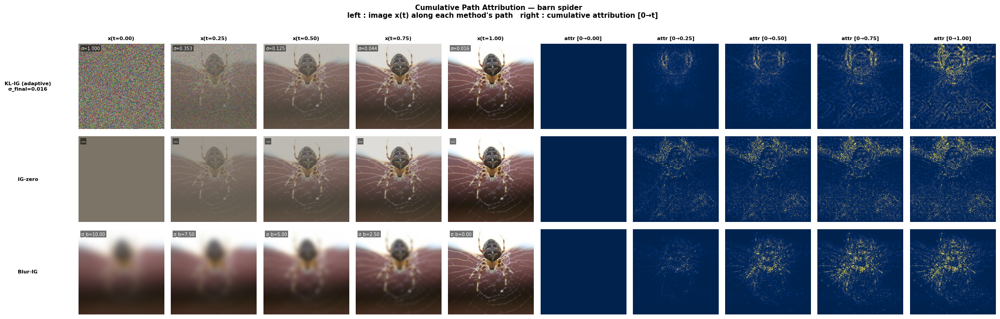

In [ ]:
# ── Path Attribution Build-up — REAL cumulative integration + image formation per method ───
import math, random
import numpy as np
import torch
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter as sp_gf
from captum.attr import Saliency

_MEAN = torch.tensor([0.485, 0.456, 0.406])[:, None, None]
_STD  = torch.tensor([0.229, 0.224, 0.225])[:, None, None]

def _denorm(x_chw):
    return ((x_chw * _STD + _MEAN).clamp(0, 1).permute(1, 2, 0).numpy())

# ── Pick one image ──
# was: d, sf, frac = random.choice(fg_pool)
TARGET_VIZ  = "barn spider"
d, sf, frac = next(
    e for e in fg_pool if imagenet_labels[e[0]["high_cls"][0]] == TARGET_VIZ
)
x        = d["x"]
target   = d["high_cls"][0]
mu       = x.squeeze(0).detach().cpu()
img_orig = _denorm(mu)
print(f"Selected: {imagenet_labels[target]}  fg={frac:.2f}  σ_adapt={sf:.3f}")

VIS_METHODS = [
    "KL-IG (adaptive)",
    "IG-zero",
    "Blur-IG",
]
T_STEPS        = [0.0, 0.25, 0.5, 0.75, 1.0]
N_PATH_STEPS   = 50
N_MC           = 10
N_BG           = 50
N_SG           = 50
BLUR_SIGMA_MAX = 10.0

def _xb(x):
    dev = next(model.parameters()).device
    return (x if x.dim()==4 else x.unsqueeze(0)).to(dev)


# ── Per-method image x(t) along that method's path ─────────────────────────
def method_image_at(method, t, eg_bg_cpu):
    """Return (rgb_image, sigma_label_str) for path position t under each method."""
    if method == "KL-IG (adaptive)":
        sigma   = sf
        sigma_t = sigma ** t
        mu_t     = t * mu
        logvar_t = t * torch.full_like(mu, 2 * math.log(max(sigma, 1e-7)))
        x_t      = mu_t + (0.5 * logvar_t).exp() * torch.randn_like(mu)
        return _denorm(x_t), f"σ={sigma_t:.3f}"

    if method == "KL-IG (σ=0.25)":
        sigma   = 0.25
        sigma_t = sigma ** t
        mu_t     = t * mu
        logvar_t = t * torch.full_like(mu, 2 * math.log(sigma))
        x_t      = mu_t + (0.5 * logvar_t).exp() * torch.randn_like(mu)
        return _denorm(x_t), f"σ={sigma_t:.3f}"

    if method in ("IG-zero", "IDG"):
        return _denorm(t * mu), "—"

    if method == "Blur-IG":
        sigma_blur = BLUR_SIGMA_MAX * (1.0 - t)
        x_np = mu.numpy()
        if sigma_blur > 0.01:
            blurred = np.stack([sp_gf(x_np[c], sigma=sigma_blur) for c in range(3)])
        else:
            blurred = x_np
        return _denorm(torch.tensor(blurred)), f"σ_b={sigma_blur:.2f}"

    if method == "ExpGrad":
        bg = eg_bg_cpu[0]
        x_t = bg + t * (mu - bg)
        return _denorm(x_t), "—"

    if method == "SmoothGrad":
      std    = 0.15 * float(mu.max() - mu.min())
      n_used = int(round(t * N_SG))
      g = torch.Generator().manual_seed(1000 + int(t * 1000))
      x_t = mu + torch.randn(mu.shape, generator=g) * std
      return _denorm(x_t), f"n={n_used}/{N_SG}\nσ_sg={std:.2f}"

    if method == "Vanilla Grad":
        return _denorm(mu), "—"

    raise ValueError(method)


# ── Partial integration ─────────────────────────────────────────────

def partial_klig(model, x, target, sigma, t_max,
                 n_steps=N_PATH_STEPS, n_samples=N_MC):
    dev    = next(model.parameters()).device
    x1     = x.squeeze(0).to(dev).detach()
    if t_max <= 0: return torch.zeros_like(x1)
    sigma  = max(sigma, 1e-7)
    mu_f   = x1
    logv_f = torch.full_like(mu_f, 2 * math.log(sigma))
    steps  = torch.linspace(0.5/n_steps, 1 - 0.5/n_steps, n_steps, device=dev)
    attr   = torch.zeros_like(mu_f)
    for t_val in steps:
        t = float(t_val)
        if t >= t_max:
            break
        mu_t   = (t * mu_f).detach().requires_grad_(True)
        logv_t = (t * logv_f).detach().requires_grad_(True)
        eps    = torch.randn(n_samples, *mu_f.shape, device=dev)
        x_samp = mu_t + (0.5 * logv_t).exp() * eps
        obj    = model(x_samp)[:, target].mean()
        g_mu, g_lv = torch.autograd.grad(obj, [mu_t, logv_t])
        attr += g_mu * mu_f + g_lv * logv_f
    return (attr / n_steps).detach()


def partial_ig_zero(model, x, target, t_max, n_steps=N_PATH_STEPS):
    dev = next(model.parameters()).device
    xb  = _xb(x).detach()
    if t_max <= 0: return torch.zeros_like(xb[0])
    all_alphas = (torch.arange(n_steps, device=dev) + 0.5) / n_steps
    alphas     = all_alphas[all_alphas < t_max]
    if len(alphas) == 0:
        return torch.zeros_like(xb[0])
    interp = (alphas.view(-1,1,1,1) * xb).requires_grad_(True)
    logits = model(interp)[:, target]
    grads  = torch.autograd.grad(logits.sum(), interp)[0]
    return (xb.squeeze(0) * grads.sum(dim=0) / n_steps).detach()


def partial_idg(model, x, target, t_max, n_steps=N_PATH_STEPS):
    dev = next(model.parameters()).device
    xb  = _xb(x).detach()
    if t_max <= 0: return torch.zeros_like(xb[0])
    n_active = max(1, int(round(t_max * n_steps)))
    step_size = t_max / n_active

    uniform = torch.linspace(0, t_max, n_active, device=dev)
    with torch.no_grad():
        logits_u = model(uniform.view(-1,1,1,1) * xb)[:, target]
    slopes = torch.zeros(n_active, device=dev)
    if n_active > 1:
        slopes[1:] = (logits_u[1:] - logits_u[:-1]) / step_size

    s_min, s_max = slopes.min(), slopes.max()
    s01 = (slopes - s_min) / (s_max - s_min + 1e-12)
    s01[0] = 0.0
    snorm = s01 / (s01.sum() + 1e-12)
    sf_ = snorm * n_active
    si = sf_.int().clone()
    rem = int(n_active - si.sum().item())
    fill = sf_.clone(); fill[si != 0] = -1.0
    if rem > 0:
        si[torch.argsort(fill, descending=True)[:rem]] = 1

    new_a = torch.zeros(n_active, device=dev)
    sub   = torch.zeros(n_active, device=dev)
    idx, sv = 0, 0.0
    for n_sub_t in si:
        n_sub = int(n_sub_t.item())
        sv_n = sv + step_size
        if n_sub > 0:
            new_a[idx:idx+n_sub] = torch.linspace(sv, sv_n, n_sub+1, device=dev)[:n_sub]
            sub[idx:idx+n_sub]   = step_size / n_sub
            idx += n_sub
        sv = sv_n

    interp = (new_a.view(-1,1,1,1) * xb).requires_grad_(True)
    logits = model(interp)[:, target]
    grads  = torch.autograd.grad(logits.sum(), interp)[0].detach()
    da = new_a[1:] - new_a[:-1]
    valid = da.abs() > 1e-7
    new_slopes = torch.zeros(n_active, device=dev)
    new_slopes[1:][valid] = (logits.detach()[1:] - logits.detach()[:-1])[valid] / da[valid]
    weighted = grads * new_slopes.view(-1,1,1,1) * sub.view(-1,1,1,1)
    return (weighted.mean(dim=0) * xb.squeeze(0)).detach()


def partial_blur_ig(model, x, target, t_max,
                    n_steps=N_PATH_STEPS, sigma_max=BLUR_SIGMA_MAX):
    dev = next(model.parameters()).device
    xb  = _xb(x).detach()
    if t_max <= 0: return torch.zeros_like(xb[0])
    x_np = xb[0].cpu().numpy()
    integrated = torch.zeros_like(xb[0])
    for k in range(n_steps):
        alpha = (k + 0.5) / n_steps
        if alpha >= t_max:
            break
        sigma_k = sigma_max * (1.0 - alpha)
        if sigma_k > 0.01:
            blurred = np.stack([sp_gf(x_np[c], sigma=sigma_k) for c in range(x_np.shape[0])])
        else:
            blurred = x_np.copy()
        xt = torch.tensor(blurred, dtype=xb.dtype, device=dev).unsqueeze(0).requires_grad_(True)
        model(xt)[0, target].backward()
        if xt.grad is not None:
            integrated += xt.grad[0].detach()
    bl = np.stack([sp_gf(x_np[c], sigma=sigma_max) for c in range(x_np.shape[0])])
    bl_t = torch.tensor(bl, dtype=xb.dtype, device=dev)
    return ((xb[0] - bl_t) * integrated / n_steps).detach()


def partial_eg(model, x, target, t_max, background, n_samples=N_BG):
    dev = next(model.parameters()).device
    xb  = _xb(x)
    if t_max <= 0: return torch.zeros_like(xb[0])
    n_active = max(1, int(round(t_max * n_samples)))
    idx = torch.randint(len(background), (n_active,))
    bg  = background[idx].to(dev)
    alpha = torch.rand(n_active, 1, 1, 1, device=dev)
    interp = (bg + alpha * (xb - bg)).requires_grad_(True)
    grads = torch.autograd.grad(model(interp)[:, target].sum(), interp)[0]
    return (grads.detach() * (xb - bg)).mean(dim=0).squeeze(0).detach()


def partial_sg(model, x, target, t_max, n_samples=N_SG):
    dev = next(model.parameters()).device
    xb  = _xb(x)
    if t_max <= 0: return torch.zeros_like(xb[0])
    std = 0.15 * float((xb.max() - xb.min()).item())
    n_active = max(1, int(round(t_max * n_samples)))
    noisy = (xb + torch.randn(n_active, *xb.shape[1:], device=dev) * std).requires_grad_(True)
    grads = torch.autograd.grad(model(noisy)[:, target].sum(), noisy)[0]
    return grads.detach().mean(dim=0).squeeze(0).detach()


def partial_vanilla(model, x, target, t_max):
    """Vanilla has no path: full map at any t > 0, zero at t = 0."""
    xb = _xb(x)
    if t_max <= 0: return torch.zeros_like(xb[0])
    return Saliency(model).attribute(xb, target=target, abs=False).detach().squeeze(0)


# ── Dispatch ──
eg_bg = make_eg_background(x, n=N_BG)
eg_bg_cpu = eg_bg.detach().cpu()

def get_partial(method, t_max):
    if method == "KL-IG (adaptive)": return partial_klig(model, x, target, sf,   t_max)
    if method == "KL-IG (σ=0.25)":   return partial_klig(model, x, target, 0.25, t_max)
    if method == "IDG":              return partial_idg(model, x, target, t_max)
    if method == "ExpGrad":          return partial_eg(model, x, target, t_max, eg_bg)
    if method == "IG-zero":          return partial_ig_zero(model, x, target, t_max)
    if method == "Blur-IG":          return partial_blur_ig(model, x, target, t_max)
    if method == "SmoothGrad":       return partial_sg(model, x, target, t_max)
    if method == "Vanilla Grad":     return partial_vanilla(model, x, target, t_max)
    raise ValueError(method)


# ── Compute all (method × t) maps ──
print("Computing cumulative attribution maps...")
maps = {m: [] for m in VIS_METHODS}
for method in tqdm(VIS_METHODS, desc="methods"):
    for t in T_STEPS:
        a = get_partial(method, t).clamp(min=0).sum(0).detach().cpu().numpy()
        maps[method].append(a)


# ── Plot: 1 row per method  | left half = images x(t)  | right half = heatmaps ──
N_T   = len(T_STEPS)
N_COLS = 2 * N_T                       # 5 imgs + 5 heatmaps = 10
N_ROWS = len(VIS_METHODS)              # 8 methods
fig, axes = plt.subplots(N_ROWS, N_COLS,
                         figsize=(2.2 * N_COLS, 2.4 * N_ROWS),
                         facecolor="white")

for mi, method in enumerate(VIS_METHODS):
    full_a = maps[method][-1]
    vmax   = max(np.percentile(full_a, 99), 1e-12)

    label = method
    if method == "KL-IG (adaptive)":
        label = f"KL-IG (adaptive)\nσ_final={sf:.3f}"

    for ci, t in enumerate(T_STEPS):
        # left half: image x(t)
        ax_img = axes[mi, ci]
        img_t, sigma_str = method_image_at(method, t, eg_bg_cpu)
        ax_img.imshow(img_t)
        ax_img.text(0.03, 0.97, sigma_str,
                    transform=ax_img.transAxes, fontsize=7,
                    color="white", va="top", ha="left",
                    bbox=dict(facecolor="black", alpha=0.55,
                              edgecolor="none", pad=1.5))
        ax_img.set_xticks([]); ax_img.set_yticks([])
        for sp in ax_img.spines.values(): sp.set_visible(False)
        if mi == 0:
            ax_img.set_title(f"x(t={t:.2f})", fontsize=8, fontweight="bold")
        if ci == 0:
            ax_img.set_ylabel(label, fontsize=8, rotation=0,
                              labelpad=80, va="center", fontweight="bold")

        # right half: cumulative attribution heatmap
        ax_attr = axes[mi, N_T + ci]
        ax_attr.imshow(maps[method][ci], cmap="cividis", vmin=0, vmax=vmax)
        ax_attr.axis("off")
        if mi == 0:
            ax_attr.set_title(f"attr [0→{t:.2f}]", fontsize=8, fontweight="bold")

plt.suptitle(
    f"Cumulative Path Attribution — {imagenet_labels[target]} \n  "
    "left : image x(t) along each method's path   "
    "right : cumulative attribution [0→t]",
    fontsize=11, fontweight="bold")
plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.savefig("path_buildup_attr.png", dpi=150, bbox_inches="tight")
plt.show()

Averaging path curves over 10 images
Computing path-attribution change curves...


images: 100%|██████████| 10/10 [00:54<00:00,  5.49s/it]


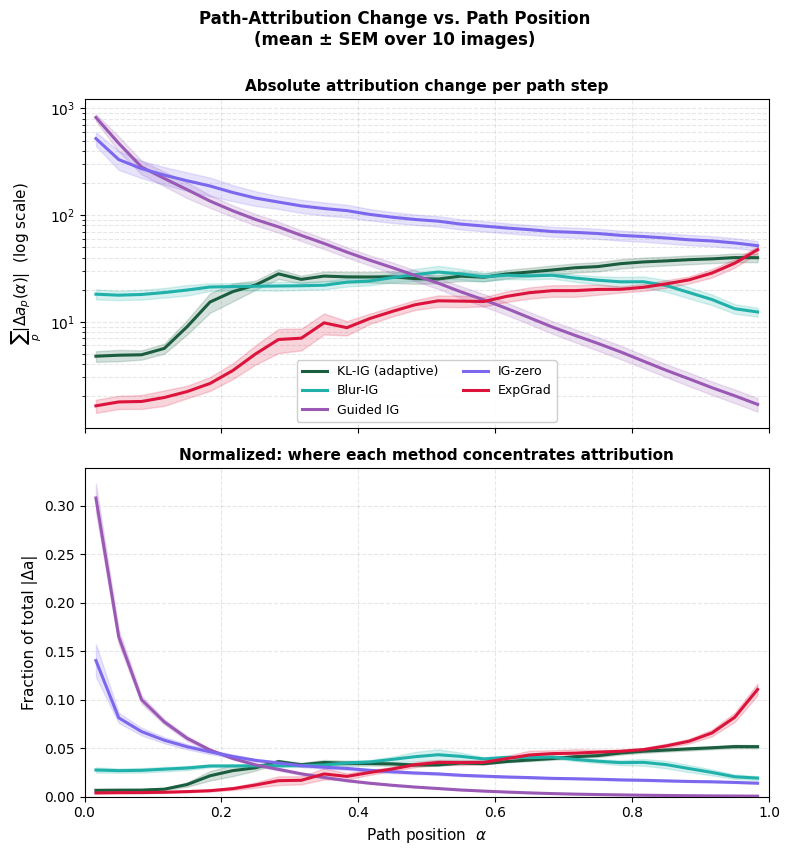

In [ ]:
# ── Path-attribution change curves (optimized for N=100) ──────────────────
import math, random
import numpy as np
import torch
import torch.nn.functional as F_t
import matplotlib.pyplot as plt
from tqdm import tqdm

# ── Config ──
PATH_METHODS = ["KL-IG (adaptive)", "Blur-IG", "Guided IG", "IG-zero", "ExpGrad"]
N_CURVE_IMGS   = 10            # bump to 100 later — same code
N_PATH_STEPS_C = 30
N_MC_C         = 5
N_EG_BG        = 5
BLUR_SIGMA_MAX = 10.0

# Guided IG params — must match attr_guided_ig in main codebase
GIG_STEPS         = 200
GIG_FRACTION      = 0.25
GIG_MAX_DIST_FRAC = 0.10

CURVE_COLORS = {
    "KL-IG (adaptive)": "#1B5E3F",
    "Blur-IG":          "#20B2AA",
    "Guided IG":        "#9B59B6",
    "IG-zero":          "#7B68EE",
    "ExpGrad":          "#DC143C",
}

random.seed(42)
img_pool = [(d, sf) for d, sf, _frac in fg_pool][:N_CURVE_IMGS]
print(f"Averaging path curves over {len(img_pool)} images")

# Pre-build ExpGrad background pool (reused across all images)
_eg_bg_pool = make_eg_background(img_pool[0][0]["x"], n=50).detach()


# ── Helper: GPU Gaussian blur (replaces scipy) ────────────────────────────
def _gauss_kernel_1d(sigma, device, dtype):
    radius = max(1, int(round(3.0 * sigma)))
    xs = torch.arange(-radius, radius + 1, device=device, dtype=dtype)
    k  = torch.exp(-(xs ** 2) / (2 * sigma ** 2))
    return k / k.sum()

def gpu_blur(x_chw, sigma):
    if sigma < 0.05:
        return x_chw.clone()
    k1d = _gauss_kernel_1d(sigma, x_chw.device, x_chw.dtype)
    r   = (k1d.numel() - 1) // 2
    C   = x_chw.shape[0]
    kx  = k1d.view(1, 1, 1, -1).expand(C, 1, 1, -1)
    ky  = k1d.view(1, 1, -1, 1).expand(C, 1, -1, 1)
    y   = F_t.pad(x_chw.unsqueeze(0), (r, r, r, r), mode="reflect")
    y   = F_t.conv2d(y, kx, groups=C)
    y   = F_t.conv2d(y, ky, groups=C)
    return y[0]


@torch.no_grad()
def _l1(t):
    return t.abs().sum().item()


# ── Per-step change functions ──────────────────────────────────────────────

def klig_change(model, x, target, sigma,
                n_steps=N_PATH_STEPS_C, n_samples=N_MC_C):
    dev    = next(model.parameters()).device
    x1     = x.squeeze(0).to(dev).detach()
    sigma  = max(sigma, 1e-7)
    mu_f   = x1
    logv_f = torch.full_like(mu_f, 2 * math.log(sigma))
    alphas = torch.linspace(0.5/n_steps, 1 - 0.5/n_steps, n_steps, device=dev)

    change = np.empty(n_steps, dtype=np.float32)
    for k, t_val in enumerate(alphas):
        t      = float(t_val)
        mu_t   = (t * mu_f).detach().requires_grad_(True)
        logv_t = (t * logv_f).detach().requires_grad_(True)
        eps    = torch.randn(n_samples, *mu_f.shape, device=dev)
        x_samp = mu_t + (0.5 * logv_t).exp() * eps
        obj    = model(x_samp)[:, target].mean()
        g_mu, g_lv = torch.autograd.grad(obj, [mu_t, logv_t])
        c = (g_mu * mu_f + g_lv * logv_f) / n_steps
        change[k] = _l1(c)
    return alphas.cpu().numpy(), change


def blur_ig_change(model, x, target,
                   n_steps=N_PATH_STEPS_C, sigma_max=BLUR_SIGMA_MAX):
    dev    = next(model.parameters()).device
    xb     = (x if x.dim() == 4 else x.unsqueeze(0)).to(dev).detach()
    x0     = xb[0]
    alphas = np.linspace(0.5/n_steps, 1 - 0.5/n_steps, n_steps)

    bl_t = gpu_blur(x0, sigma_max)
    diff = (x0 - bl_t)

    change = np.empty(n_steps, dtype=np.float32)
    for k, alpha in enumerate(alphas):
        sigma_k = sigma_max * (1.0 - alpha)
        blurred = gpu_blur(x0, sigma_k)
        xt = blurred.unsqueeze(0).detach().requires_grad_(True)
        model(xt)[0, target].backward()
        c = (diff * xt.grad[0].detach()) / n_steps
        change[k] = _l1(c)
    return alphas, change


def ig_zero_change(model, x, target, n_steps=N_PATH_STEPS_C):
    """Standard IG with zero baseline. Per-step contrib = grad·x / n_steps."""
    dev    = next(model.parameters()).device
    xb     = (x if x.dim() == 4 else x.unsqueeze(0)).to(dev).detach()
    x0     = xb[0]
    alphas = np.linspace(0.5/n_steps, 1 - 0.5/n_steps, n_steps)

    change = np.empty(n_steps, dtype=np.float32)
    for k, alpha in enumerate(alphas):
        xt = (alpha * x0).unsqueeze(0).detach().requires_grad_(True)
        model(xt)[0, target].backward()
        c = (xt.grad[0].detach() * x0) / n_steps
        change[k] = _l1(c)
    return alphas, change


def expgrad_change(model, x, target,
                   n_steps=N_PATH_STEPS_C, n_bg=N_EG_BG):
    """ExpGrad path-change: grad·(x − bg) at α-interpolated points, avg over bgs."""
    dev    = next(model.parameters()).device
    xb     = (x if x.dim() == 4 else x.unsqueeze(0)).to(dev).detach()
    x0     = xb[0]
    alphas = np.linspace(0.5/n_steps, 1 - 0.5/n_steps, n_steps)

    change = np.empty(n_steps, dtype=np.float32)
    for k, alpha in enumerate(alphas):
        idx = torch.randint(len(_eg_bg_pool), (n_bg,))
        bg  = _eg_bg_pool[idx].to(dev)
        interp = (bg + alpha * (x0 - bg)).requires_grad_(True)
        grads  = torch.autograd.grad(model(interp)[:, target].sum(), interp)[0]
        c = (grads * (x0 - bg)).mean(dim=0) / n_steps
        change[k] = _l1(c)
    return alphas, change


def guided_ig_change(model, x, target,
                     steps=GIG_STEPS, fraction=GIG_FRACTION,
                     max_dist_frac=GIG_MAX_DIST_FRAC,
                     n_bins=N_PATH_STEPS_C):
    """
    Mirrors attr_guided_ig in main codebase: greedy selection by |grad·dx|,
    geometric step decay over 200 steps, then bins to n_bins for plotting.
    """
    dev = next(model.parameters()).device
    x0  = (x if x.dim() == 4 else x.unsqueeze(0)).to(dev).detach()[0]
    x_curr  = torch.zeros_like(x0)
    n_total = x0.numel()
    n_up    = max(1, int(fraction * n_total))

    change_fine = np.zeros(steps, dtype=np.float32)

    for k in range(steps):
        dx = x0 - x_curr
        if dx.abs().max() < 1e-6:
            break
        x_t  = x_curr.unsqueeze(0).requires_grad_(True)
        grad = torch.autograd.grad(model(x_t)[0, target], x_t)[0][0].detach()

        gain   = (grad * dx).abs().view(-1)
        thresh = gain.kthvalue(max(1, n_total - n_up + 1)).values
        mask   = (gain >= thresh).view_as(x0).float()
        step   = dx * max_dist_frac * mask

        change_fine[k] = (grad * step).abs().sum().item()
        x_curr = x_curr + step

    bin_size = steps // n_bins
    change   = change_fine[:bin_size * n_bins].reshape(n_bins, bin_size).sum(axis=1)
    alphas   = np.linspace(0.5/n_bins, 1 - 0.5/n_bins, n_bins)
    return alphas, change


# ── Dispatcher ──
def get_change(method, x, target, sf):
    if method == "KL-IG (adaptive)": return klig_change(model, x, target, sf)
    if method == "Blur-IG":          return blur_ig_change(model, x, target)
    if method == "Guided IG":        return guided_ig_change(model, x, target)
    if method == "IG-zero":          return ig_zero_change(model, x, target)
    if method == "ExpGrad":          return expgrad_change(model, x, target)
    raise ValueError(method)


# ── Compute curves ──
print("Computing path-attribution change curves...")
curves = {m: np.empty((len(img_pool), N_PATH_STEPS_C), dtype=np.float32)
          for m in PATH_METHODS}
alphas_ref = None

was_training = model.training
model.eval()

try:
    for i, (d, sf) in enumerate(tqdm(img_pool, desc="images")):
        x      = d["x"]
        target = d["high_cls"][0]
        for method in PATH_METHODS:
            alphas, change = get_change(method, x, target, sf)
            if alphas_ref is None:
                alphas_ref = alphas
            curves[method][i] = change
        if torch.cuda.is_available():
            torch.cuda.empty_cache()
finally:
    if was_training:
        model.train()


# ── Plot: two panels — absolute (top) and normalized (bottom) ─────────────
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(8, 8.5), facecolor="white",
                                sharex=True)

# Top panel: absolute magnitude (log scale so Guided IG doesn't crush others)
for method in PATH_METHODS:
    arr  = curves[method]
    mean = arr.mean(axis=0)
    sem  = arr.std(axis=0) / np.sqrt(arr.shape[0])
    color = CURVE_COLORS[method]
    ax1.plot(alphas_ref, mean, color=color, lw=2.2, label=method, zorder=3)
    ax1.fill_between(alphas_ref, np.maximum(mean - sem, 1e-3), mean + sem,
                     color=color, alpha=0.18, zorder=2)
ax1.set_yscale("log")
ax1.set_ylabel(r"$\sum_p |\Delta a_p(\alpha)|$  (log scale)", fontsize=11)
ax1.set_title("Absolute attribution change per path step", fontsize=11,
              fontweight="bold")
ax1.grid(True, which="both", alpha=0.3, linestyle="--")
ax1.legend(fontsize=9, framealpha=0.95, ncol=2, loc="lower center")

# Bottom panel: normalized — fraction of total |Δa| at each α
for method in PATH_METHODS:
    arr  = curves[method]
    arr_norm = arr / (arr.sum(axis=1, keepdims=True) + 1e-12)
    mean = arr_norm.mean(axis=0)
    sem  = arr_norm.std(axis=0) / np.sqrt(arr_norm.shape[0])
    color = CURVE_COLORS[method]
    ax2.plot(alphas_ref, mean, color=color, lw=2.2, label=method, zorder=3)
    ax2.fill_between(alphas_ref, mean - sem, mean + sem,
                     color=color, alpha=0.18, zorder=2)
ax2.set_xlabel(r"Path position  $\alpha$", fontsize=11)
ax2.set_ylabel("Fraction of total |Δa|", fontsize=11)
ax2.set_title("Normalized: where each method concentrates attribution",
              fontsize=11, fontweight="bold")
ax2.grid(True, alpha=0.3, linestyle="--")
ax2.set_xlim(0, 1)
ax2.set_ylim(bottom=0)

plt.suptitle(f"Path-Attribution Change vs. Path Position\n"
             f"(mean ± SEM over {len(img_pool)} images)",
             fontsize=12, fontweight="bold", y=1.00)
plt.tight_layout()
plt.savefig("path_change_curves.png", dpi=200, bbox_inches="tight")
plt.show()

In [ ]:
# ── ADP / PIC / POS / NEG — 1k ResNet evaluation ──────────────────────────
import pickle
from pathlib import Path

N_STEPS_PERT  = 10
ADP_KEEP_FRAC = 0.50

PERT_METHODS = {
    "KL-IG (adaptive)": lambda x, tgt: raw_klig(model, x, tgt,
                            get_sigma_final("adaptive", model, x, tgt)),
    "KL-IG (σ=0.25)":   lambda x, tgt: raw_klig(model, x, tgt, 0.25),
    "IDG":              lambda x, tgt: RAW_FN["IDG"](model, x, tgt),
    "ExpGrad":          lambda x, tgt: RAW_FN["ExpGrad"](model, x, tgt),
    "IG-zero":          lambda x, tgt: RAW_FN["IG-zero"](model, x, tgt),
    "Blur-IG":          lambda x, tgt: RAW_FN["Blur-IG"](model, x, tgt),
    "SmoothGrad":       lambda x, tgt: RAW_FN["SmoothGrad"](model, x, tgt),
    "Vanilla Grad":     lambda x, tgt: RAW_FN["Vanilla Grad"](model, x, tgt),
}

_cache_pert   = CACHE_DIR / "pert_metrics_fixed.pkl"
_cache_pert_n = CACHE_DIR / "pert_metrics_fixed_n.pkl"

def eval_pert_metrics(x, attr_np, tgt):
    """
    Returns ADP, PIC, POS-AUC, NEG-AUC for one image+attribution.
    POS/NEG normalized by original confidence (IIA/MBD convention).
    ADP/PIC use top-50% pixel mask (Hadamard convention).
    """
    C, H, W = x.shape[1], x.shape[2], x.shape[3]
    n_px    = H * W
    flat    = attr_np.ravel()
    desc    = np.argsort(flat)[::-1].copy()   # most → least important
    asc     = np.argsort(flat).copy()          # least → most important
    fracs   = np.linspace(0, 0.9, N_STEPS_PERT + 1)

    # ── original confidence (single forward pass) ──
    with torch.no_grad():
        p0 = model(x).softmax(-1)[0, tgt].item()

    # ── build masked batch ──
    pos_masked, neg_masked = [], []
    for frac in fracs:
        n_rem = int(frac * n_px)

        # POS — zero most important pixels
        xf = x[0].clone().view(C, -1)
        if n_rem > 0:
            xf[:, desc[:n_rem]] = 0.0
        pos_masked.append(xf.view(C, H, W))

        # NEG — zero least important pixels
        xf = x[0].clone().view(C, -1)
        if n_rem > 0:
            xf[:, asc[:n_rem]] = 0.0
        neg_masked.append(xf.view(C, H, W))

    # ADP/PIC — keep top ADP_KEEP_FRAC, zero rest
    xf = x[0].clone().view(C, -1)
    xf[:, desc[int(ADP_KEEP_FRAC * n_px):]] = 0.0
    adp_masked = xf.view(C, H, W)

    # ── inference ──
    with torch.no_grad():
        pos_probs = model(
            torch.stack(pos_masked).to(DEVICE)
        ).softmax(-1)[:, tgt].cpu().numpy()

        neg_probs = model(
            torch.stack(neg_masked).to(DEVICE)
        ).softmax(-1)[:, tgt].cpu().numpy()

        p_adp = model(
            adp_masked.unsqueeze(0).to(DEVICE)
        ).softmax(-1)[0, tgt].item()

    # ── metrics ──
    adp     = max(0.0, p0 - p_adp) / (p0 + 1e-8) * 100.0
    pic     = 1.0 if p_adp > p0 else 0.0
    pos_auc = float(np.trapz(pos_probs / (p0 + 1e-8), fracs))
    neg_auc = float(np.trapz(neg_probs / (p0 + 1e-8), fracs))

    return adp, pic, pos_auc, neg_auc

# ── load or init cache ──
if _cache_pert.exists():
    pert_all  = pickle.load(open(_cache_pert,   "rb"))
    done_pert = pickle.load(open(_cache_pert_n, "rb"))
    print(f"[resume] {done_pert} images done")
else:
    pert_all  = {m: {"adp": [], "pic": [], "pos": [], "neg": []}
                 for m in PERT_METHODS}
    done_pert = 0

# ── evaluation loop ──
model.eval()
for param in model.parameters():
    param.requires_grad_(False)

for idx in tqdm(eval_idx[done_pert:1000], desc="ADP/PIC/POS/NEG"):
    r = results[idx]
    x, tgt = r["x"], r["target"]

    for mname, fn in PERT_METHODS.items():
        attr = fn(x, tgt).clamp(min=0).sum(0).detach().cpu().numpy()
        adp, pic, pos_auc, neg_auc = eval_pert_metrics(x, attr, tgt)
        pert_all[mname]["adp"].append(adp)
        pert_all[mname]["pic"].append(pic)
        pert_all[mname]["pos"].append(pos_auc)
        pert_all[mname]["neg"].append(neg_auc)

    done_pert += 1
    pickle.dump(pert_all,  open(_cache_pert,   "wb"))
    pickle.dump(done_pert, open(_cache_pert_n, "wb"))

for param in model.parameters():
    param.requires_grad_(True)

# ── summary table ──
ci95 = lambda v: 1.96 * np.std(v) / np.sqrt(len(v))

print(f"\n{'Method':<22} {'ADP↓':>12} {'PIC↑':>12} {'POS↓':>12} {'NEG↑':>12}")
print("─" * 72)
for mname, v in pert_all.items():
    adp_m = np.mean(v["adp"]); adp_ci = ci95(v["adp"])
    pic_m = np.mean(v["pic"]); pic_ci = ci95(v["pic"])
    pos_m = np.mean(v["pos"]); pos_ci = ci95(v["pos"])
    neg_m = np.mean(v["neg"]); neg_ci = ci95(v["neg"])
    print(f"  {mname:<20} "
          f"{adp_m:>6.2f}±{adp_ci:.2f}  "
          f"{pic_m*100:>5.1f}±{pic_ci*100:.1f}%  "
          f"{pos_m:>6.4f}±{pos_ci:.4f}  "
          f"{neg_m:>6.4f}±{neg_ci:.4f}")

ADP/PIC (GT mask):   0%|          | 0/500 [00:00<?, ?it/s]


Method                     ADP↓     PIC↑     POS↓     NEG↑
────────────────────────────────────────────────────────────
  KL-IG (adaptive)        27.47    43.8%   0.0417   0.3044
  KL-IG (σ=0.25)          31.08    45.5%   0.0384   0.3390
  IDG                     80.60     8.0%   0.0773   0.1376
  ExpGrad                 50.97    26.1%   0.0410   0.2584
  IG-zero                 74.44    11.4%   0.0636   0.1612
  Blur-IG                 64.11    15.2%   0.0538   0.1841
  SmoothGrad              70.42    12.4%   0.0878   0.1402
  Vanilla Grad            84.73     5.7%   0.0926   0.1104


In [ ]:
# ── ADP / PIC / POS / NEG — Guided IG only ─────────────────────────────────
import pickle
from pathlib import Path

N_STEPS_PERT  = 10
ADP_KEEP_FRAC = 0.50

# Use Guided IG raw fn from your dispatch
gig_fn = RAW_FN_GIG["Guided IG"]

_cache_pert_gig   = CACHE_DIR / "pert_metrics_gig.pkl"
_cache_pert_gig_n = CACHE_DIR / "pert_metrics_gig_n.pkl"

def eval_pert_metrics(x, attr_np, tgt):
    """
    Returns ADP, PIC, POS-AUC, NEG-AUC for one image+attribution.
    POS/NEG normalized by original confidence (IIA/MBD convention).
    ADP/PIC use top-50% pixel mask (Hadamard convention).
    """
    C, H, W = x.shape[1], x.shape[2], x.shape[3]
    n_px    = H * W
    flat    = attr_np.ravel()
    desc    = np.argsort(flat)[::-1].copy()
    asc     = np.argsort(flat).copy()
    fracs   = np.linspace(0, 0.9, N_STEPS_PERT + 1)

    with torch.no_grad():
        p0 = model(x).softmax(-1)[0, tgt].item()

    pos_masked, neg_masked = [], []
    for frac in fracs:
        n_rem = int(frac * n_px)
        xf = x[0].clone().view(C, -1)
        if n_rem > 0: xf[:, desc[:n_rem]] = 0.0
        pos_masked.append(xf.view(C, H, W))

        xf = x[0].clone().view(C, -1)
        if n_rem > 0: xf[:, asc[:n_rem]] = 0.0
        neg_masked.append(xf.view(C, H, W))

    xf = x[0].clone().view(C, -1)
    xf[:, desc[int(ADP_KEEP_FRAC * n_px):]] = 0.0
    adp_masked = xf.view(C, H, W)

    with torch.no_grad():
        pos_probs = model(torch.stack(pos_masked).to(DEVICE)
                          ).softmax(-1)[:, tgt].cpu().numpy()
        neg_probs = model(torch.stack(neg_masked).to(DEVICE)
                          ).softmax(-1)[:, tgt].cpu().numpy()
        p_adp     = model(adp_masked.unsqueeze(0).to(DEVICE)
                          ).softmax(-1)[0, tgt].item()

    adp     = max(0.0, p0 - p_adp) / (p0 + 1e-8) * 100.0
    pic     = 1.0 if p_adp > p0 else 0.0
    pos_auc = float(np.trapz(pos_probs / (p0 + 1e-8), fracs))
    neg_auc = float(np.trapz(neg_probs / (p0 + 1e-8), fracs))

    return adp, pic, pos_auc, neg_auc

# ── load or init cache ──
if _cache_pert_gig.exists():
    pert_gig  = pickle.load(open(_cache_pert_gig,   "rb"))
    done_pert = pickle.load(open(_cache_pert_gig_n, "rb"))
    print(f"[resume] {done_pert} images done")
else:
    pert_gig  = {"adp": [], "pic": [], "pos": [], "neg": []}
    done_pert = 0

# ── evaluation loop ──
model.eval()
for param in model.parameters():
    param.requires_grad_(False)

for idx in tqdm(eval_idx[done_pert:1000], desc="GIG ADP/PIC/POS/NEG"):
    r = results[idx]
    x, tgt = r["x"], r["target"]

    attr = gig_fn(model, x, tgt).clamp(min=0).sum(0).detach().cpu().numpy()
    adp, pic, pos_auc, neg_auc = eval_pert_metrics(x, attr, tgt)
    pert_gig["adp"].append(adp)
    pert_gig["pic"].append(pic)
    pert_gig["pos"].append(pos_auc)
    pert_gig["neg"].append(neg_auc)

    done_pert += 1
    pickle.dump(pert_gig,  open(_cache_pert_gig,   "wb"))
    pickle.dump(done_pert, open(_cache_pert_gig_n, "wb"))

for param in model.parameters():
    param.requires_grad_(True)

# ── summary ──
ci95 = lambda v: 1.96 * np.std(v) / np.sqrt(len(v))

adp_m = np.mean(pert_gig["adp"]); adp_ci = ci95(pert_gig["adp"])
pic_m = np.mean(pert_gig["pic"]); pic_ci = ci95(pert_gig["pic"])
pos_m = np.mean(pert_gig["pos"]); pos_ci = ci95(pert_gig["pos"])
neg_m = np.mean(pert_gig["neg"]); neg_ci = ci95(pert_gig["neg"])

print(f"\n{'Method':<22} {'ADP↓':>12} {'PIC↑':>12} {'POS↓':>12} {'NEG↑':>12}")
print("─" * 72)
print(f"  {'Guided IG':<20} "
      f"{adp_m:>6.2f}±{adp_ci:.2f}  "
      f"{pic_m*100:>5.1f}±{pic_ci*100:.1f}%  "
      f"{pos_m:>6.4f}±{pos_ci:.4f}  "
      f"{neg_m:>6.4f}±{neg_ci:.4f}")

# ── Optionally merge into main pert_all for unified table ──
MERGE_INTO_MAIN = True
if MERGE_INTO_MAIN:
    main_cache = CACHE_DIR / "pert_metrics_fixed.pkl"
    if main_cache.exists():
        pert_all = pickle.load(open(main_cache, "rb"))
        pert_all["Guided IG"] = pert_gig
        pickle.dump(pert_all, open(main_cache, "wb"))
        print(f"\n[merged] Guided IG into {main_cache}")
    else:
        print(f"\n[skip merge] {main_cache} not found")

GIG ADP/PIC/POS/NEG:   0%|          | 0/1000 [00:00<?, ?it/s]/tmp/ipykernel_1420/4078822663.py:55: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  pos_auc = float(np.trapz(pos_probs / (p0 + 1e-8), fracs))
/tmp/ipykernel_1420/4078822663.py:56: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  neg_auc = float(np.trapz(neg_probs / (p0 + 1e-8), fracs))
GIG ADP/PIC/POS/NEG:   1%|          | 7/1000 [00:06<14:51,  1.11it/s]

In [ ]:
from scipy import stats

def ci95(arr):
    arr = np.array(arr)
    n = len(arr)
    se = stats.sem(arr)
    return se * stats.t.ppf(0.975, df=n-1)

print(f"\n{'Method':<22} {'ADP↓':>16} {'PIC↑':>14} {'POS↓':>14} {'NEG↑':>14}")
print("─" * 82)
for mname in PERT_METHODS:
    adp_arr = np.array(adppic_all[mname]["adp"])
    pic_arr = np.array(adppic_all[mname]["pic"]) * 100
    pos_arr = np.array(pert_all[mname]["pos"])
    neg_arr = np.array(pert_all[mname]["neg"])

    print(f"  {mname:<20} "
          f"{np.mean(adp_arr):>6.2f}±{ci95(adp_arr):.2f}  "
          f"{np.mean(pic_arr):>5.1f}±{ci95(pic_arr):.1f}%  "
          f"{np.mean(pos_arr):>6.4f}±{ci95(pos_arr):.4f}  "
          f"{np.mean(neg_arr):>6.4f}±{ci95(neg_arr):.4f}")


Method                             ADP↓           PIC↑           POS↓           NEG↑
──────────────────────────────────────────────────────────────────────────────────
  KL-IG (adaptive)      27.47±3.43   43.8±4.9%  0.0417±0.0028  0.3044±0.0112
  KL-IG (σ=0.25)        31.08±3.70   45.5±4.9%  0.0384±0.0026  0.3390±0.0121
  IDG                   80.60±3.17    8.0±2.7%  0.0773±0.0049  0.1376±0.0074
  ExpGrad               50.97±3.99   26.1±4.3%  0.0410±0.0029  0.2584±0.0109
  IG-zero               74.44±3.50   11.4±3.1%  0.0636±0.0042  0.1612±0.0085
  Blur-IG               64.11±3.76   15.2±3.5%  0.0538±0.0037  0.1841±0.0094
  SmoothGrad            70.42±3.54   12.4±3.2%  0.0878±0.0057  0.1402±0.0081
  Vanilla Grad          84.73±2.84    5.7±2.3%  0.0926±0.0054  0.1104±0.0060


In [ ]:

import pickle, numpy as np, torch
import torch.nn.functional as F
from scipy import stats

CACHE_IDG_SUPP = CACHE_DIR / "idg_app_metrics.pkl"
FORCE          = False

OCC_PATCH   = 14
OCC_STRIDE  = 14    # non-overlapping — 16×16=256 positions, 1 batch per image
INFID_N     = 30
INFID_SIGMA = 0.1
N_OCC       = 1000   # OccCorr only on first 300 (fast enough)
N_TOTAL     = 1000

def _occ_corr(model, x, tgt, amap):
    _, C, H, W = x.shape
    ps, st = OCC_PATCH, OCC_STRIDE
    hs = list(range(0, H-ps+1, st)); ws = list(range(0, W-ps+1, st))
    pos = [(h,w) for h in hs for w in ws]
    # single batched forward pass
    batch = x.expand(len(pos),-1,-1,-1).clone()
    for k,(h,w) in enumerate(pos):
        batch[k,:,h:h+ps,w:w+ps] = 0.0
    with torch.no_grad():
        f0 = model(x)[0,tgt].item()
        sc = model(batch)[:,tgt].cpu().numpy()
    occ = (f0 - sc).reshape(len(hs), len(ws))
    pooled = F.avg_pool2d(amap.abs().float()[None,None], ps, st
                         )[0,0,:len(hs),:len(ws)].detach().cpu().numpy()
    rho, _ = stats.spearmanr(occ.ravel(), pooled.ravel())
    return 0.0 if np.isnan(rho) else float(rho)

def _gini(amap):
    a = np.sort(amap.abs().detach().cpu().numpy().ravel())
    a = a[a > 0]
    if len(a) == 0: return 0.0
    n = len(a)
    return float((2*np.sum(np.arange(1,n+1)*a)) / (n*np.sum(a)) - (n+1)/n)

def _infid(model, x, amap, tgt):
    with torch.no_grad():
        f0  = model(x)[0,tgt].item()
        I   = torch.randn(INFID_N,*x.shape[1:],device=x.device)*INFID_SIGMA
        fxp = model(x-I)[:,tgt].cpu().numpy()
        dot = (I*amap).view(INFID_N,-1).sum(1).cpu().numpy()
    return float(np.mean((dot-(f0-fxp))**2))

if CACHE_IDG_SUPP.exists() and not FORCE:
    res = pickle.load(open(CACHE_IDG_SUPP,"rb"))
    print(f"[cache] occ={len(res['occ'])} gini={len(res['gini'])} infid={len(res['infid'])}")
else:
    res = {"occ":[], "gini":[], "infid":[]}

model.eval()
for param in model.parameters(): param.requires_grad_(False)

done_occ  = len(res["occ"])
done_fast = len(res["gini"])

for i, idx in enumerate(tqdm(eval_idx[:N_TOTAL], desc="IDG supp")):
    if i < done_fast and i < done_occ: continue
    r = results[idx]; x, tgt = r["x"], r["target"]
    attr = raw_idg(model, x, tgt)
    amap = attr.sum(0)                              # (H,W)

    if i >= done_fast:
        res["gini"].append(_gini(amap))
        res["infid"].append(_infid(model, x,
            amap.unsqueeze(0).expand_as(x[0]), tgt))

    if i >= done_occ and i < N_OCC:
        res["occ"].append(_occ_corr(model, x, tgt, amap))

    pickle.dump(res, open(CACHE_IDG_SUPP,"wb"))

for param in model.parameters(): param.requires_grad_(True)

print(f"\n{'Metric':<22} {'Mean':>10} {'±95CI':>10}  n")
print("─"*48)
for k, label in [("gini","Gini (sparsity)↑"),("infid","Infidelity↓"),("occ","OccCorr↑")]:
    a  = np.array(res[k])
    ci = 1.96*a.std()/np.sqrt(len(a))
    print(f"  {label:<22} {a.mean():>10.4f} {ci:>10.4f}  {len(a)}")

IDG supp:   0%|          | 0/1000 [00:00<?, ?it/s]


Metric                       Mean      ±95CI  n
────────────────────────────────────────────────
  Gini (sparsity)↑           0.6242     0.0031  1000
  Infidelity↓                3.2128     0.6032  1000
  OccCorr↑                   0.0191     0.0069  1000


IDG OccCorr:   0%|          | 0/1000 [00:00<?, ?it/s]

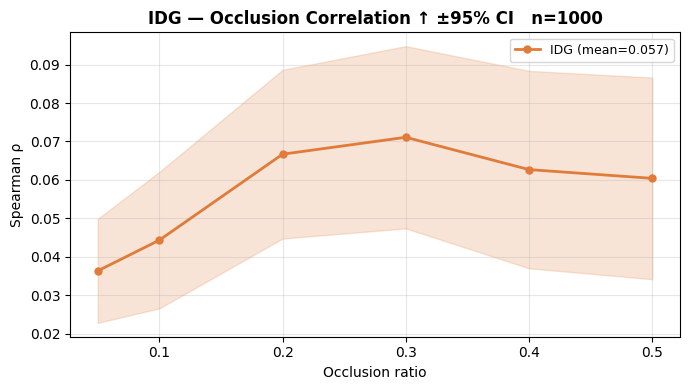


Ratio   Mean     ±95CI
  0.05  0.0363  ±0.0135
  0.10  0.0443  ±0.0177
  0.20  0.0667  ±0.0219
  0.30  0.0711  ±0.0237
  0.40  0.0627  ±0.0257
  0.50  0.0604  ±0.0262

  Overall mean ρ = 0.0569


In [ ]:
# ── IDG: Occlusion Correlation per Ratio (n=1000) ─────────────────────────
import pickle, numpy as np
from scipy import stats

CACHE_IDG_OCC = CACHE_DIR / "idg_occ_ratio.pkl"
FORCE         = False

OCCLUSION_RATIOS  = [0.05, 0.10, 0.20, 0.30, 0.40, 0.50]
OCCLUSION_STRIDE  = 7

if CACHE_IDG_OCC.exists() and not FORCE:
    idg_occ = pickle.load(open(CACHE_IDG_OCC, "rb"))
    print(f"[cache] {len(idg_occ[0])} images done")
else:
    idg_occ = [[] for _ in OCCLUSION_RATIOS]   # [ratio_idx] → [rho per image]

done = len(idg_occ[0])

model.eval()
for param in model.parameters(): param.requires_grad_(False)

for idx in tqdm(eval_idx[done:1000], desc="IDG OccCorr"):
    r = results[idx]; x, tgt = r["x"], r["target"]
    _, C, H, W = x.shape
    attr = raw_idg(model, x, tgt).sum(0)          # (H,W)

    for ri, ratio in enumerate(OCCLUSION_RATIOS):
        ps  = ratio_to_patch(ratio)
        om  = occlusion_map(model, x, tgt, ps=ps, stride=OCCLUSION_STRIDE).ravel()
        ag  = attr_to_grid(attr, ps, OCCLUSION_STRIDE, H, W).ravel()
        rho, _ = stats.spearmanr(om, ag)
        idg_occ[ri].append(0.0 if np.isnan(rho) else float(rho))

    pickle.dump(idg_occ, open(CACHE_IDG_OCC, "wb"))

for param in model.parameters(): param.requires_grad_(True)

# ── Plot ──
n   = len(idg_occ[0])
arr = np.array(idg_occ)                           # (n_ratios, n_imgs)
mu  = arr.mean(axis=1)
ci  = 1.96 * arr.std(axis=1) / np.sqrt(n)

fig, ax = plt.subplots(figsize=(7, 4), facecolor="white")
ax.plot(OCCLUSION_RATIOS, mu, "o-", color=COLORS_ALL["IDG"], lw=2, ms=5,
        label=f"IDG (mean={mu.mean():.3f})")
ax.fill_between(OCCLUSION_RATIOS, mu-ci, mu+ci, color=COLORS_ALL["IDG"], alpha=0.2)
ax.set_xlabel("Occlusion ratio"); ax.set_ylabel("Spearman ρ")
ax.set_title(f"IDG — Occlusion Correlation ↑ ±95% CI   n={n}", fontweight="bold")
ax.legend(fontsize=9); ax.grid(alpha=0.3)
plt.tight_layout(); plt.show()

print(f"\nRatio   Mean     ±95CI")
for ri, ratio in enumerate(OCCLUSION_RATIOS):
    print(f"  {ratio:.2f}  {mu[ri]:.4f}  ±{ci[ri]:.4f}")
print(f"\n  Overall mean ρ = {mu.mean():.4f}")

Guided IG attribution:   0%|          | 0/100 [00:00<?, ?it/s]

[cache] Saved attributions → /content/drive/MyDrive/klig_eval_cache/guided_ig_attrs.pkl
[cache] Saved Gini → /content/drive/MyDrive/klig_eval_cache/guided_ig_gini.pkl


infidelity:   0%|          | 0/100 [00:00<?, ?it/s]

[cache] Saved Infidelity → /content/drive/MyDrive/klig_eval_cache/guided_ig_infid.pkl


occ ratios:   0%|          | 0/6 [00:00<?, ?it/s]

[cache] Saved Occlusion Corr → /content/drive/MyDrive/klig_eval_cache/guided_ig_occ.pkl

Metric                        Mean   ±95% CI
--------------------------------------------
Gini (sparsity ↑)           0.4962    0.0130
Infidelity (↓)             1.52243   0.22708
Occ Corr mean-ratio (↑)     0.1276    0.0608


NameError: name 'all_gini' is not defined

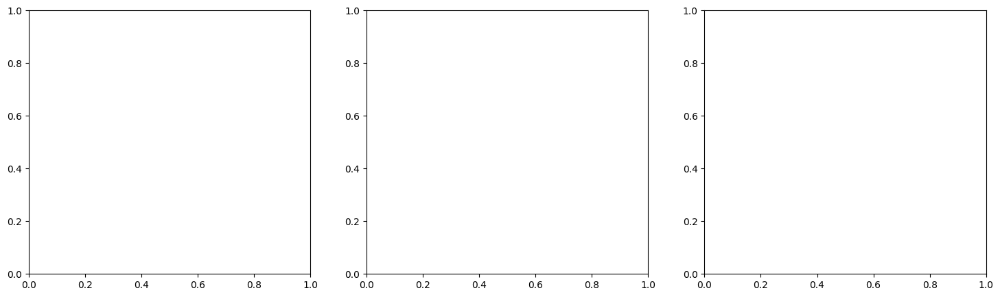

In [ ]:
# ── Guided IG: Attribution + Occlusion Corr + Infidelity + Gini ─────────────
import pandas as pd

GIG_COLOR = "#9B59B6"
METHOD    = "Guided IG"

# ── Inlined from eval_table.py (avoids broken module-level imports) ────────

def _attr_guided_ig(model, x, target, steps=50, fraction=0.25, max_dist_frac=0.1):
    dev    = next(model.parameters()).device
    x0     = (x if x.dim() == 4 else x.unsqueeze(0)).to(dev).detach()[0]
    x_curr = torch.zeros_like(x0)
    attr   = torch.zeros_like(x0)
    n_total = x0.numel()
    n_up    = max(1, int(fraction * n_total))
    model.eval()
    for _ in range(steps):
        dx = x0 - x_curr
        if dx.abs().max() < 1e-6:
            break
        x_t  = x_curr.unsqueeze(0).requires_grad_(True)
        grad = torch.autograd.grad(model(x_t)[0, target], x_t)[0][0].detach()
        gain   = (grad * dx).abs().view(-1)
        thresh = gain.kthvalue(max(1, n_total - n_up + 1)).values
        mask   = (gain >= thresh).view_as(x0).float()
        step   = dx * max_dist_frac * mask
        attr   = attr + grad * step
        x_curr = x_curr + step
    return attr.detach()

def _compute_occlusion_map(model, x, target, patch_size, stride, batch_size=64):
    dev = next(model.parameters()).device
    x   = x.to(dev)
    _, C, H, W = x.shape
    positions = [(h, w)
                 for h in range(0, H - patch_size + 1, stride)
                 for w in range(0, W - patch_size + 1, stride)]
    n_h = len(range(0, H - patch_size + 1, stride))
    n_w = len(range(0, W - patch_size + 1, stride))
    with torch.no_grad():
        f0 = model(x)[0, target].item()
        occ_scores = []
        for i in range(0, len(positions), batch_size):
            bpos  = positions[i : i + batch_size]
            batch = x.expand(len(bpos), -1, -1, -1).clone()
            for k, (h, w) in enumerate(bpos):
                batch[k, :, h : h + patch_size, w : w + patch_size] = 0.0
            occ_scores.append(model(batch)[:, target].cpu().numpy())
    occ_map = (f0 - np.concatenate(occ_scores)).reshape(n_h, n_w)
    return occ_map, n_h, n_w

def _occlusion_correlation(attr_map, occ_map, n_h, n_w, patch_size, stride):
    a         = attr_map.abs().float().unsqueeze(0).unsqueeze(0)
    pooled    = F.avg_pool2d(a, kernel_size=patch_size, stride=stride, padding=0)
    attr_grid = pooled[0, 0, :n_h, :n_w].detach().cpu().numpy()
    rho, _    = stats.spearmanr(occ_map.ravel(), attr_grid.ravel())
    return 0.0 if np.isnan(rho) else float(rho)

# ── 1. Attribution cache ───────────────────────────────────────────────────
_attr_cache = CACHE_DIR / "guided_ig_attrs.pkl"

if not FORCE_RECOMPUTE and _attr_cache.exists():
    with open(_attr_cache, "rb") as f:
        gig_attrs = pickle.load(f)
    print(f"[cache] Loaded {len(gig_attrs)} Guided IG attributions")
else:
    gig_attrs = {}
    for idx in tqdm(eval_idx[:N_subset], desc="Guided IG attribution"):
        r = results[idx]
        gig_attrs[idx] = _attr_guided_ig(model, r["x"], r["target"]).detach().cpu()
    with open(_attr_cache, "wb") as f:
        pickle.dump(gig_attrs, f)
    print(f"[cache] Saved attributions → {_attr_cache}")

# ── 2. Gini coefficient ────────────────────────────────────────────────────
_gini_cache = CACHE_DIR / "guided_ig_gini.pkl"

if not FORCE_RECOMPUTE and _gini_cache.exists():
    with open(_gini_cache, "rb") as f:
        gig_gini = pickle.load(f)
    print(f"[cache] Loaded Gini")
else:
    gig_gini = [gini_coefficient(absmax_collapse(gig_attrs[idx]))
                for idx in eval_idx[:N_subset]]
    with open(_gini_cache, "wb") as f:
        pickle.dump(gig_gini, f)
    print(f"[cache] Saved Gini → {_gini_cache}")

# ── 3. Infidelity ──────────────────────────────────────────────────────────
_infid_cache = CACHE_DIR / "guided_ig_infid.pkl"

if not FORCE_RECOMPUTE and _infid_cache.exists():
    with open(_infid_cache, "rb") as f:
        gig_infid = pickle.load(f)
    print(f"[cache] Loaded Infidelity")
else:
    gig_infid = []
    for idx in tqdm(eval_idx[:N_subset], desc="infidelity"):
        r  = results[idx]
        x  = r["x"]; tgt = r["target"]
        am = sum_collapse(gig_attrs[idx].to(x.device))
        gig_infid.append(infidelity(model, x, am, tgt))
    with open(_infid_cache, "wb") as f:
        pickle.dump(gig_infid, f)
    print(f"[cache] Saved Infidelity → {_infid_cache}")

# ── 4. Occlusion Correlation ───────────────────────────────────────────────
_occ_cache = CACHE_DIR / "guided_ig_occ.pkl"

if not FORCE_RECOMPUTE and _occ_cache.exists():
    with open(_occ_cache, "rb") as f:
        gig_occ = pickle.load(f)
    print(f"[cache] Loaded Occlusion Corr")
else:
    gig_occ = [[] for _ in OCCLUSION_RATIOS]
    dev = next(model.parameters()).device
    for ri, ratio in enumerate(tqdm(OCCLUSION_RATIOS, desc="occ ratios")):
        ps = ratio_to_patch(ratio)
        for idx in eval_idx[:N_subset]:
            r  = results[idx]; x = r["x"]; tgt = r["target"]
            occ_map, n_h, n_w = _compute_occlusion_map(
                model, x.to(dev), tgt, patch_size=ps, stride=OCCLUSION_STRIDE)
            am  = sum_collapse(gig_attrs[idx]).abs()
            rho = _occlusion_correlation(am, occ_map, n_h, n_w,
                                         patch_size=ps, stride=OCCLUSION_STRIDE)
            gig_occ[ri].append(rho)
    with open(_occ_cache, "wb") as f:
        pickle.dump(gig_occ, f)
    print(f"[cache] Saved Occlusion Corr → {_occ_cache}")

# ── 5. Summary ─────────────────────────────────────────────────────────────
gig_occ_arr = np.array(gig_occ)
occ_mean    = float(gig_occ_arr.mean())
occ_ci      = ci95(gig_occ_arr.mean(axis=0))
n           = len(eval_idx[:N_subset])

print(f"\n{'Metric':<25} {'Mean':>8}  {'±95% CI':>8}")
print("-" * 44)
print(f"{'Gini (sparsity ↑)':<25} {np.mean(gig_gini):>8.4f}  {ci95(gig_gini):>8.4f}")
print(f"{'Infidelity (↓)':<25} {np.mean(gig_infid):>8.5f}  {ci95(gig_infid):>8.5f}")
print(f"{'Occ Corr mean-ratio (↑)':<25} {occ_mean:>8.4f}  {occ_ci:>8.4f}")




#Class Sens


In [10]:
def load_imagenet_subset(n_images, dedup_classes=False):
    try:
        from datasets import load_dataset
        print(f"[dataset] HuggingFace {HF_DATASET_NAME} [{HF_SPLIT}]")
        ds = load_dataset(HF_DATASET_NAME, split=HF_SPLIT, streaming=True) \
         .shuffle(seed=42, buffer_size=50_000)
        seen, out = set(), []
        for ex in ds:
            y = int(ex["label"])
            if dedup_classes:
                if y in seen: continue
                seen.add(y)
            out.append((ex["image"].convert("RGB"), y))
            if len(out) >= n_images:
                break
        return out
    except Exception as e:
        print(f"[dataset] Failed: {e}")
        return []

# For the 10K CS run:
TIER_A  = 10000
N_IMGS  = 10000

raw_samples = load_imagenet_subset(TIER_A, dedup_classes=False)   # ← key change
dataset = []
with torch.no_grad():
    for i, (pil, gt) in enumerate(tqdm(raw_samples, desc="prep")):
        x = TRANSFORM(pil).unsqueeze(0).to(DEVICE)
        probs  = model(x).softmax(-1)[0]
        top1   = int(probs.argmax())
        target = gt if probs[gt].item() > 0.05 else top1
        dataset.append({
            "idx": i,
            "x": x,
            "target": target,
            "label_str": imagenet_labels[target],
        })

results = {row["idx"]: row for row in dataset}
eval_idx = list(range(min(N_IMGS, len(dataset))))
print(f"Dataset: {len(dataset)} images, evaluating {len(eval_idx)}")

[dataset] HuggingFace evanarlian/imagenet_1k_resized_256 [val]


Resolving data files:   0%|          | 0/52 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/52 [00:00<?, ?it/s]

prep:   0%|          | 0/10000 [00:00<?, ?it/s]

Dataset: 10000 images, evaluating 10000


In [12]:
# ── Build results_v2 (10K from HF streaming) ──
import pickle
from datasets import load_dataset

_results_v2_cache = CACHE_DIR / "results_v2.pkl"

if _results_v2_cache.exists():
    results_v2 = pickle.load(open(_results_v2_cache, "rb"))
    eval_idx_v2 = list(range(len(results_v2)))
    print(f"[cache] loaded {len(results_v2)} V2 entries")
else:
    N_TOTAL = 10000

    print(f"[dataset] HuggingFace {HF_DATASET_NAME} [{HF_SPLIT}], streaming {N_TOTAL}")
    ds = load_dataset(HF_DATASET_NAME, split=HF_SPLIT, streaming=True) \
         .shuffle(seed=42, buffer_size=50_000)

    raw_samples = []
    for ex in ds:
        raw_samples.append((ex["image"].convert("RGB"), int(ex["label"])))
        if len(raw_samples) >= N_TOTAL:
            break

    dev = next(model.parameters()).device
    results_v2 = {}
    with torch.no_grad():
        for i, (pil, gt) in enumerate(tqdm(raw_samples, desc="building V2 results")):
            x = TRANSFORM(pil).unsqueeze(0).to(dev)
            probs  = model(x).softmax(-1)[0]
            top1   = int(probs.argmax())
            target = gt if probs[gt].item() > 0.05 else top1
            results_v2[i] = {
                "x":      x,
                "target": target,
            }

    pickle.dump(results_v2, open(_results_v2_cache, "wb"))
    eval_idx_v2 = list(range(len(results_v2)))
    print(f"[built] {len(results_v2)} V2 entries saved")

print(f"len(results_v2): {len(results_v2)}")

[cache] loaded 10000 V2 entries
len(results_v2): 10000


In [13]:
# ── CS on 10K images: Step 1 (filter) + Step 2 (attribution) ──
import pickle, itertools, nltk
nltk.download("wordnet", quiet=True)
from nltk.corpus import wordnet as wn
from scipy.stats import spearmanr
from torchvision.models import ResNet50_Weights

# ── Caches ──
_cache_imgs_v2 = CACHE_DIR / "multiprob_imgs_v2.pkl"
_cache_v2      = CACHE_DIR / "multiprob_e2e_v2.pkl"
_cache_n_v2    = CACHE_DIR / "multiprob_e2e_n_v2.pkl"

PROB_THRESH = 0.1
SAVE_EVERY  = 25

# ── Setup ──
ATTR_FNS = {
    "KL-IG (adaptive)": lambda x, cls, sf: raw_klig(model, x, cls, sf),
    "KL-IG (σ=0.25)":   lambda x, cls, sf: raw_klig(model, x, cls, 0.25),
    "IDG":              lambda x, cls, sf: raw_idg(model, x, cls),
    "ExpGrad":          lambda x, cls, sf: raw_expgrad(model, x, cls),
    "IG-zero":          lambda x, cls, sf: raw_ig_zero(model, x, cls),
    "Blur-IG":          lambda x, cls, sf: raw_blur_ig(model, x, cls),
    "SmoothGrad":       lambda x, cls, sf: raw_smoothgrad(model, x, cls),
    "Vanilla Grad":     lambda x, cls, sf: raw_vanilla(model, x, cls),
}

imagenet_labels = ResNet50_Weights.IMAGENET1K_V2.meta["categories"]

def label_to_synset(label):
    phrase = label.lower().split(",")[0].strip()
    candidates = []
    for candidate in [phrase.replace(" ", "_"), phrase]:
        candidates.extend(wn.synsets(candidate, pos=wn.NOUN))
    if not candidates:
        for w in sorted(phrase.split(), key=len, reverse=True):
            if len(w) > 3:
                candidates.extend(wn.synsets(w, pos=wn.NOUN))
                if candidates: break
    if not candidates:
        return None
    return max(candidates, key=lambda s: s.min_depth())

cls_synsets = {i: label_to_synset(imagenet_labels[i]) for i in range(1000)}

# ── Step 1: filter to multi-class confused images ──
if _cache_imgs_v2.exists():
    multi_imgs_v2 = pickle.load(open(_cache_imgs_v2, "rb"))
    print(f"[cache] loaded {len(multi_imgs_v2)} V2 multi-class images")
else:
    multi_imgs_v2 = []
    for idx in tqdm(eval_idx_v2, desc="filtering V2"):
        r = results_v2[idx]
        x = r["x"]
        with torch.no_grad():
            probs = model(x).softmax(-1)[0].cpu()
        high = (probs > PROB_THRESH).nonzero(as_tuple=True)[0].tolist()
        if len(high) < 2: continue
        high = sorted(high, key=lambda c: probs[c].item(), reverse=True)
        if high[0] != r["target"]: continue        # top-1 == GT filter
        multi_imgs_v2.append({"idx": idx, "x": x,
                              "high_cls":   high,
                              "high_probs": [probs[c].item() for c in high]})
    pickle.dump(multi_imgs_v2, open(_cache_imgs_v2, "wb"))
    print(f"[computed] {len(multi_imgs_v2)} V2 multi-class images saved")

n_pairs_total = sum(len(list(itertools.combinations(d["high_cls"], 2)))
                    for d in multi_imgs_v2)
print(f"V2 Step 1 — {len(multi_imgs_v2)} images, {n_pairs_total} pairs total")

# ── Step 2: attribution divergence (resumable) ──
if _cache_v2.exists():
    scatter_v2 = pickle.load(open(_cache_v2, "rb"))
    done_imgs  = pickle.load(open(_cache_n_v2, "rb"))
    print(f"[resume] {sum(len(v) for v in scatter_v2.values())} points, "
          f"img {done_imgs}/{len(multi_imgs_v2)}")
else:
    scatter_v2 = {m: [] for m in ATTR_FNS}
    done_imgs  = 0

for d in tqdm(multi_imgs_v2[done_imgs:], desc="V2 all methods"):
    x        = d["x"]
    high_cls = d["high_cls"]
    top_cls  = high_cls[0]
    sf       = get_sigma_final("adaptive", model, x, top_cls)

    for ci, cj in itertools.combinations(high_cls, 2):
        s_i = cls_synsets.get(ci)
        s_j = cls_synsets.get(cj)
        if s_i is None or s_j is None: continue
        dist = s_i.shortest_path_distance(s_j)
        if dist is None: continue

        for mname, fn in ATTR_FNS.items():
            a_i = fn(x, ci, sf).clamp(min=0).sum(0).detach().cpu().numpy().ravel()
            a_j = fn(x, cj, sf).clamp(min=0).sum(0).detach().cpu().numpy().ravel()
            rho, _ = spearmanr(a_i, a_j)
            scatter_v2[mname].append((dist, 1.0 - float(rho)))

    done_imgs += 1
    if done_imgs % SAVE_EVERY == 0 or done_imgs == len(multi_imgs_v2):
        pickle.dump(scatter_v2, open(_cache_v2,   "wb"))
        pickle.dump(done_imgs,  open(_cache_n_v2, "wb"))

print(f"V2 Step 2 — {len(scatter_v2['KL-IG (adaptive)'])} pairs per method")

# ── Summary ──
print(f"\n{'Method':<22} {'rho':>8} {'p':>10} {'n':>6}")
print("-" * 50)
for mname, pts in scatter_v2.items():
    dists = np.array([p[0] for p in pts])
    divs  = np.array([p[1] for p in pts])
    rho_m, pval = spearmanr(dists, divs)
    print(f"  {mname:<20} {rho_m:>8.3f} {pval:>10.4f} {len(pts):>6}")

KeyboardInterrupt: 

In [14]:
# ── CS on V2 (10K → ~1136 confused images) — COSINE metric ──
import pickle, itertools, nltk
nltk.download("wordnet", quiet=True)
from nltk.corpus import wordnet as wn
from torchvision.models import ResNet50_Weights

# ── Caches (cosine version — distinct from Spearman cache) ──
_cache_imgs_v2 = CACHE_DIR / "multiprob_imgs_v2.pkl"          # reuse — same filter
_cache_v2      = CACHE_DIR / "multiprob_e2e_cos_v2.pkl"        # ← NEW: cosine
_cache_n_v2    = CACHE_DIR / "multiprob_e2e_cos_n_v2.pkl"      # ← NEW: cosine progress

PROB_THRESH = 0.1
SAVE_EVERY  = 25

# ── Cosine distance ──
def cosine_dist(a_i, a_j):
    ai = a_i.astype(np.float64)
    aj = a_j.astype(np.float64)
    norm = np.linalg.norm(ai) * np.linalg.norm(aj)
    if norm < 1e-12:
        return 1.0
    return float(1.0 - (ai @ aj) / norm)

# ── Setup (unchanged) ──
ATTR_FNS = {
    "KL-IG (adaptive)": lambda x, cls, sf: raw_klig(model, x, cls, sf),
    "KL-IG (σ=0.25)":   lambda x, cls, sf: raw_klig(model, x, cls, 0.25),
    "Guided IG":        lambda x, cls, sf: _attr_guided_ig(model, x, cls),
    "IDG":              lambda x, cls, sf: raw_idg(model, x, cls),
    "ExpGrad":          lambda x, cls, sf: raw_expgrad(model, x, cls),
    "IG-zero":          lambda x, cls, sf: raw_ig_zero(model, x, cls),
    "Blur-IG":          lambda x, cls, sf: raw_blur_ig(model, x, cls),
    "SmoothGrad":       lambda x, cls, sf: raw_smoothgrad(model, x, cls),
    "Vanilla Grad":     lambda x, cls, sf: raw_vanilla(model, x, cls),
}

imagenet_labels = ResNet50_Weights.IMAGENET1K_V2.meta["categories"]

def label_to_synset(label):
    phrase = label.lower().split(",")[0].strip()
    candidates = []
    for candidate in [phrase.replace(" ", "_"), phrase]:
        candidates.extend(wn.synsets(candidate, pos=wn.NOUN))
    if not candidates:
        for w in sorted(phrase.split(), key=len, reverse=True):
            if len(w) > 3:
                candidates.extend(wn.synsets(w, pos=wn.NOUN))
                if candidates: break
    if not candidates:
        return None
    return max(candidates, key=lambda s: s.min_depth())

cls_synsets = {i: label_to_synset(imagenet_labels[i]) for i in range(1000)}

# ── Step 1: filter (reuse existing cache — same filter as Spearman run) ──
if _cache_imgs_v2.exists():
    multi_imgs_v2 = pickle.load(open(_cache_imgs_v2, "rb"))
    print(f"[cache] loaded {len(multi_imgs_v2)} V2 multi-class images")
else:
    multi_imgs_v2 = []
    for idx in tqdm(eval_idx_v2, desc="filtering V2"):
        r = results_v2[idx]
        x = r["x"]
        with torch.no_grad():
            probs = model(x).softmax(-1)[0].cpu()
        high = (probs > PROB_THRESH).nonzero(as_tuple=True)[0].tolist()
        if len(high) < 2: continue
        high = sorted(high, key=lambda c: probs[c].item(), reverse=True)
        if high[0] != r["target"]: continue
        multi_imgs_v2.append({"idx": idx, "x": x,
                              "high_cls":   high,
                              "high_probs": [probs[c].item() for c in high]})
    pickle.dump(multi_imgs_v2, open(_cache_imgs_v2, "wb"))
    print(f"[computed] {len(multi_imgs_v2)} V2 multi-class images saved")

n_pairs_total = sum(len(list(itertools.combinations(d["high_cls"], 2)))
                    for d in multi_imgs_v2)
print(f"V2 Step 1 — {len(multi_imgs_v2)} images, {n_pairs_total} pairs total")

# ── Step 2: cosine attribution divergence (resumable) ──
if _cache_v2.exists():
    scatter_v2_cos = pickle.load(open(_cache_v2, "rb"))
    done_imgs      = pickle.load(open(_cache_n_v2, "rb"))
    print(f"[resume] {sum(len(v) for v in scatter_v2_cos.values())} points, "
          f"img {done_imgs}/{len(multi_imgs_v2)}")
else:
    scatter_v2_cos = {m: [] for m in ATTR_FNS}
    done_imgs      = 0

for d in tqdm(multi_imgs_v2[done_imgs:], desc="V2 cosine"):
    x        = d["x"]
    high_cls = d["high_cls"]
    top_cls  = high_cls[0]
    sf       = get_sigma_final("adaptive", model, x, top_cls)

    for ci, cj in itertools.combinations(high_cls, 2):
        s_i = cls_synsets.get(ci)
        s_j = cls_synsets.get(cj)
        if s_i is None or s_j is None: continue
        dist = s_i.shortest_path_distance(s_j)
        if dist is None: continue

        for mname, fn in ATTR_FNS.items():
            a_i = fn(x, ci, sf).clamp(min=0).sum(0).detach().cpu().numpy().ravel()
            a_j = fn(x, cj, sf).clamp(min=0).sum(0).detach().cpu().numpy().ravel()
            scatter_v2_cos[mname].append((dist, cosine_dist(a_i, a_j)))

    done_imgs += 1
    if done_imgs % SAVE_EVERY == 0 or done_imgs == len(multi_imgs_v2):
        pickle.dump(scatter_v2_cos, open(_cache_v2,   "wb"))
        pickle.dump(done_imgs,      open(_cache_n_v2, "wb"))

print(f"V2 Step 2 — {len(scatter_v2_cos['KL-IG (adaptive)'])} pairs per method")

# ── Summary ──
print(f"\n{'Method':<22} {'rho(WN, sim)':>14} {'p':>10} {'n':>6}")
print("-" * 56)
for mname, pts in scatter_v2_cos.items():
    dists = np.array([p[0] for p in pts])
    sims  = 1 - np.array([p[1] for p in pts])   # cosine similarity
    rho_m, pval = spearmanr(dists, sims)
    print(f"  {mname:<20} {rho_m:>14.3f} {pval:>10.4f} {len(pts):>6}")

[cache] loaded 1136 V2 multi-class images
V2 Step 1 — 1136 images, 1253 pairs total
[resume] 11277 points, img 1136/1136


V2 cosine: 0it [00:00, ?it/s]

V2 Step 2 — 1253 pairs per method

Method                   rho(WN, sim)          p      n
--------------------------------------------------------
  KL-IG (adaptive)             -0.388     0.0000   1253
  KL-IG (σ=0.25)               -0.275     0.0000   1253
  Guided IG                    -0.112     0.0001   1253
  IDG                          -0.253     0.0000   1253
  ExpGrad                      -0.274     0.0000   1253
  IG-zero                      -0.234     0.0000   1253
  Blur-IG                      -0.325     0.0000   1253
  SmoothGrad                   -0.248     0.0000   1253
  Vanilla Grad                 -0.258     0.0000   1253


[cache] V2 cosine loaded — methods: ['KL-IG (adaptive)', 'KL-IG (σ=0.25)', 'Guided IG', 'IDG', 'ExpGrad', 'IG-zero', 'Blur-IG', 'SmoothGrad', 'Vanilla Grad'], pairs/method: 1253


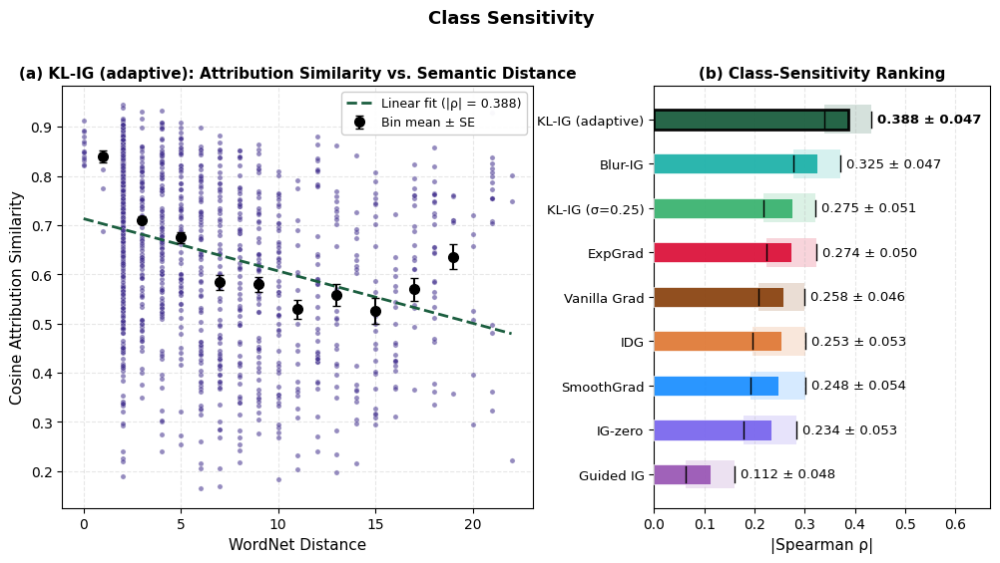

In [16]:
# ── Class Sensitivity (V2 cosine: 10K → 1136 confused images) ─────────────
import pickle, numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from scipy.stats import spearmanr, sem

# ── Config ──
N_BOOT   = 500
V2_CACHE = CACHE_DIR / "multiprob_e2e_cos_v2.pkl"   # ← cosine cache

COLORS = {
    "KL-IG (adaptive)": "#1B5E3F",
    "KL-IG (σ=0.25)":   "#3CB371",
    "Guided IG":        "#9B59B6",
    "IDG":              "#E07B39",
    "ExpGrad":          "#DC143C",
    "IG-zero":          "#7B68EE",
    "SmoothGrad":       "#1E90FF",
    "Vanilla Grad":     "#8B4513",
    "Blur-IG":          "#20B2AA",
}
PLOT_METHODS = list(COLORS.keys())

# ── Load V2 cosine cache ──
scatter_v2 = pickle.load(open(V2_CACHE, "rb"))
print(f"[cache] V2 cosine loaded — methods: {list(scatter_v2.keys())}, "
      f"pairs/method: {len(scatter_v2[next(iter(scatter_v2))])}")

# ── Compute ρ + bootstrap 95% CI ──
# scatter_v2[m] contains (wn_dist, cosine_distance)
# similarity = 1 - cosine_distance
rho_table, ci_table = {}, {}
rng = np.random.default_rng(0)

for mname in PLOT_METHODS:
    if mname not in scatter_v2:
        print(f"  [skip] {mname} not in cache")
        continue
    pts   = scatter_v2[mname]
    dists = np.array([p[0] for p in pts])
    sims  = 1 - np.array([p[1] for p in pts])    # similarity = 1 - distance
    rho, _ = spearmanr(dists, sims)
    rho_table[mname] = rho

    n = len(dists)
    boots = np.empty(N_BOOT)
    for b in range(N_BOOT):
        idx = rng.integers(0, n, size=n)
        boots[b] = abs(spearmanr(dists[idx], sims[idx]).correlation)
    ci_lo, ci_hi = np.percentile(boots, [2.5, 97.5])
    ci_table[mname] = (abs(rho) - ci_lo, ci_hi - abs(rho))

sorted_methods = sorted(rho_table.keys(), key=lambda m: abs(rho_table[m]), reverse=True)
HIGHLIGHT = sorted_methods[0]

rhos_abs = np.array([abs(rho_table[m]) for m in sorted_methods])
ci_lows  = np.array([abs(rho_table[m]) - ci_table[m][0] for m in sorted_methods])
ci_highs = np.array([abs(rho_table[m]) + ci_table[m][1] for m in sorted_methods])

# ── Plot ──
fig = plt.figure(figsize=(12, 5.5), facecolor="white")
gs  = gridspec.GridSpec(1, 2, width_ratios=[1.4, 1], wspace=0.3)
ax_main = fig.add_subplot(gs[0])
ax_rank = fig.add_subplot(gs[1])

# ─── Left: scatter + trend for highlighted method ───
pts   = scatter_v2[HIGHLIGHT]
dists = np.array([p[0] for p in pts])
sims  = 1 - np.array([p[1] for p in pts])
rho, _ = spearmanr(dists, sims)

ax_main.scatter(dists, sims, alpha=0.55, s=14, color="#3F2D8C",
                edgecolors="white", linewidths=0.3, zorder=2)

BIN_EDGES = np.arange(0, 22, 2)
ctrs, means, ses = [], [], []
for lo, hi in zip(BIN_EDGES[:-1], BIN_EDGES[1:]):
    mask = (dists >= lo) & (dists < hi)
    if mask.sum() < 5: continue
    ctrs.append((lo + hi) / 2)
    means.append(sims[mask].mean())
    ses.append(sem(sims[mask]))
ctrs, means, ses = np.array(ctrs), np.array(means), np.array(ses)

ax_main.errorbar(ctrs, means, yerr=ses, fmt="o", color="black",
                 ms=7, lw=1.5, capsize=3, zorder=5, label="Bin mean ± SE")

z  = np.polyfit(dists, sims, 1)
xs = np.linspace(dists.min(), dists.max(), 100)
ax_main.plot(xs, np.poly1d(z)(xs), "--", color=COLORS[HIGHLIGHT], lw=2,
             zorder=4, label=f"Linear fit (|ρ| = {abs(rho):.3f})")

ax_main.set_xlabel("WordNet Distance", fontsize=11)
ax_main.set_ylabel("Cosine Attribution Similarity", fontsize=11)   # ← updated
ax_main.set_title(f"(a) {HIGHLIGHT}: Attribution Similarity vs. Semantic Distance",
                  fontsize=11, fontweight="bold")
ax_main.legend(fontsize=9, loc="upper right", framealpha=0.95)
ax_main.grid(True, alpha=0.3, linestyle="--")

# ─── Right: ranking with shaded CI bands ───
y_pos = np.arange(len(sorted_methods))
bar_colors  = [COLORS[m] for m in sorted_methods]
edge_colors = ["black" if m == HIGHLIGHT else "white" for m in sorted_methods]
edge_widths = [2.0 if m == HIGHLIGHT else 0.5 for m in sorted_methods]

for yi, m, lo, hi in zip(y_pos, sorted_methods, ci_lows, ci_highs):
    ax_rank.barh(yi, hi - lo, left=lo, height=0.65,
                 color=COLORS[m], alpha=0.18, edgecolor="none", zorder=1)

ax_rank.barh(y_pos, rhos_abs,
             color=bar_colors, edgecolor=edge_colors,
             linewidth=edge_widths, height=0.45, alpha=0.95, zorder=3)

for yi, lo, hi in zip(y_pos, ci_lows, ci_highs):
    ax_rank.plot([lo, lo], [yi - 0.18, yi + 0.18], color="black", lw=1.0, zorder=4)
    ax_rank.plot([hi, hi], [yi - 0.18, yi + 0.18], color="black", lw=1.0, zorder=4)

ax_rank.set_yticks(y_pos)
ax_rank.set_yticklabels(sorted_methods, fontsize=9.5)
ax_rank.invert_yaxis()
ax_rank.set_xlabel("|Spearman ρ|", fontsize=11)
ax_rank.set_title("(b) Class-Sensitivity Ranking", fontsize=11, fontweight="bold")
ax_rank.grid(True, axis="x", alpha=0.3, linestyle="--")
ax_rank.set_xlim(0, ci_highs.max() * 1.55)

for yi, m, rho_val, hi in zip(y_pos, sorted_methods, rhos_abs, ci_highs):
    weight = "bold" if m == HIGHLIGHT else "normal"
    err = (ci_table[m][0] + ci_table[m][1]) / 2
    ax_rank.text(hi + 0.012, yi, f"{rho_val:.3f} ± {err:.3f}",
                 va="center", ha="left", fontsize=9.5, fontweight=weight)

plt.suptitle(f"Class Sensitivity",
             fontsize=13, fontweight="bold", y=1.02)
plt.savefig("class_sensitivity_v2.svg", dpi=200, bbox_inches="tight")
plt.show()

Candidates with WN dist > 5: 507
Computing attribution maps...
Max # high-prob classes in any image: 2


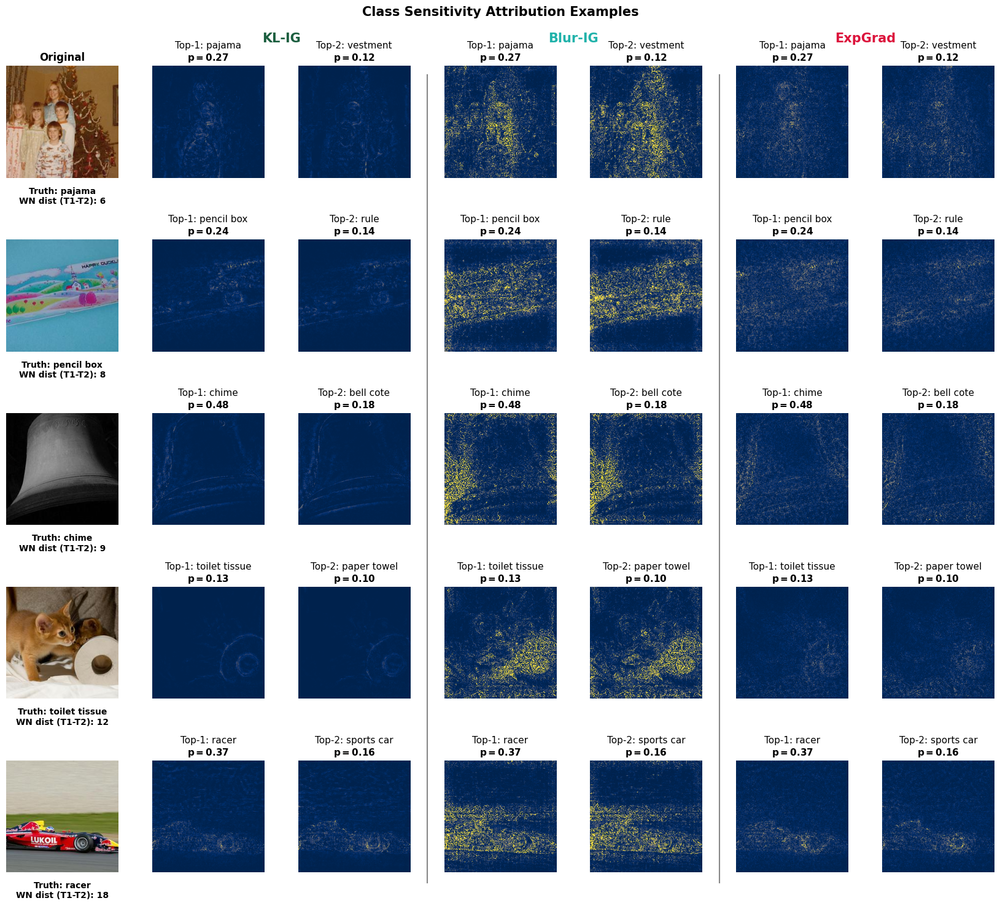


#cls   WN(T1-T2)  Truth                   Classes (prob)                                              
----------------------------------------------------------------------------------------------------
   2           6  pajama                  pajama(0.27), vestment(0.12)                                
   2           8  pencil box              pencil b(0.24), rule(0.14)                                  
   2           9  chime                   chime(0.48), bell cot(0.18)                                 
   2          12  toilet tissue           toilet t(0.13), paper to(0.10)                              
   2          18  racer                   racer(0.37), sports c(0.16)                                 


In [ ]:
# ── Class Sensitivity Visualization: KL-IG vs Blur-IG vs ExpGrad ──
import random
import numpy as np
import torch
import matplotlib.pyplot as plt

# ── Config ──
N_IMGS_VIZ = 5
MIN_SPREAD = 5

METHODS = ["KL-IG", "Blur-IG", "ExpGrad"]
METHOD_COLORS = {
    "KL-IG":   "#1B5E3F",
    "Blur-IG": "#20B2AA",
    "ExpGrad": "#DC143C",
}

_MEAN = torch.tensor([0.485, 0.456, 0.406])[:, None, None]
_STD  = torch.tensor([0.229, 0.224, 0.225])[:, None, None]

def _denorm(x_chw):
    return ((x_chw.detach().cpu() * _STD + _MEAN).clamp(0, 1).permute(1, 2, 0).numpy())

# ── Find images with high WN distance between top-1 and top-2 ──
random.seed(7)
candidates = []
for d in multi_imgs_v2:
    if len(d["high_cls"]) < 2: continue
    truth = results_v2[d["idx"]]["target"]
    if truth != d["high_cls"][0]: continue

    s_i = cls_synsets.get(d["high_cls"][0])
    s_j = cls_synsets.get(d["high_cls"][1])
    if s_i is None or s_j is None: continue
    dist = s_i.shortest_path_distance(s_j)
    if dist is None or dist <= MIN_SPREAD: continue

    candidates.append((dist, d, truth))

candidates.sort(key=lambda t: t[0])
n = len(candidates)
print(f"Candidates with WN dist > {MIN_SPREAD}: {n}")

percentiles = np.linspace(0.1, 0.9, N_IMGS_VIZ)
selected = [candidates[int(p * (n - 1))] for p in percentiles]

# ── Compute attribution maps for ALL high-prob classes per image ──
def attr_map(method, x, target_cls, sf):
    if method == "KL-IG":   return raw_klig(model, x, target_cls, sf).clamp(min=0).sum(0).detach().cpu().numpy()
    if method == "Blur-IG": return raw_blur_ig(model, x, target_cls).clamp(min=0).sum(0).detach().cpu().numpy()
    if method == "ExpGrad": return raw_expgrad(model, x, target_cls).clamp(min=0).sum(0).detach().cpu().numpy()
    raise ValueError(method)

print("Computing attribution maps...")
viz_data = []
max_n_cls = 0
for dist_top12, d, truth in selected:
    x          = d["x"]
    high_cls   = d["high_cls"]
    high_probs = d["high_probs"]
    sf         = get_sigma_final("adaptive", model, x, high_cls[0])

    wn_dists = {}
    for i, ci in enumerate(high_cls):
        for j, cj in enumerate(high_cls):
            if i == j: continue
            s_i, s_j = cls_synsets.get(ci), cls_synsets.get(cj)
            if s_i and s_j:
                wn_dists[(i, j)] = s_i.shortest_path_distance(s_j)

    maps = {}
    for method in METHODS:
        for cls in high_cls:
            maps[(method, cls)] = attr_map(method, x, cls, sf)

    viz_data.append({
        "x": x, "truth": truth,
        "high_cls": high_cls, "high_probs": high_probs,
        "wn_dists": wn_dists, "maps": maps,
    })
    max_n_cls = max(max_n_cls, len(high_cls))

print(f"Max # high-prob classes in any image: {max_n_cls}")

# ── Plot layout ─────────────────────────────────────────────────────────
N_ROWS = N_IMGS_VIZ
N_METHODS = len(METHODS)
N_COLS = 1 + N_METHODS * max_n_cls

fig, axes = plt.subplots(N_ROWS, N_COLS,
                         figsize=(2.4 * N_COLS, 2.8 * N_ROWS),
                         facecolor="white")
if N_ROWS == 1:
    axes = axes[np.newaxis, :]

def add_banner(text, col_start, col_end, color, y_offset=0.025):
    ax_l = axes[0, col_start]; ax_r = axes[0, col_end]
    bb_l = ax_l.get_position(); bb_r = ax_r.get_position()
    fig.text((bb_l.x0 + bb_r.x1) / 2, bb_l.y1 + y_offset, text,
             fontsize=15, fontweight="bold", ha="center", va="bottom", color=color)

for row, item in enumerate(viz_data):
    img        = _denorm(item["x"][0])
    truth_lbl  = imagenet_labels[item["truth"]].split(",")[0]
    high_cls   = item["high_cls"]
    high_probs = item["high_probs"]
    n_cls      = len(high_cls)
    wn_top12   = item["wn_dists"].get((0, 1), "?")

    # Col 0: original — info BELOW image
    ax = axes[row, 0]
    ax.imshow(img)
    ax.set_xticks([]); ax.set_yticks([])
    for sp in ax.spines.values(): sp.set_visible(False)
    ax.text(0.5, -0.08,
            f"Truth: {truth_lbl}\nWN dist (T1-T2): {wn_top12}",
            transform=ax.transAxes,
            fontsize=10, fontweight="bold", va="top", ha="center")

    # Per-row vmax
    row_maps = list(item["maps"].values())
    vmax = max(np.percentile(np.concatenate([m.ravel() for m in row_maps]), 99),
               1e-12)

    for m_i, method in enumerate(METHODS):
        for c_i in range(max_n_cls):
            col = 1 + m_i * max_n_cls + c_i
            ax  = axes[row, col]

            if c_i < n_cls:
                cls = high_cls[c_i]
                ax.imshow(item["maps"][(method, cls)], cmap="cividis",
                          vmin=0, vmax=vmax)
                short = imagenet_labels[cls].split(",")[0][:18]
                p     = high_probs[c_i]
                ax.set_title(f"Top-{c_i+1}: {short}\n"
                             + r"$\mathbf{p=" + f"{p:.2f}" + r"}$",
                             fontsize=11)
            ax.axis("off")

axes[0, 0].set_title("Original", fontsize=12, fontweight="bold")


plt.tight_layout()
plt.subplots_adjust(hspace=0.55)   # ← add this — bumps vertical gap between rows

# Method banners — one per method block
for m_i, method in enumerate(METHODS):
    col_start = 1 + m_i * max_n_cls
    col_end   = col_start + max_n_cls - 1
    add_banner(method, col_start, col_end, color=METHOD_COLORS[method])

# Vertical separators between method blocks
for m_i in range(1, N_METHODS):
    sep_col_left  = m_i * max_n_cls
    sep_col_right = sep_col_left + 1
    bb_l = axes[0, sep_col_left].get_position()
    bb_r = axes[0, sep_col_right].get_position()
    sep_x = (bb_l.x1 + bb_r.x0) / 2
    fig.add_artist(plt.Line2D([sep_x, sep_x], [0.02, 0.96],
                              color="#888", linewidth=1.5, linestyle="-",
                              transform=fig.transFigure))

plt.suptitle("Class Sensitivity Attribution Examples",
             fontsize=15, fontweight="bold", y=1.04)
plt.savefig("class_sensitivity_examples_3methods.png", dpi=200, bbox_inches="tight")
plt.show()

# ── Summary ──
print(f"\n{'#cls':>4}  {'WN(T1-T2)':>10}  {'Truth':<22}  {'Classes (prob)':<60}")
print("-" * 100)
for item in viz_data:
    truth_lbl = imagenet_labels[item["truth"]].split(",")[0][:20]
    n_cls     = len(item["high_cls"])
    wn_12     = item["wn_dists"].get((0, 1), "?")
    cls_strs  = ", ".join(f"{imagenet_labels[c].split(',')[0][:8]}({p:.2f})"
                          for c, p in zip(item["high_cls"], item["high_probs"]))
    print(f"{n_cls:>4}  {wn_12:>10}  {truth_lbl:<22}  {cls_strs:<60}")

Candidates: 1
Selected: dung beetle, WN(T1-T2) = 10
Computing attribution maps...


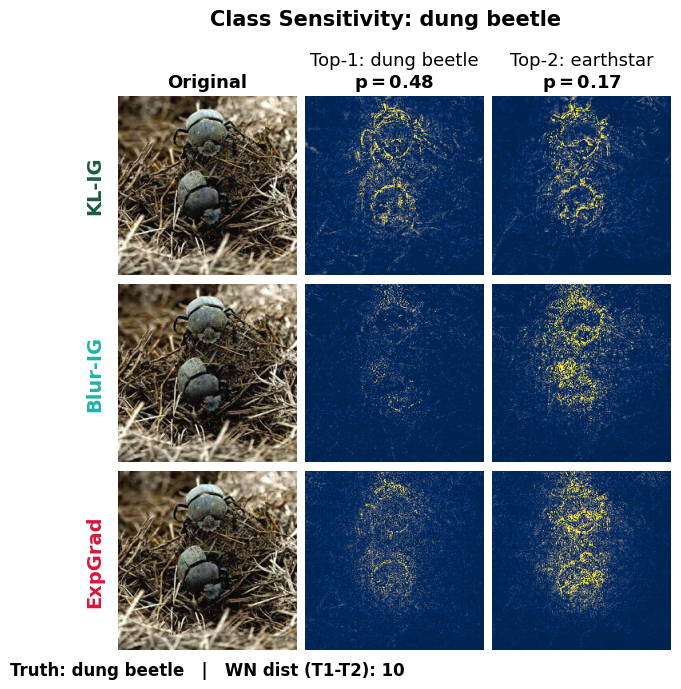


Truth: dung beetle
WN dist (T1-T2) = 10
Classes:
  dung beetle               p=0.485
  earthstar                 p=0.168


In [18]:
# ── Single-image class sensitivity: 3 methods stacked, each row = orig + maps ──
import numpy as np
import torch
import matplotlib.pyplot as plt

# ── Config ──
MIN_SPREAD = 5
PICK_RANK  = -1

METHODS = ["KL-IG", "Blur-IG", "ExpGrad"]
METHOD_COLORS = {
    "KL-IG":   "#1B5E3F",
    "Blur-IG": "#20B2AA",
    "ExpGrad": "#DC143C",
}

_MEAN = torch.tensor([0.485, 0.456, 0.406])[:, None, None]
_STD  = torch.tensor([0.229, 0.224, 0.225])[:, None, None]

def _denorm(x_chw):
    return ((x_chw.detach().cpu() * _STD + _MEAN).clamp(0, 1).permute(1, 2, 0).numpy())

# ── Find candidate by truth label ──
TARGET_LABEL = "dung beetle"

candidates = []
for d in multi_imgs_v2:
    if len(d["high_cls"]) < 2: continue
    truth = results_v2[d["idx"]]["target"]
    if truth != d["high_cls"][0]: continue
    if imagenet_labels[truth].split(",")[0] != TARGET_LABEL: continue
    s_i = cls_synsets.get(d["high_cls"][0])
    s_j = cls_synsets.get(d["high_cls"][1])
    if s_i is None or s_j is None: continue
    dist = s_i.shortest_path_distance(s_j)
    if dist is None: continue
    candidates.append((dist, d, truth))

if not candidates:
    raise ValueError(f"No candidates found for truth label '{TARGET_LABEL}'")


candidates.sort(key=lambda t: t[0])
print(f"Candidates: {len(candidates)}")

dist_top12, d, truth = candidates[PICK_RANK]
truth_lbl = imagenet_labels[truth].split(",")[0]
print(f"Selected: {truth_lbl}, WN(T1-T2) = {dist_top12}")

# ── Compute attribution maps ──
def attr_map(method, x, target_cls, sf):
    if method == "KL-IG":   return raw_klig(model, x, target_cls, sf).clamp(min=0).sum(0).detach().cpu().numpy()
    if method == "Blur-IG": return raw_blur_ig(model, x, target_cls).clamp(min=0).sum(0).detach().cpu().numpy()
    if method == "ExpGrad": return raw_expgrad(model, x, target_cls).clamp(min=0).sum(0).detach().cpu().numpy()
    raise ValueError(method)

x          = d["x"]
high_cls   = d["high_cls"]
high_probs = d["high_probs"]
n_cls      = len(high_cls)
sf         = get_sigma_final("adaptive", model, x, high_cls[0])

print("Computing attribution maps...")
maps = {}
for method in METHODS:
    for cls in high_cls:
        maps[(method, cls)] = attr_map(method, x, cls, sf)

# ── Plot: 3 rows × (1 + K) cols, original repeated in each row ──
N_ROWS = len(METHODS)
N_COLS = 1 + n_cls

fig, axes = plt.subplots(N_ROWS, N_COLS,
                         figsize=(2.4 * N_COLS, 2.4 * N_ROWS),
                         facecolor="white",
                         gridspec_kw={"wspace": 0.02, "hspace": 0.05})
img = _denorm(x[0])

# Per-method vmax
vmax_per_method = {}
for method in METHODS:
    method_maps = [maps[(method, cls)] for cls in high_cls]
    vmax_per_method[method] = max(
        np.percentile(np.concatenate([m.ravel() for m in method_maps]), 99),
        1e-12)

for m_i, method in enumerate(METHODS):
    # Col 0: original (repeated each row)
    ax = axes[m_i, 0]
    ax.imshow(img)
    ax.set_xticks([]); ax.set_yticks([])
    for sp in ax.spines.values(): sp.set_visible(False)

    # Method label as bold colored y-label
    ax.set_ylabel(method, fontsize=14, fontweight="bold",
                  rotation=90, labelpad=10,
                  color=METHOD_COLORS[method])

    if m_i == 0:
        ax.set_title("Original", fontsize=13, fontweight="bold")

    # Truth + WN below ONLY on the bottom row's original
    if m_i == N_ROWS - 1:
        ax.text(0.5, -0.06,
                f"Truth: {truth_lbl}   |   WN dist (T1-T2): {dist_top12}",
                transform=ax.transAxes,
                fontsize=12, fontweight="bold", va="top", ha="center")

    # Cols 1..n_cls: attribution maps
    for c_i, cls in enumerate(high_cls):
        ax = axes[m_i, 1 + c_i]
        ax.imshow(maps[(method, cls)], cmap="cividis",
                  vmin=0, vmax=vmax_per_method[method])
        ax.axis("off")

        # Class title on top row only
        if m_i == 0:
            short = imagenet_labels[cls].split(",")[0][:22]
            p     = high_probs[c_i]
            ax.set_title(f"Top-{c_i+1}: {short}\n"
                         + r"$\mathbf{p=" + f"{p:.2f}" + r"}$",
                         fontsize=13)

plt.suptitle(f"Class Sensitivity: {truth_lbl}",
             fontsize=15, fontweight="bold", y=1.00)
plt.tight_layout()
plt.subplots_adjust(hspace=0.15)
plt.savefig("class_sensitivity_single.svg", dpi=200, bbox_inches="tight")
plt.show()

# ── Summary ──
print(f"\nTruth: {truth_lbl}")
print(f"WN dist (T1-T2) = {dist_top12}")
print(f"Classes:")
for c, p in zip(high_cls, high_probs):
    print(f"  {imagenet_labels[c].split(',')[0]:<25} p={p:.3f}")

[IDG]       n_gini=1000  n_occ=1000
[Guided IG] n=1000

           Method      Occ Corr      Infidelity          Gini    n
KL-IG (adaptive) 0.189 ± 0.026 0.3012 ± 0.0418 0.562 ± 0.005 1000
  KL-IG (σ=0.25) 0.194 ± 0.026 0.2818 ± 0.0327 0.517 ± 0.004 1000
             IDG 0.019 ± 0.007 3.2128 ± 0.6042 0.624 ± 0.003 1000
       Guided IG 0.180 ± 0.026 1.5838 ± 0.0731 0.491 ± 0.004 1000
         Blur-IG 0.171 ± 0.025 0.7617 ± 0.0520 0.587 ± 0.004 1000
         ExpGrad 0.177 ± 0.026 0.3054 ± 0.0340 0.434 ± 0.004 1000
         IG-zero 0.106 ± 0.024 6.1216 ± 0.8347 0.529 ± 0.003 1000
      SmoothGrad 0.193 ± 0.025 0.2880 ± 0.0327 0.475 ± 0.004 1000
    Vanilla Grad 0.086 ± 0.024 1.9157 ± 0.2691 0.451 ± 0.003 1000


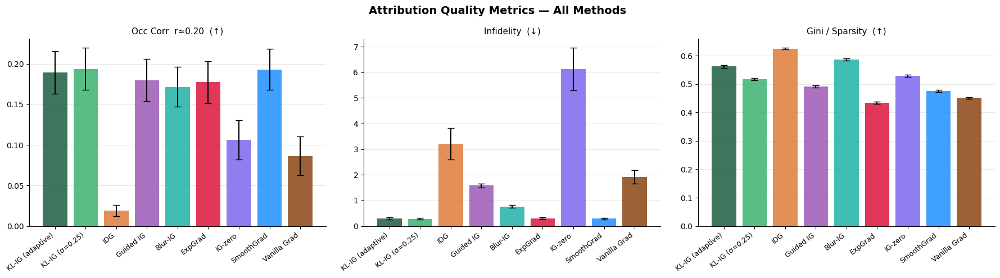

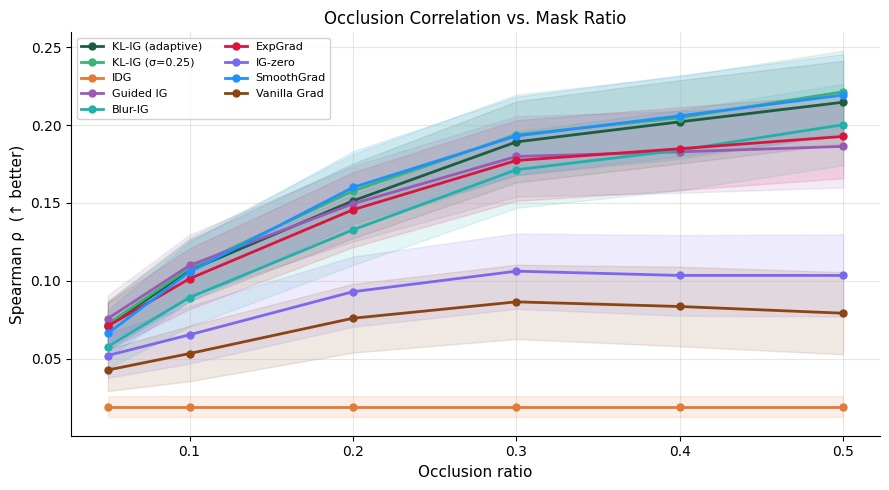


Saved: appendix_metrics_bar.pdf  +  appendix_occ_ratio.pdf


In [ ]:
# ══════════════════════════════════════════════════════════════════════════════
# Appendix: Table + Figures  (Occ Corr / Infidelity / Gini)
# ══════════════════════════════════════════════════════════════════════════════
import pickle, numpy as np, scipy.stats as st, matplotlib.pyplot as plt, pandas as pd

def _load(p):
    with open(p, "rb") as f: return pickle.load(f)

# ── Base caches (n=1000 each) ─────────────────────────────────────────────────
all_gini     = _load(CACHE_DIR / "gini.pkl")
all_infid    = _load(CACHE_DIR / "infid.pkl")
occ_by_ratio = _load(CACHE_DIR / "occlusion.pkl")

# ── IDG override ──────────────────────────────────────────────────────────────
_idg = CACHE_DIR / "idg_app_metrics.pkl"
if _idg.exists():
    d = _load(_idg)
    all_gini["IDG"]     = d["gini"]
    all_infid["IDG"]    = d["infid"]
    occ_by_ratio["IDG"] = [list(d["occ"]) for _ in OCCLUSION_RATIOS]
    print(f"[IDG]       n_gini={len(d['gini'])}  n_occ={len(d['occ'])}")

# ── Guided IG ─────────────────────────────────────────────────────────────────
GIG = "Guided IG"
_gg, _gi, _go = (CACHE_DIR/"guided_ig_gini_upd.pkl",
                 CACHE_DIR/"guided_ig_infid_upd.pkl",
                 CACHE_DIR/"guided_ig_upd.pkl")
if _gg.exists() and _gi.exists() and _go.exists():
    all_gini[GIG]  = _load(_gg)
    all_infid[GIG] = _load(_gi)
    _raw = _load(_go)
    occ_by_ratio[GIG] = _raw if (isinstance(_raw, list) and isinstance(_raw[0], list)) \
                              else [list(_raw) for _ in OCCLUSION_RATIOS]
    print(f"[Guided IG] n={len(all_gini[GIG])}")
else:
    GIG = None; print("[Guided IG] cache missing — skipped")

# ── Method order & colors ─────────────────────────────────────────────────────
METHOD_ORDER = ["KL-IG (adaptive)", "KL-IG (σ=0.25)", "IDG", "Guided IG",
                "Blur-IG", "ExpGrad", "IG-zero", "SmoothGrad", "Vanilla Grad"]
COLORS = {"KL-IG (adaptive)": "#1B5E3F", "KL-IG (σ=0.25)": "#3CB371",
          "IDG": "#E07B39", "Guided IG": "#9B59B6", "Blur-IG": "#20B2AA",
          "ExpGrad": "#DC143C", "IG-zero": "#7B68EE",
          "SmoothGrad": "#1E90FF", "Vanilla Grad": "#8B4513"}

avail = [m for m in METHOD_ORDER
         if m in all_gini and m in all_infid and m in occ_by_ratio]

# ── Stats ─────────────────────────────────────────────────────────────────────
def _stats(vals):
    v = np.array([x for x in vals if x is not None and not np.isnan(x)], dtype=float)
    if len(v) < 2: return float("nan"), float("nan")
    m = v.mean()
    ci = st.t.interval(0.95, df=len(v)-1, loc=m, scale=st.sem(v))
    return float(m), float((ci[1]-ci[0])/2)

OCC_RI = len(OCCLUSION_RATIOS) // 2   # middle ratio ≈ 0.20

rows = []
for m in avail:
    om, oe = _stats(occ_by_ratio[m][OCC_RI])
    gm, ge = _stats(all_gini[m])
    im, ie = _stats(all_infid[m])
    rows.append({"Method": m, "n": len(all_gini[m]),
                 "Occ Corr":   f"{om:.3f} ± {oe:.3f}",
                 "Infidelity": f"{im:.4f} ± {ie:.4f}",
                 "Gini":       f"{gm:.3f} ± {ge:.3f}",
                 "_om":om,"_oe":oe,"_im":im,"_ie":ie,"_gm":gm,"_ge":ge})

print("\n", pd.DataFrame(rows)[["Method","Occ Corr","Infidelity","Gini","n"]].to_string(index=False))

# ── Figure 1: Bar chart (3 panels) ───────────────────────────────────────────
fig, axes = plt.subplots(1, 3, figsize=(18, 5), facecolor="white")
fig.suptitle("Attribution Quality Metrics — All Methods", fontsize=14, fontweight="bold")

for ax, (title, mk, ek) in zip(axes, [
    ("Occ Corr  r≈0.20  (↑)", "_om", "_oe"),
    ("Infidelity  (↓)",        "_im", "_ie"),
    ("Gini / Sparsity  (↑)",   "_gm", "_ge"),
]):
    names  = [r["Method"] for r in rows]
    means  = [r[mk] for r in rows]
    errs   = [r[ek] for r in rows]
    colors = [COLORS.get(n, "#888") for n in names]
    x = np.arange(len(names))
    ax.bar(x, means, color=colors, alpha=0.85, zorder=2)
    ax.errorbar(x, means, yerr=errs, fmt="none", color="k", capsize=4, lw=1.5, zorder=3)
    ax.set_xticks(x)
    ax.set_xticklabels(names, rotation=38, ha="right", fontsize=9)
    ax.set_title(title, fontsize=11)
    ax.grid(axis="y", alpha=0.3, zorder=0)
    ax.spines[["top","right"]].set_visible(False)

plt.tight_layout()
plt.savefig(CACHE_DIR / "appendix_metrics_bar.pdf", bbox_inches="tight")
plt.show()

# ── Figure 2: Occ Corr vs ratio ───────────────────────────────────────────────
fig2, ax2 = plt.subplots(figsize=(9, 5), facecolor="white")
for m in avail:
    ms = [np.nanmean(occ_by_ratio[m][ri]) for ri in range(len(OCCLUSION_RATIOS))]
    es = [_stats(occ_by_ratio[m][ri])[1]  for ri in range(len(OCCLUSION_RATIOS))]
    col = COLORS.get(m, "#888")
    ax2.plot(OCCLUSION_RATIOS, ms, "o-", color=col, lw=2, label=m, markersize=5)
    ax2.fill_between(OCCLUSION_RATIOS,
                     [v-e for v,e in zip(ms,es)], [v+e for v,e in zip(ms,es)],
                     color=col, alpha=0.12)
ax2.set_xlabel("Occlusion ratio", fontsize=11)
ax2.set_ylabel("Spearman ρ  (↑ better)", fontsize=11)
ax2.set_title("Occlusion Correlation vs. Mask Ratio", fontsize=12)
ax2.legend(fontsize=8, ncol=2, framealpha=0.9)
ax2.grid(alpha=0.3)
ax2.spines[["top","right"]].set_visible(False)
plt.tight_layout()
plt.savefig(CACHE_DIR / "appendix_occ_ratio.pdf", bbox_inches="tight")
plt.show()

print("\nSaved: appendix_metrics_bar.pdf  +  appendix_occ_ratio.pdf")

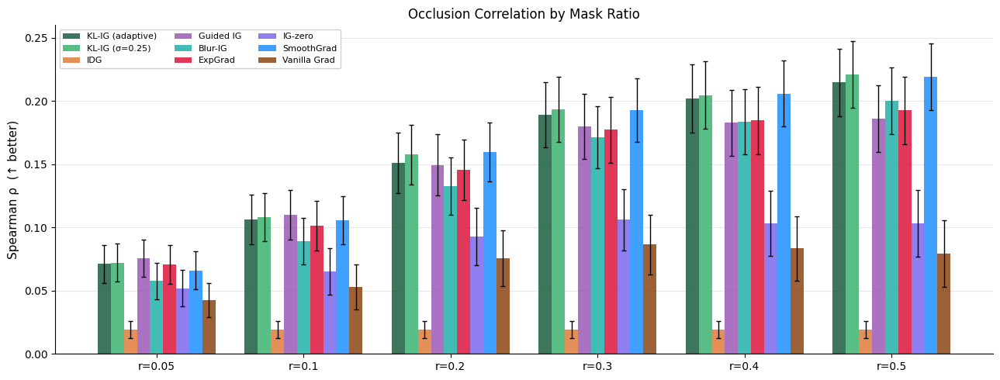

Saved: appendix_occ_bars.pdf


In [ ]:
# ── Figure 3: Occ Corr bars per ratio ────────────────────────────────────────
n_ratios = len(OCCLUSION_RATIOS)
n_methods = len(avail)
bar_w = 0.8 / n_methods
x = np.arange(n_ratios)

fig3, ax3 = plt.subplots(figsize=(13, 5), facecolor="white")
for i, m in enumerate(avail):
    ms = [np.nanmean(occ_by_ratio[m][ri]) for ri in range(n_ratios)]
    es = [_stats(occ_by_ratio[m][ri])[1]  for ri in range(n_ratios)]
    offset = (i - n_methods/2 + 0.5) * bar_w
    ax3.bar(x + offset, ms, width=bar_w, color=COLORS.get(m,"#888"),
            alpha=0.85, label=m, zorder=2)
    ax3.errorbar(x + offset, ms, yerr=es, fmt="none", color="k",
                 capsize=2, lw=1, zorder=3)

ax3.set_xticks(x)
ax3.set_xticklabels([f"r={r}" for r in OCCLUSION_RATIOS], fontsize=10)
ax3.set_ylabel("Spearman ρ  (↑ better)", fontsize=11)
ax3.set_title("Occlusion Correlation by Mask Ratio", fontsize=12)
ax3.legend(fontsize=8, ncol=3, framealpha=0.9)
ax3.grid(axis="y", alpha=0.3, zorder=0)
ax3.spines[["top","right"]].set_visible(False)
plt.tight_layout()
plt.savefig(CACHE_DIR / "appendix_occ_bars.pdf", bbox_inches="tight")
plt.show()
print("Saved: appendix_occ_bars.pdf")